## Behavioral Research in Statistical Methods
## Mini Project Codebase
### Mayank Mittal
### 2022101094

### Importing important libraries

In [54]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import json
from ast import literal_eval

### Dataset of credits data loading....

In [55]:
credits  = pd.read_csv('tmdb_5000_credits.csv')

In [56]:
credits.head()

,movie_id,title,cast,crew
0,19995,Avatar,"[{""cast_id"": 242, ""character"": ""Jake Sully"", ""...","[{""credit_id"": ""52fe48009251416c750aca23"", ""de..."
1,285,Pirates of the Caribbean: At World's End,"[{""cast_id"": 4, ""character"": ""Captain Jack Spa...","[{""credit_id"": ""52fe4232c3a36847f800b579"", ""de..."
2,206647,Spectre,"[{""cast_id"": 1, ""character"": ""James Bond"", ""cr...","[{""credit_id"": ""54805967c3a36829b5002c41"", ""de..."
3,49026,The Dark Knight Rises,"[{""cast_id"": 2, ""character"": ""Bruce Wayne / Ba...","[{""credit_id"": ""52fe4781c3a36847f81398c3"", ""de..."
4,49529,John Carter,"[{""cast_id"": 5, ""character"": ""John Carter"", ""c...","[{""credit_id"": ""52fe479ac3a36847f813eaa3"", ""de..."


In [57]:
credits.dtypes

movie_id     int64
title       object
cast        object
crew        object
dtype: object

In [58]:
credits.shape

(4803, 4)

### Dataset of movies data loading...

In [59]:
movies = pd.read_csv('tmdb_5000_movies.csv')

In [60]:
movies.columns

Index(['budget', 'genres', 'homepage', 'id', 'keywords', 'original_language',
       'original_title', 'overview', 'popularity', 'production_companies',
       'production_countries', 'release_date', 'revenue', 'runtime',
       'spoken_languages', 'status', 'tagline', 'title', 'vote_average',
       'vote_count'],
      dtype='object')

In [61]:
movies.shape

(4803, 20)

In [62]:
movies.head()

,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count
0,237000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.avatarmovie.com/,19995,"[{""id"": 1463, ""name"": ""culture clash""}, {""id"":...",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[{""name"": ""Ingenious Film Partners"", ""id"": 289...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2009-12-10,2787965087,162.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}, {""iso...",Released,Enter the World of Pandora.,Avatar,7.2,11800
1,300000000,"[{""id"": 12, ""name"": ""Adventure""}, {""id"": 14, ""...",http://disney.go.com/disneypictures/pirates/,285,"[{""id"": 270, ""name"": ""ocean""}, {""id"": 726, ""na...",en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2007-05-19,961000000,169.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"At the end of the world, the adventure begins.",Pirates of the Caribbean: At World's End,6.9,4500
2,245000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.sonypictures.com/movies/spectre/,206647,"[{""id"": 470, ""name"": ""spy""}, {""id"": 818, ""name...",en,Spectre,A cryptic message from Bond’s past sends him o...,107.376788,"[{""name"": ""Columbia Pictures"", ""id"": 5}, {""nam...","[{""iso_3166_1"": ""GB"", ""name"": ""United Kingdom""...",2015-10-26,880674609,148.0,"[{""iso_639_1"": ""fr"", ""name"": ""Fran\u00e7ais""},...",Released,A Plan No One Escapes,Spectre,6.3,4466
3,250000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 80, ""nam...",http://www.thedarkknightrises.com/,49026,"[{""id"": 849, ""name"": ""dc comics""}, {""id"": 853,...",en,The Dark Knight Rises,Following the death of District Attorney Harve...,112.312950,"[{""name"": ""Legendary Pictures"", ""id"": 923}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2012-07-16,1084939099,165.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,The Legend Ends,The Dark Knight Rises,7.6,9106
4,260000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://movies.disney.com/john-carter,49529,"[{""id"": 818, ""name"": ""based on novel""}, {""id"":...",en,John Carter,"John Carter is a war-weary, former military ca...",43.926995,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}]","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2012-03-07,284139100,132.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"Lost in our world, found in another.",John Carter,6.1,2124


In [63]:
movies.dtypes

budget                    int64
genres                   object
homepage                 object
id                        int64
keywords                 object
original_language        object
original_title           object
overview                 object
popularity              float64
production_companies     object
production_countries     object
release_date             object
revenue                   int64
runtime                 float64
spoken_languages         object
status                   object
tagline                  object
title                    object
vote_average            float64
vote_count                int64
dtype: object

### Now doing EDA and Preprocessing part on both datasets to handle missing values, cleaning data and doing feature selection

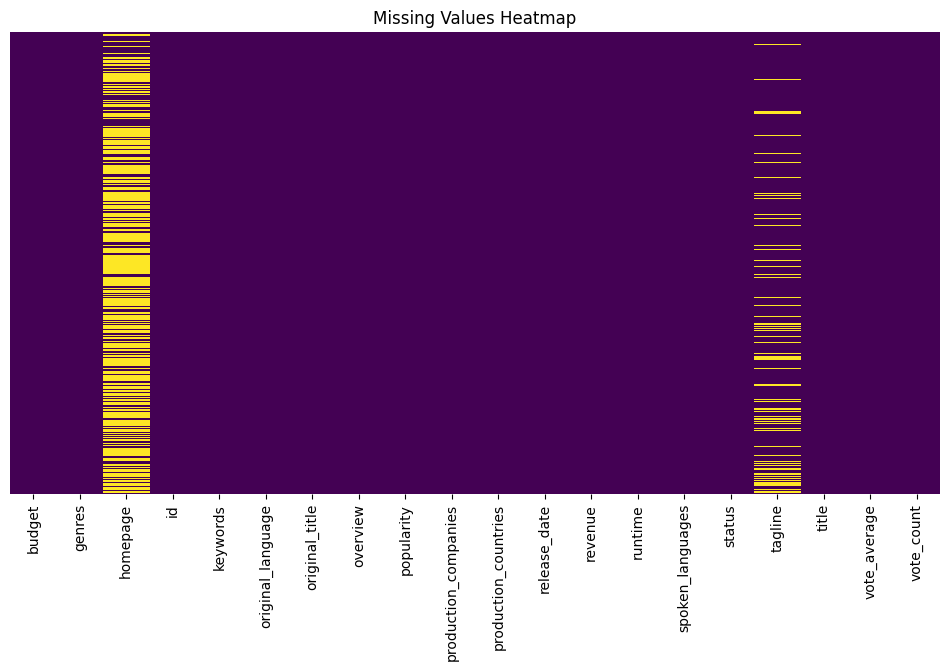

In [64]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
sns.heatmap(movies.isnull(), cmap='viridis', cbar=False, yticklabels=False)
plt.title('Missing Values Heatmap')
plt.show()


### Now can be seen that only two columns have nan or missing values but as they are very high in number so can't remove them or neither can do imputation but can remove some features like homepage as it is not an important feature and also for tagline_length and roi leave it as it is nan and can plot or use only those movies having non-null values for analysis 

In [65]:
# Function to handle JSON string columns
def parse_json_column(x):
    try:
        return json.loads(x.replace("'", '"')) if isinstance(x, str) else x
    except:
        return x

def preprocess_data(df):
    # Convert JSON strings to lists/dicts
    json_columns = ['genres', 'keywords', 'production_companies', 'production_countries', 'spoken_languages']
    for col in json_columns:
        df[col] = df[col].apply(parse_json_column)
    df.replace([np.inf, -np.inf], np.nan, inplace=True)

    df['genre_list'] = df['genres'].apply(lambda x: [genre['name'] for genre in x] if isinstance(x, list) else [])
    df['tagline'] = df['tagline'].fillna('')
    df['release_date'] = pd.to_datetime(df['release_date'])
    df['release_year'] = df['release_date'].dt.year
    df['release_month'] = df['release_date'].dt.month
    df['num_languages'] = df['spoken_languages'].apply(lambda x: len(x) if isinstance(x, list) else 0)
    df['revenue_millions'] = df['revenue'] / 1_000_000
    df['is_english'] = df['original_language'] == 'en'
    df['roi'] = df.apply(lambda row: ((row['revenue'] - row['budget']) / row['budget'] * 100) if row['budget'] > 0 else 0, axis=1)
    df['tagline_length'] = df['tagline'].apply(lambda x: len(x))
    return df

In [66]:
def create_correlation_heatmap(df):
    numeric_cols = ['budget', 'popularity', 'revenue', 'runtime', 'vote_average', 'vote_count']
    corr_matrix = df[numeric_cols].corr()
    
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0)
    plt.title('Correlation Heatmap of Movie Features')
    plt.tight_layout()
    plt.show()

def analyze_ratings_by_year_genre(df):
    genre_year_data = df.explode('genre_list')[['genre_list', 'release_year', 'vote_average']]
    
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=genre_year_data, x='genre_list', y='vote_average')
    plt.xticks(rotation=45)
    plt.title('Rating Distribution by Genre')
    plt.tight_layout()
    plt.show()

def analyze_runtime_distribution(df):
    plt.figure(figsize=(10, 6))
    sns.histplot(data=df, x='runtime', bins=30)
    plt.title('Distribution of Movie Runtimes')
    plt.xlabel('Runtime (minutes)')
    plt.ylabel('Count')
    plt.tight_layout()
    plt.show()


In [67]:
df = preprocess_data(movies)

In [68]:
df

,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,...,vote_average,vote_count,genre_list,release_year,release_month,num_languages,revenue_millions,is_english,roi,tagline_length
0,237000000,"[{'id': 28, 'name': 'Action'}, {'id': 12, 'nam...",http://www.avatarmovie.com/,19995,"[{'id': 1463, 'name': 'culture clash'}, {'id':...",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[{'name': 'Ingenious Film Partners', 'id': 289...",...,7.2,11800,"[Action, Adventure, Fantasy, Science Fiction]",2009.0,12.0,2,2787.965087,True,1076.356577,27
1,300000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",http://disney.go.com/disneypictures/pirates/,285,"[{""id"": 270, ""name"": ""ocean""}, {""id"": 726, ""na...",en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,"[{'name': 'Walt Disney Pictures', 'id': 2}, {'...",...,6.9,4500,"[Adventure, Fantasy, Action]",2007.0,5.0,1,961.000000,True,220.333333,46
2,245000000,"[{'id': 28, 'name': 'Action'}, {'id': 12, 'nam...",http://www.sonypictures.com/movies/spectre/,206647,"[{'id': 470, 'name': 'spy'}, {'id': 818, 'name...",en,Spectre,A cryptic message from Bond’s past sends him o...,107.376788,"[{'name': 'Columbia Pictures', 'id': 5}, {'nam...",...,6.3,4466,"[Action, Adventure, Crime]",2015.0,10.0,5,880.674609,True,259.459024,21
3,250000000,"[{'id': 28, 'name': 'Action'}, {'id': 80, 'nam...",http://www.thedarkknightrises.com/,49026,"[{'id': 849, 'name': 'dc comics'}, {'id': 853,...",en,The Dark Knight Rises,Following the death of District Attorney Harve...,112.312950,"[{'name': 'Legendary Pictures', 'id': 923}, {'...",...,7.6,9106,"[Action, Crime, Drama, Thriller]",2012.0,7.0,1,1084.939099,True,333.975640,15
4,260000000,"[{'id': 28, 'name': 'Action'}, {'id': 12, 'nam...",http://movies.disney.com/john-carter,49529,"[{'id': 818, 'name': 'based on novel'}, {'id':...",en,John Carter,"John Carter is a war-weary, former military ca...",43.926995,"[{'name': 'Walt Disney Pictures', 'id': 2}]",...,6.1,2124,"[Action, Adventure, Science Fiction]",2012.0,3.0,1,284.139100,True,9.284269,36
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4798,220000,"[{'id': 28, 'name': 'Action'}, {'id': 80, 'nam...",NaN,9367,"[{'id': 5616, 'name': 'united states–mexico ba...",es,El Mariachi,El Mariachi just wants to play his guitar and ...,14.269792,"[{'name': 'Columbia Pictures', 'id': 5}]",...,6.6,238,"[Action, Crime, Thriller]",1992.0,9.0,1,2.040920,False,827.690909,69
4799,9000,"[{'id': 35, 'name': 'Comedy'}, {'id': 10749, '...",NaN,72766,[],en,Newlyweds,A newlywed couple's honeymoon is upended by th...,0.642552,[],...,5.9,5,"[Comedy, Romance]",2011.0,12.0,0,0.000000,True,-100.000000,85
4800,0,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",http://www.hallmarkchannel.com/signedsealeddel...,231617,"[{'id': 248, 'name': 'date'}, {'id': 699, 'nam...",en,"Signed, Sealed, Delivered","""Signed, Sealed, Delivered"" introduces a dedic...",1.444476,"[{'name': 'Front Street Pictures', 'id': 3958}...",...,7.0,6,"[Comedy, Drama, Romance, TV Movie]",2013.0,10.0,1,0.000000,True,0.000000,0
4801,0,[],http://shanghaicalling.com/,126186,[],en,Shanghai Calling,When ambitious New York attorney Sam is sent t...,0.857008,[],...,5.7,7,[],2012.0,5.0,1,0.000000,True,0.000000,24


### dropping column homepage

In [69]:
df = df.drop(columns=['homepage'])

In [70]:
nan_rows_release_year = df[df['release_year'].isna()]

In [71]:
nan_rows_release_year

,budget,genres,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,...,vote_average,vote_count,genre_list,release_year,release_month,num_languages,revenue_millions,is_english,roi,tagline_length
4553,0,[],380097,[],en,America Is Still the Place,1971 post civil rights San Francisco seemed li...,0.0,[],[],...,0.0,0,[],NaN,NaN,0,0.0,True,0.0,0


### As only one row having release_date , month and year coming NaN and that row is like almost all feature's value missing so better removing it by using movie_id column

In [72]:
nan_rows_overview = df[df['overview'].isna()]

In [73]:
nan_rows_overview

,budget,genres,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,...,vote_average,vote_count,genre_list,release_year,release_month,num_languages,revenue_millions,is_english,roi,tagline_length
2656,15000000,"[{'id': 18, 'name': 'Drama'}]",370980,"[{'id': 717, 'name': 'pope'}, {'id': 5565, 'na...",it,Chiamatemi Francesco - Il Papa della gente,NaN,0.738646,"[{'name': 'Taodue Film', 'id': 45724}]","[{'iso_3166_1': 'IT', 'name': 'Italy'}]",...,7.3,12,[Drama],2015.0,12.0,1,0.0,False,-100.0,0
4140,2,"[{'id': 99, 'name': 'Documentary'}]",459488,"[{'id': 6027, 'name': 'music'}, {'id': 225822,...",en,"To Be Frank, Sinatra at 100",NaN,0.050625,"[{'name': 'Eyeline Entertainment', 'id': 60343}]","[{'iso_3166_1': 'GB', 'name': 'United Kingdom'}]",...,0.0,0,[Documentary],2015.0,12.0,0,0.0,True,-100.0,0
4431,913000,"[{'id': 99, 'name': 'Documentary'}]",292539,[],de,Food Chains,NaN,0.795698,[],[],...,7.4,8,[Documentary],2014.0,4.0,1,0.0,False,-100.0,0


### As only three rows having overview coming NaN and that rows is like almost all feature's value are not missing so can't remove them so better imputing '' values there

In [74]:
nan_rows_runtime = df[df['runtime'].isna()]

In [75]:
nan_rows_runtime

,budget,genres,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,...,vote_average,vote_count,genre_list,release_year,release_month,num_languages,revenue_millions,is_english,roi,tagline_length
2656,15000000,"[{'id': 18, 'name': 'Drama'}]",370980,"[{'id': 717, 'name': 'pope'}, {'id': 5565, 'na...",it,Chiamatemi Francesco - Il Papa della gente,NaN,0.738646,"[{'name': 'Taodue Film', 'id': 45724}]","[{'iso_3166_1': 'IT', 'name': 'Italy'}]",...,7.3,12,[Drama],2015.0,12.0,1,0.0,False,-100.0,0
4140,2,"[{'id': 99, 'name': 'Documentary'}]",459488,"[{'id': 6027, 'name': 'music'}, {'id': 225822,...",en,"To Be Frank, Sinatra at 100",NaN,0.050625,"[{'name': 'Eyeline Entertainment', 'id': 60343}]","[{'iso_3166_1': 'GB', 'name': 'United Kingdom'}]",...,0.0,0,[Documentary],2015.0,12.0,0,0.0,True,-100.0,0


In [76]:
nan_rows_runtime['runtime']

2656   NaN
4140   NaN
Name: runtime, dtype: float64

### As only two rows having runtime coming NaN and that rows is like almost all feature's value are not missing so can't remove them so better imputing 0 values there

In [77]:
# Drop row where id is 380097
df = df[df['id'] != 380097]

# Replace NaN values in 'overview' column with an empty string and runtime nan values with 0
df['overview'] = df['overview'].fillna('')
df['runtime'] = df['runtime'].fillna(0)

# Verify changes
print(df[df['id'] == 380097	])  # Should return an empty DataFrame
print(df['overview'].isna().sum())  # Should return 0
print(df['runtime'].isna().sum())  # Should return 0

Empty DataFrame
Columns: [budget, genres, id, keywords, original_language, original_title, overview, popularity, production_companies, production_countries, release_date, revenue, runtime, spoken_languages, status, tagline, title, vote_average, vote_count, genre_list, release_year, release_month, num_languages, revenue_millions, is_english, roi, tagline_length]
Index: []

[0 rows x 27 columns]
0
0


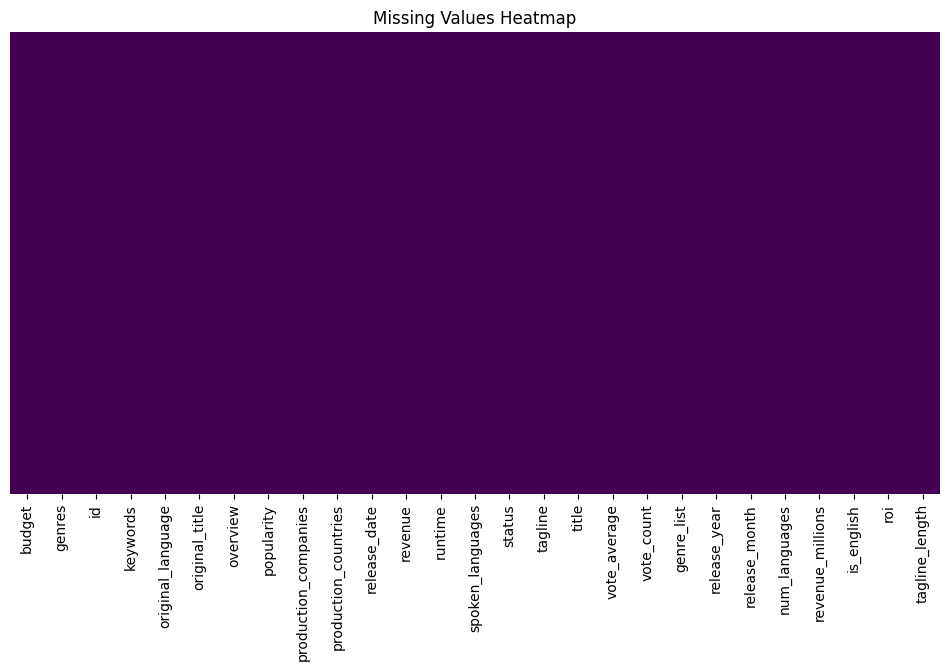

In [78]:
plt.figure(figsize=(12, 6))
sns.heatmap(df.isnull(), cmap='viridis', cbar=False, yticklabels=False)
plt.title('Missing Values Heatmap')
plt.show()

### Finally all NaN and missing values are handled

## 📌 Descriptive Statistics

In [79]:
# Separate numerical & categorical columns
num_cols = df.select_dtypes(include=['int64', 'float64']).columns
cat_cols = df.select_dtypes(include=['object']).columns

In [80]:
df.describe()

,budget,id,popularity,release_date,revenue,runtime,vote_average,vote_count,release_year,release_month,num_languages,revenue_millions,roi,tagline_length
count,4.802000e+03,4802.000000,4802.000000,4802,4.802000e+03,4802.000000,4802.000000,4802.000000,4802.000000,4802.000000,4802.000000,4802.000000,4.802000e+03,4802.000000
mean,2.905109e+07,57098.234902,21.496776,2002-12-27 23:45:54.352353280,8.227777e+07,106.853603,6.093440,690.361724,2002.468763,6.795918,1.444606,82.277769,1.986122e+05,34.617659
min,0.000000e+00,5.000000,0.000372,1916-09-04 00:00:00,0.000000e+00,0.000000,0.000000,0.000000,1916.000000,1.000000,0.000000,0.000000,-1.000000e+02,0.000000
25%,8.000000e+05,9013.750000,4.671734,1999-07-14 00:00:00,0.000000e+00,94.000000,5.600000,54.000000,1999.000000,4.000000,1.000000,0.000000,-1.632024e+01,18.000000
50%,1.500000e+07,14626.500000,12.924931,2005-10-03 00:00:00,1.917498e+07,103.000000,6.200000,235.500000,2005.000000,7.000000,1.000000,19.174985,4.741262e+00,32.000000
75%,4.000000e+07,58589.750000,28.332017,2011-02-16 00:00:00,9.291920e+07,117.750000,6.800000,737.000000,2011.000000,10.000000,2.000000,92.919195,2.157480e+02,47.000000
max,3.800000e+08,459488.000000,875.581305,2017-02-03 00:00:00,2.787965e+09,338.000000,10.000000,13752.000000,2017.000000,12.000000,9.000000,2787.965087,8.499999e+08,252.000000
std,4.072447e+07,88581.302370,31.818451,NaN,1.628697e+08,22.662122,1.191496,1234.674268,12.414354,3.424187,0.926790,162.869733,1.235044e+07,27.213682


In [81]:
num_cols

Index(['budget', 'id', 'popularity', 'revenue', 'runtime', 'vote_average',
       'vote_count', 'release_year', 'release_month', 'num_languages',
       'revenue_millions', 'roi', 'tagline_length'],
      dtype='object')

In [82]:
cat_cols

Index(['genres', 'keywords', 'original_language', 'original_title', 'overview',
       'production_companies', 'production_countries', 'spoken_languages',
       'status', 'tagline', 'title', 'genre_list'],
      dtype='object')

### Making correlation heatmap for numerical columns

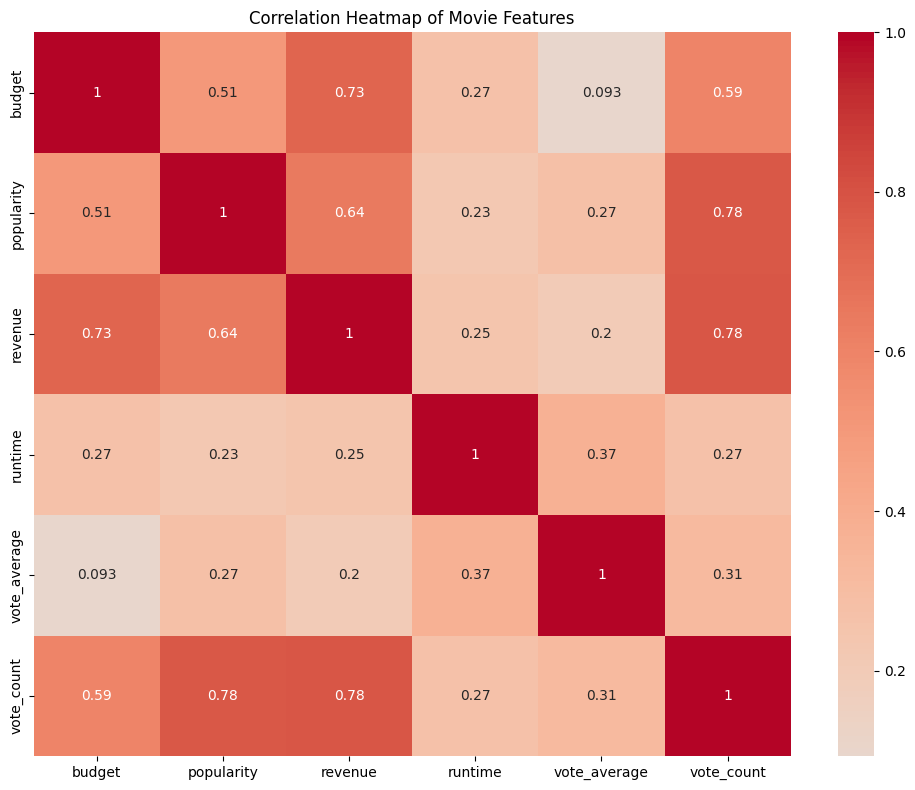

In [83]:
create_correlation_heatmap(df)

### Observations:-
  - Popularity and revenue have high positive correlation of 0.78 with vote_count as obvious that more votes on the movie will likely results in more popularity and revenue.
  - Revenue and Budget also have high positive correlation of 0.73 as more budget invested for the movie will likely results in more revenue until the movie becomes flop due to poor storyline.
  - Revenue and Popularity also have good positive correlation of 0.64 as more revenue is only when movie popularity is high in the market
  - Budget and vote_count have good positive correlation of 0.59 as more budget likely results in good movie and more votes
  - Budget and popularity have good positive correlation of 0.51 as more budget results in good movie with high popularity

### Plotting Spearman Correlation of numerical features

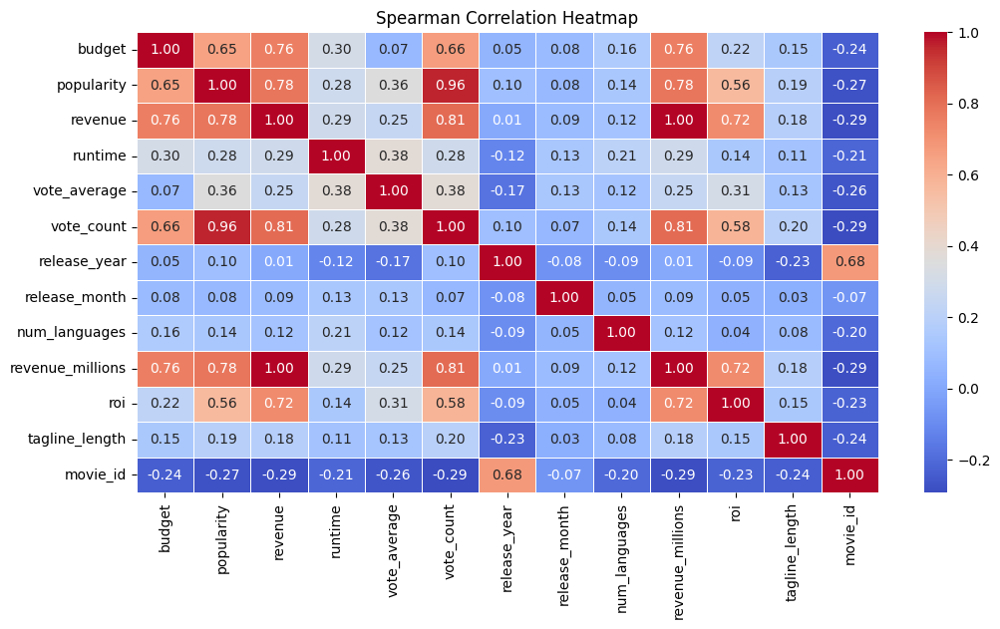

In [165]:
# Select only numeric columns
df_numeric = df.select_dtypes(include=['number'])  

# Compute Spearman correlation
spearman_corr = df_numeric.corr(method="spearman")

# Plot heatmap
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
sns.heatmap(spearman_corr, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Spearman Correlation Heatmap")
plt.show()


- Looking at this Spearman correlation heatmap,here are the key insights:

  - Revenue and budget have a strong positive correlation (0.76), suggesting higher budgets often lead to higher revenue.
  - Popularity and vote_count show an extremely strong correlation (0.96), indicating popular movies get more votes.
  - All financial metrics (budget, revenue, popularity, vote_count) are strongly correlated with each other.
  - Number of languages shows minimal correlation with other variables.


In [166]:
import pingouin as pg

# Compute partial correlation (e.g., between 'vote_average' and 'revenue' while controlling for 'budget')
partial_corr = pg.partial_corr(data=df, x='vote_average', y='revenue', covar='budget', method="spearman")
print(partial_corr)


             n         r         CI95%          p-val
spearman  5195  0.293392  [0.27, 0.32]  1.243542e-103


### Interpretation

  - Since r = 0.293 is positive, it suggests that higher vote_average is associated with higher revenue, even after accounting for budget.
  - However, the correlation is moderate (closer to 0.3).
  - The confidence interval is narrow, meaning the estimate is quite reliable.
  - The p-value is extremely low, meaning this relationship is highly statistically significant and unlikely to be due to chance.

In [183]:
import statsmodels.api as sm
from scipy.stats import spearmanr

def semi_partial_corr(df, x, y, control):
    # Ensure control variable has a constant term for regression
    X = sm.add_constant(df[control].dropna())

    # Fit regression model
    model = sm.OLS(df[y].dropna(), X).fit()
    
    # Get residuals (semi-partial correlation needs residuals, not full predictions)
    df[f"{y}_resid"] = model.resid

    # Compute Spearman correlation between X and residualized Y
    return spearmanr(df[x].dropna(), df[f"{y}_resid"].dropna()).correlation

# Example: Semi-partial correlation between vote_average and revenue, controlling for budget
semi_partial = semi_partial_corr(df, 'vote_average', 'revenue', 'budget')
print("Semi-Partial Correlation:", semi_partial)


Semi-Partial Correlation: 0.24663609564009512


Interpreting Your Result (0.2499)

    Positive (0.24663 > 0) → vote_average increases revenue (but weakly).
    Semi-partial means vote_average explains an extra 24.66% of the variance in revenue, once budget's effect is removed.
    Weaker than a full correlation → Without controlling for budget, vote_average might have had a higher correlation with revenue.

/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values

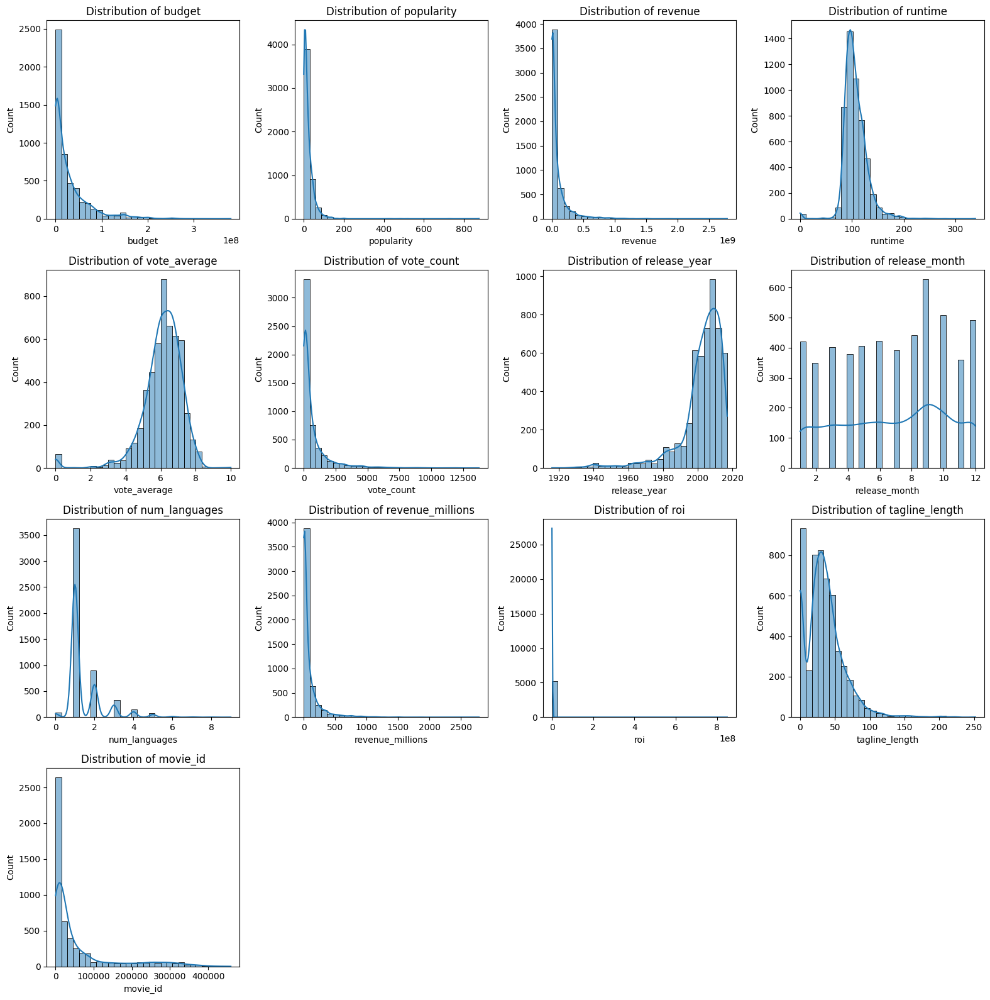

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import math

# Select numerical columns
numerical_features = df.select_dtypes(include=['number']).columns

# Define grid size for subplots
num_features = len(numerical_features)
cols = min(4, num_features)  # Max 4 plots per row
rows = math.ceil(num_features / cols)  # Determine required rows

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))

# Flatten axes array for easy indexing
axes = axes.flatten()

# Generate KDE histogram plots
for i, col in enumerate(numerical_features):
    sns.histplot(df[col], kde=True, bins=30, ax=axes[i])
    axes[i].set_title(f"Distribution of {col}")

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()



### Now checking normality by KS test as number of samples is more than 50.

In [186]:
from scipy.stats import kstest, zscore, shapiro

for col in numerical_features:
    standardized_data = zscore(df[col].dropna())  # Standardizing
    ks_stat, p_value = kstest(standardized_data, 'norm')  # Now test normality
    print(f"KS Test for {col}: Statistic={ks_stat:.4f}, p-value={p_value:.25f}")
    


KS Test for budget: Statistic=0.2376, p-value=0.0000000000000000000000000
KS Test for popularity: Statistic=0.2573, p-value=0.0000000000000000000000000
KS Test for revenue: Statistic=0.3054, p-value=0.0000000000000000000000000
KS Test for runtime: Statistic=0.1025, p-value=0.0000000000000000000000000
KS Test for vote_average: Statistic=0.1030, p-value=0.0000000000000000000000000
KS Test for vote_count: Statistic=0.2853, p-value=0.0000000000000000000000000
KS Test for release_year: Statistic=0.1635, p-value=0.0000000000000000000000000
KS Test for release_month: Statistic=0.1235, p-value=0.0000000000000000000000000
KS Test for num_languages: Statistic=0.4010, p-value=0.0000000000000000000000000
KS Test for revenue_millions: Statistic=0.3054, p-value=0.0000000000000000000000000
KS Test for roi: Statistic=0.5032, p-value=0.0000000000000000000000000
KS Test for tagline_length: Statistic=0.1043, p-value=0.0000000000000000000000000
KS Test for movie_id: Statistic=0.2588, p-value=0.00000000000

In [188]:
from scipy.stats import anderson, zscore

for col in numerical_features:
    standardized_data = zscore(df[col].dropna())  # Standardizing
    result = anderson(standardized_data, dist='norm')
    print(f"Anderson-Darling Test for {col}: Statistic={result.statistic:.4f}, Critical Values={result.critical_values}")


Anderson-Darling Test for budget: Statistic=431.8774, Critical Values=[0.576 0.655 0.786 0.917 1.091]
Anderson-Darling Test for popularity: Statistic=467.4348, Critical Values=[0.576 0.655 0.786 0.917 1.091]
Anderson-Darling Test for revenue: Statistic=725.8422, Critical Values=[0.576 0.655 0.786 0.917 1.091]
Anderson-Darling Test for runtime: Statistic=119.1255, Critical Values=[0.576 0.655 0.786 0.917 1.091]
Anderson-Darling Test for vote_average: Statistic=101.5587, Critical Values=[0.576 0.655 0.786 0.917 1.091]
Anderson-Darling Test for vote_count: Statistic=676.5123, Critical Values=[0.576 0.655 0.786 0.917 1.091]
Anderson-Darling Test for release_year: Statistic=274.7389, Critical Values=[0.576 0.655 0.786 0.917 1.091]
Anderson-Darling Test for release_month: Statistic=82.7172, Critical Values=[0.576 0.655 0.786 0.917 1.091]
Anderson-Darling Test for num_languages: Statistic=824.5454, Critical Values=[0.576 0.655 0.786 0.917 1.091]
Anderson-Darling Test for revenue_millions: Sta

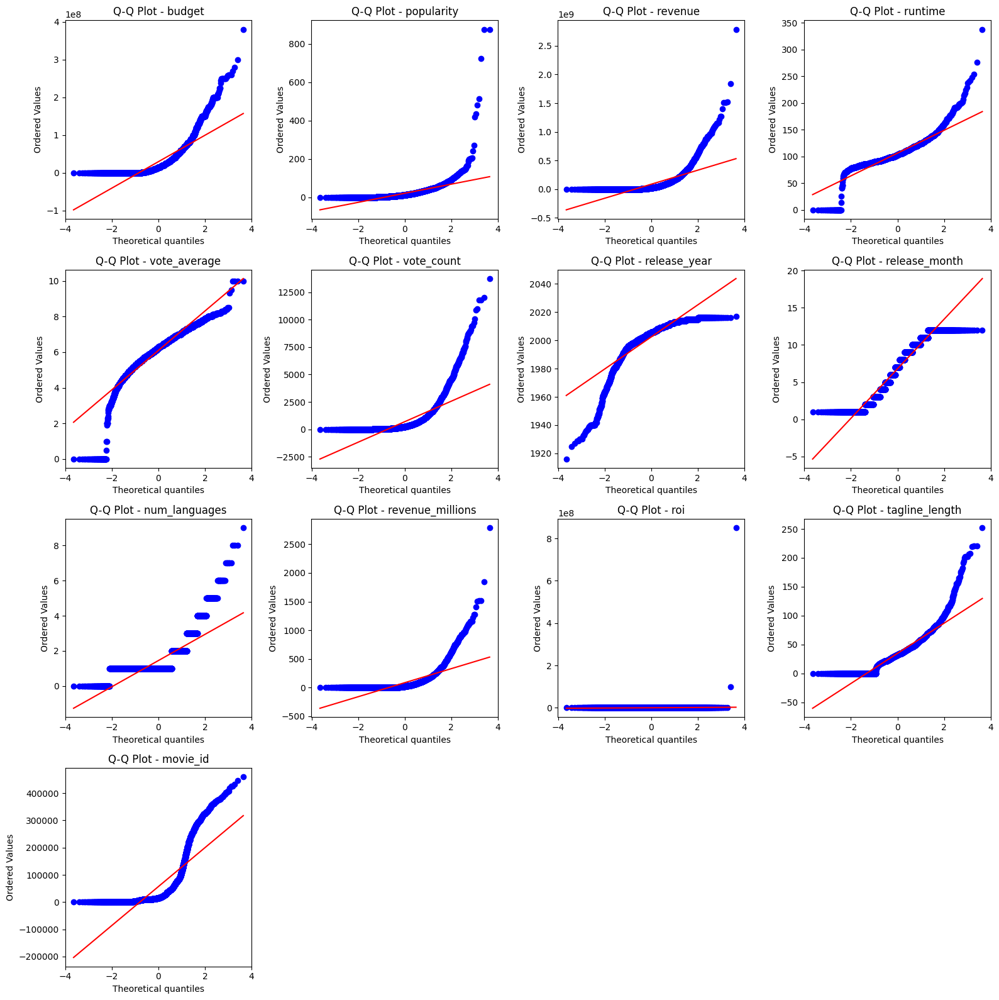

In [181]:
import scipy.stats as stats
import matplotlib.pyplot as plt
import math

# Select numerical columns
numerical_features = df.select_dtypes(include=['number']).columns

# Define grid size for subplots
num_features = len(numerical_features)
cols = min(4, num_features)  # Max 4 plots per row
rows = math.ceil(num_features / cols)  # Determine required rows

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))

# Flatten axes array for easy indexing
axes = axes.flatten()

# Generate Q-Q plots
for i, col in enumerate(numerical_features):
    stats.probplot(df[col].dropna(), dist="norm", plot=axes[i])
    axes[i].set_title(f"Q-Q Plot - {col}")

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


- Observations from the Q-Q Plots

The Q-Q (Quantile-Quantile) plots compare the distribution of each numerical feature to a normal distribution. If the data were normally distributed, the points would align along the red diagonal line.
- Key Observations:

    - Severe Right Skew (Long Tail on the Right)
        budget, revenue, revenue_millions, vote_count, roi, popularity
        The points deviate strongly upwards at the higher end, indicating heavy right skew.
        Suggests log or Box-Cox transformations to reduce skewness.

    - Mild Right Skew (Less Severe)
        runtime, tagline_length
        Points are slightly curved upwards but not as extreme as the above features.

    - S-Shaped Curves (Non-Normal, Possible Bimodal/Uniform)
        release_year, release_month, movie_id
        release_year follows an S-curve, meaning it may have a uniform-like or capped range distribution.
        release_month shows discrete jumps, meaning it’s categorical in nature.
        movie_id also follows a distinct pattern, suggesting not a continuous variable.

    - Discrete Steps (Categorical or Ordinal)
        num_languages, release_month
        The stepped pattern indicates that these are likely ordinal or categorical rather than continuous.
        May not need normality transformation; consider treating as categorical.

    - Vote Average Has a Slight S-Curve
        Indicates mild deviation from normality, but not as extreme as budget, revenue, or vote_count.

## Summary

The data is strongly non-normal.

### Revenue vs Budget Analysis

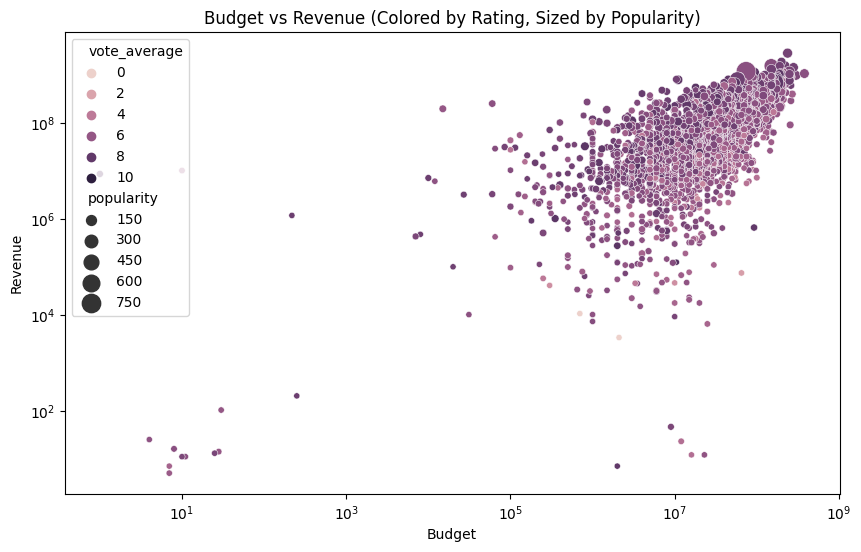

In [85]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='budget', y='revenue', hue='vote_average', size='popularity', sizes=(20, 200))
plt.xscale('log')
plt.yscale('log')
plt.title('Budget vs Revenue (Colored by Rating, Sized by Popularity)')
plt.xlabel('Budget')
plt.ylabel('Revenue')
plt.show()


### Observations:- 
- Most of the movies with high budget has high revenue
- Some movies like 5 in number with high budget but very less revenue like flopped movies
- Some are having both less budget and thus less revenue
- Can see at top right corner some movies with big circles like too much popular and also giving high revenue although of high budget

## 1. What genres of movies have the highest average revenue?


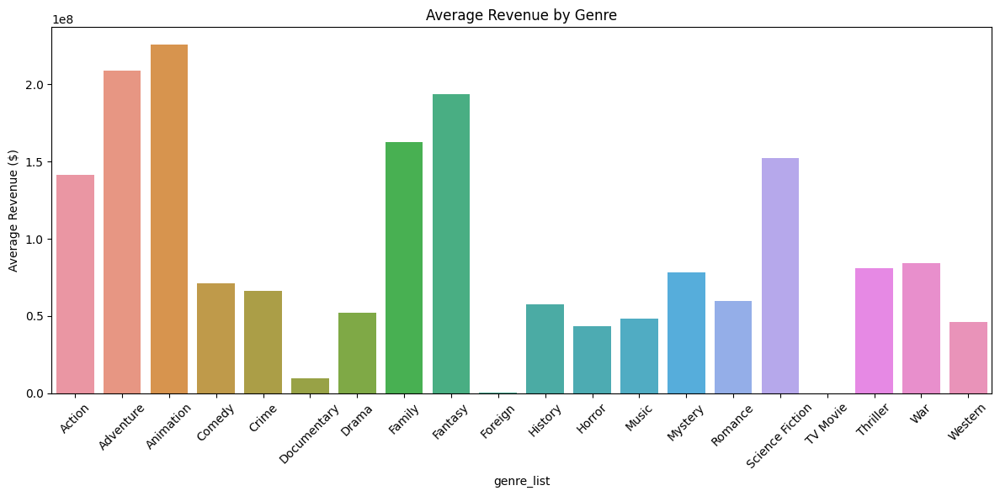

In [86]:

df_exploded = df.explode('genre_list')
genre_avg = df_exploded.groupby('genre_list').agg(
    mean_revenue=('revenue', 'mean'),
    mean_budget=('budget', 'mean'),
    count=('revenue', 'count')  # Count of movies per genre
).reset_index()

genre_avg['roi'] = ((genre_avg['mean_revenue'] - genre_avg['mean_budget']) / genre_avg['mean_budget']) * 100
genre_avg['profit_per_movie'] = genre_avg['mean_revenue'] - genre_avg['mean_budget']
genre_avg['revenue_budget_ratio'] = genre_avg['mean_revenue']/genre_avg['mean_budget']

plt.figure(figsize=(12, 6))
sns.barplot(data=genre_avg.reset_index(), x='genre_list', y='mean_revenue')
plt.xticks(rotation=45)
plt.title('Average Revenue by Genre')
plt.ylabel('Average Revenue ($)')
plt.tight_layout()
plt.show()

### But the above result might be due to some exceptionally hit movies in genres (outliers) so to get more deeper insight about genres I have changed the metric from mean to median and found that all results all almost same but inscience fiction for metric mean its value boosts up more which is likely due to some top hit movies like Avatar , Avengers etc

In [87]:
genre_avg

,genre_list,mean_revenue,mean_budget,count,roi,profit_per_movie,revenue_budget_ratio
0,Action,1.412131e+08,5.151075e+07,1154,174.142960,8.970235e+07,2.741430
1,Adventure,2.086602e+08,6.632686e+07,790,214.593817,1.423333e+08,3.145938
2,Animation,2.256930e+08,6.646590e+07,234,239.562119,1.592271e+08,3.395621
3,Comedy,7.128950e+07,2.531342e+07,1722,181.627275,4.597608e+07,2.816273
4,Crime,6.615066e+07,2.784981e+07,696,137.526455,3.830085e+07,2.375265
5,Documentary,9.838888e+06,2.653288e+06,110,270.818640,7.185600e+06,3.708186
6,Drama,5.211623e+07,2.067832e+07,2297,152.033141,3.143791e+07,2.520331
7,Family,1.623455e+08,5.071951e+07,513,220.084891,1.116260e+08,3.200849
8,Fantasy,1.933542e+08,6.356061e+07,424,204.204538,1.297936e+08,3.042045
9,Foreign,3.646515e+05,6.580884e+05,34,-44.589287,-2.934369e+05,0.554107


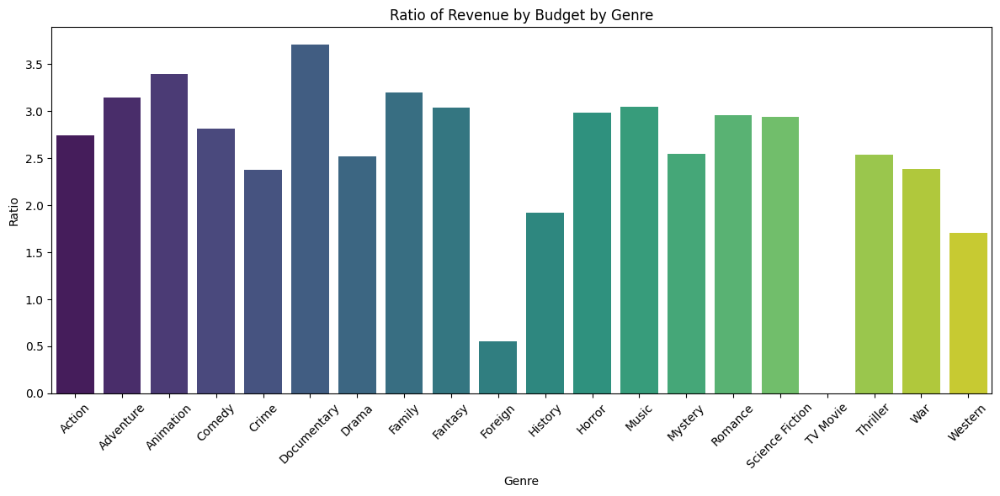

In [88]:
plt.figure(figsize=(12, 6))
sns.barplot(data=genre_avg, x='genre_list', y='revenue_budget_ratio', palette='viridis')
plt.xticks(rotation=45)
plt.title('Ratio of Revenue by Budget by Genre')
plt.ylabel('Ratio')
plt.xlabel('Genre')
plt.tight_layout()
plt.show()


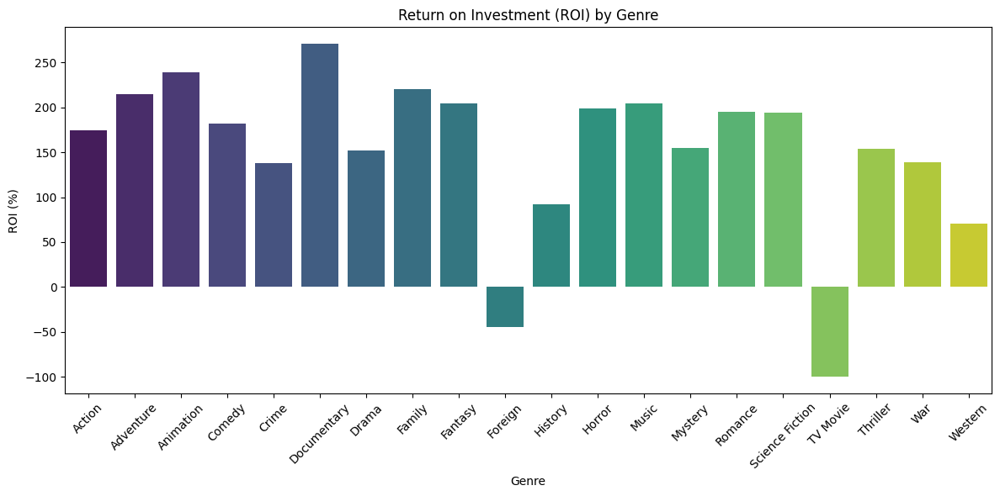

In [89]:
plt.figure(figsize=(12, 6))
sns.barplot(data=genre_avg, x='genre_list', y='roi', palette='viridis')
plt.xticks(rotation=45)
plt.title('Return on Investment (ROI) by Genre')
plt.ylabel('ROI (%)')
plt.xlabel('Genre')
plt.tight_layout()
plt.show()


### Ans- Animation , Adventure followed by Fantasy, Family and Science Fiction are having highest average revenue.
### Observations :- 
   - Drama is the most occuring genre in all movies being in 2297 movies
   - Animation is only in 234 movies like very less movies but still having highest average revenue
   - Foreign and TV Movie are lowest revenue making genres
   - Drama, Action, Comedy and Thriller are most common genres
   - Documentary has highest revenue to budget ratio of more than 3.5 followed by Animation, Adventure and Family and all have atleast ratio>2 except Foreign which has ratio near to 0.5.
   - On ROI plot, Documentary has highest among all more than 250% followed by Animation. Foreign and TV Movie has negative ROI thus movies will be in loss.

## 2. Is there a correlation between movie budgets and Ratings?

/tmp/ipykernel_96076/547303753.py:13: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=df, x='budget_category', y='vote_average', estimator=np.mean, ci=None)
/home/mayank/.local/lib/python3.10/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


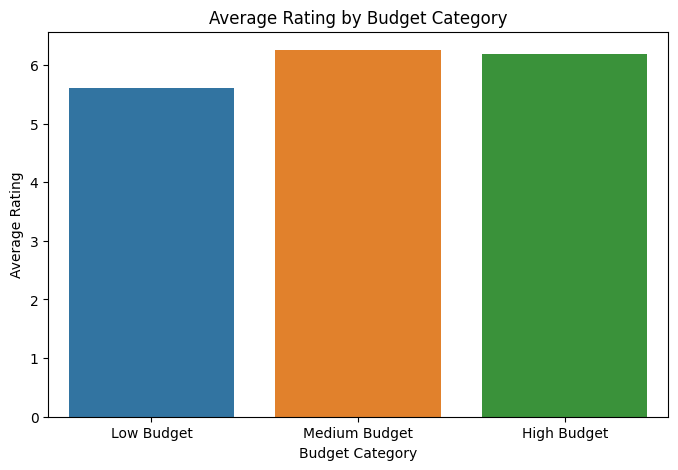

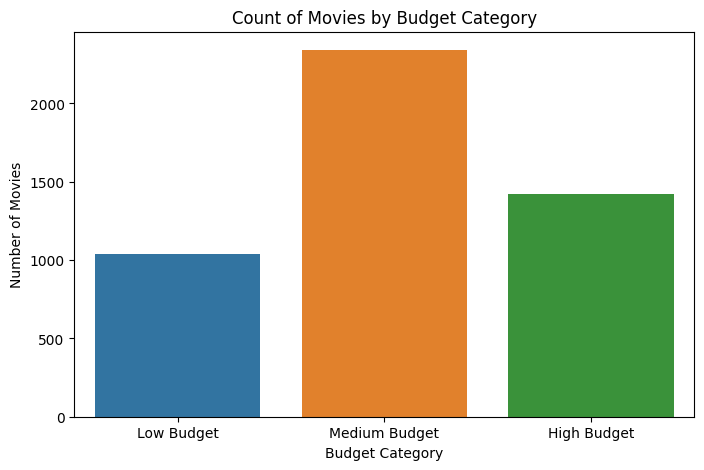

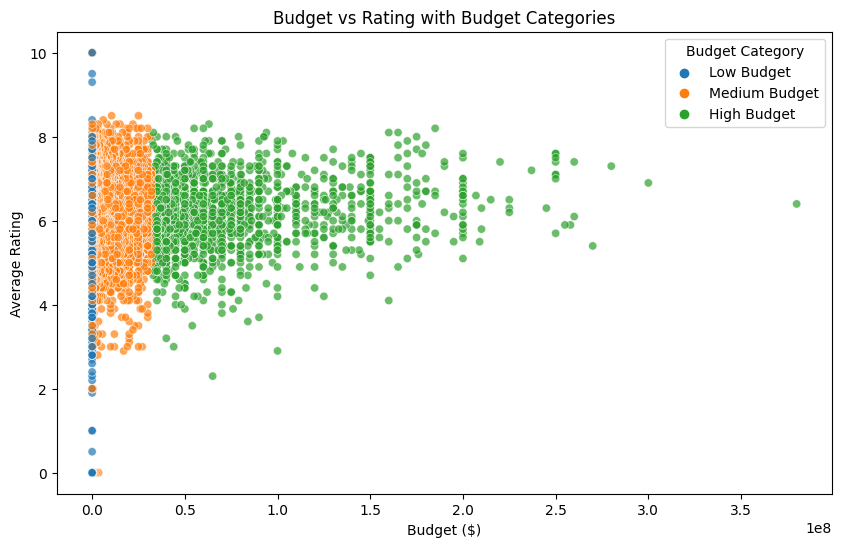

Correlation between budget and rating: 0.09


In [90]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define budget categories based on percentiles
percentiles = np.percentile(df['budget'], [10, 70])
df['budget_category'] = pd.cut(df['budget'], bins=[-np.inf, percentiles[0], percentiles[1], np.inf], 
                               labels=['Low Budget', 'Medium Budget', 'High Budget'])

# Bar plot: Average rating for each budget category
plt.figure(figsize=(8, 5))
sns.barplot(data=df, x='budget_category', y='vote_average', estimator=np.mean, ci=None)
plt.title('Average Rating by Budget Category')
plt.xlabel('Budget Category')
plt.ylabel('Average Rating')
plt.show()

# Count plot: Number of movies in each budget category
plt.figure(figsize=(8, 5))
sns.countplot(data=df, x='budget_category')
plt.title('Count of Movies by Budget Category')
plt.xlabel('Budget Category')
plt.ylabel('Number of Movies')
plt.show()

# Scatter plot: Budget vs Rating with budget categories
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='budget', y='vote_average', hue='budget_category', alpha=0.7)
plt.title('Budget vs Rating with Budget Categories')
plt.xlabel('Budget ($)')
plt.ylabel('Average Rating')
plt.legend(title="Budget Category")
plt.show()

# Calculate correlation
correlation = df['budget'].corr(df['vote_average'])
print(f"Correlation between budget and rating: {correlation:.2f}")


### Analysis :-
  - No, there is no good correlation between the two
  - Very less positive correlation between them suggesting no correlation as it might be there that some high budget movies goes flop while some low budget movies like animation becomes record breaking with good rating

## 3. Which directors have consistently high box office success?

In [91]:
import json
df = pd.merge(df, credits, left_on='id', right_on='movie_id', how='left')
df = df.drop(columns=['id']) 
df['crew'] = df['crew'].apply(lambda x: json.loads(x) if isinstance(x, str) else x)
df['director'] = df['crew'].apply(lambda x: [member['name'] for member in x if member['job'] == 'Director'] if isinstance(x, list) else [])
df = df.explode('director')

# Step 5: Calculate total or average revenue per director.
director_revenue = df.groupby('director').agg(
    total_revenue=('revenue', 'sum'),
    avg_revenue=('revenue', 'mean'),
    avg_rating=('vote_average', 'mean'),
    avg_budget=('budget', 'mean'),
    movie_count=('movie_id', 'count')
).reset_index()



In [92]:
director_revenue

,director,total_revenue,avg_revenue,avg_rating,avg_budget,movie_count
0,Aaron Hann,0,0.0,6.00,0.0,1
1,Aaron Schneider,0,0.0,6.50,7500000.0,1
2,Aaron Seltzer,314717971,62943594.2,3.54,23000000.0,5
3,Aaron T. Wells,0,0.0,3.50,500000.0,1
4,Abel Ferrara,1227324,1227324.0,7.30,12500000.0,1
...,...,...,...,...,...,...
2572,Álex de la Iglesia,0,0.0,5.70,14100000.0,1
2573,Émile Gaudreault,3031801,3031801.0,5.60,4361898.0,1
2574,Éric Tessier,0,0.0,6.90,0.0,1
2575,Étienne Faure,0,0.0,6.20,0.0,1


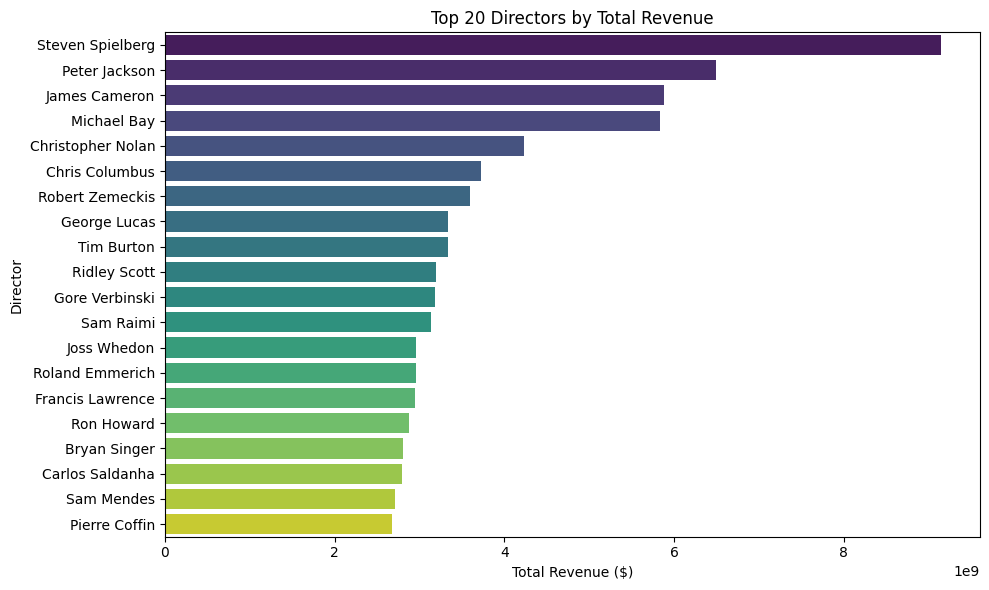

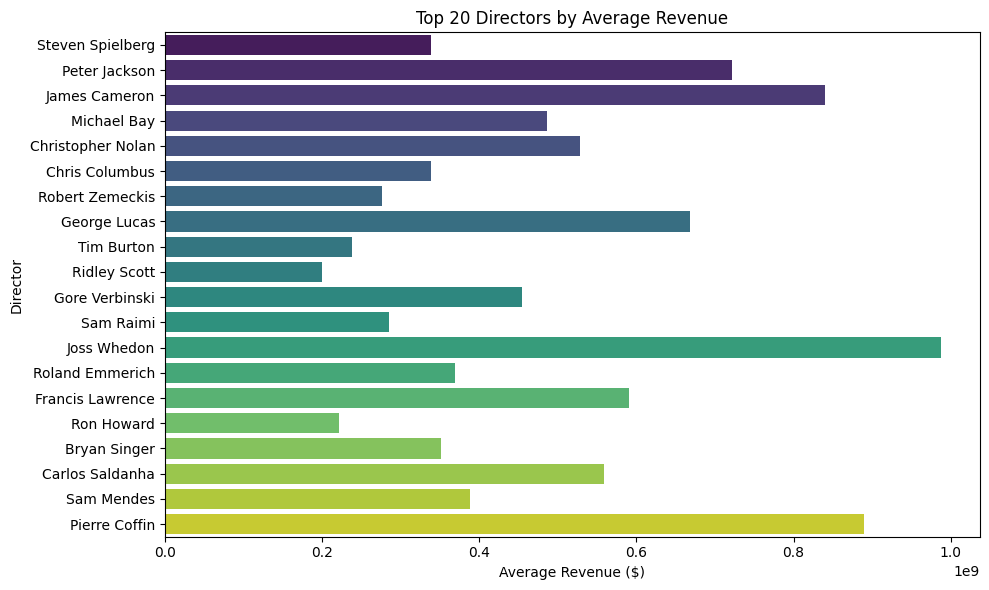

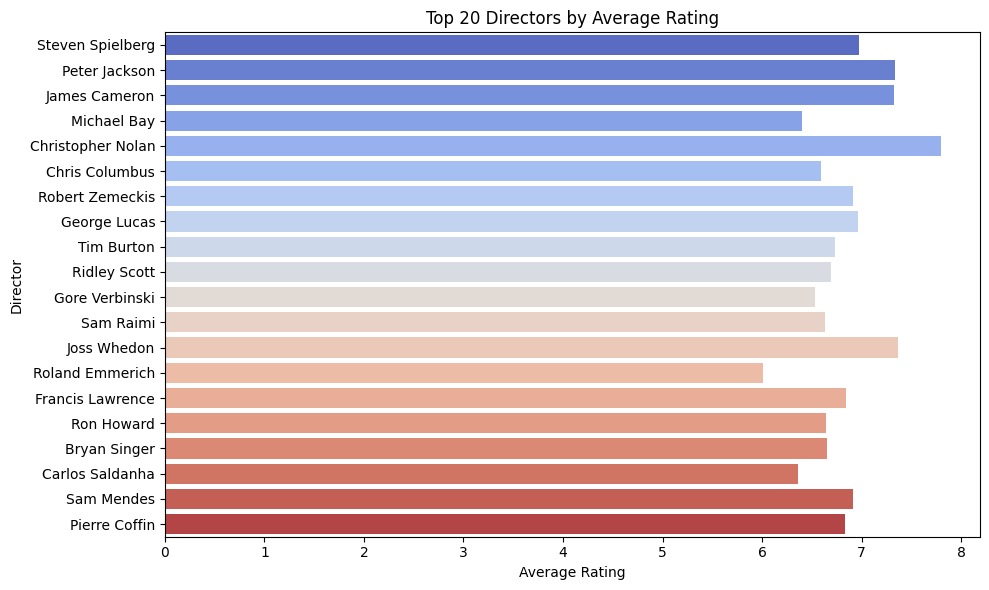

In [93]:
# Sort by total revenue and select top 20 directors
top_directors = director_revenue.sort_values('total_revenue', ascending=False).head(20)

# Plot the top directors by total revenue
plt.figure(figsize=(10, 6))
sns.barplot(data=top_directors, x='total_revenue', y='director', palette='viridis')
plt.title('Top 20 Directors by Total Revenue')
plt.xlabel('Total Revenue ($)')
plt.ylabel('Director')
plt.tight_layout()
plt.show()

# Optional: Plot the average revenue by director
plt.figure(figsize=(10, 6))
sns.barplot(data=top_directors, x='avg_revenue', y='director', palette='viridis')
plt.title('Top 20 Directors by Average Revenue')
plt.xlabel('Average Revenue ($)')
plt.ylabel('Director')
plt.tight_layout()
plt.show()

# Optional: Plot the average rating for these directors
plt.figure(figsize=(10, 6))
sns.barplot(data=top_directors, x='avg_rating', y='director', palette='coolwarm')
plt.title('Top 20 Directors by Average Rating')
plt.xlabel('Average Rating')
plt.ylabel('Director')
plt.tight_layout()
plt.show()

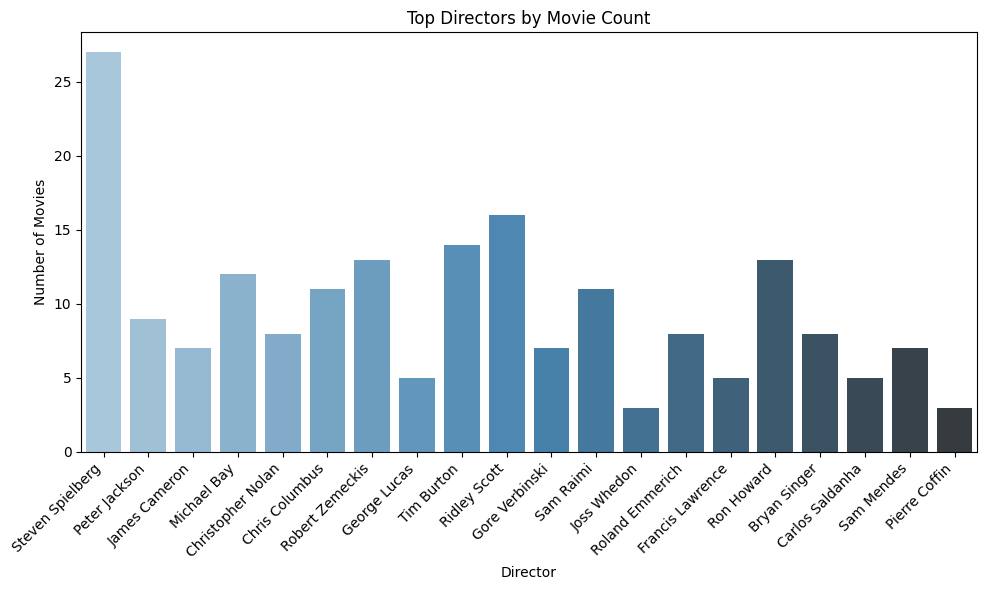

In [94]:
plt.figure(figsize=(10, 6))
sns.barplot(data=top_directors, x='director', y='movie_count', palette='Blues_d')
plt.title('Top Directors by Movie Count')
plt.xlabel('Director')
plt.ylabel('Number of Movies')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


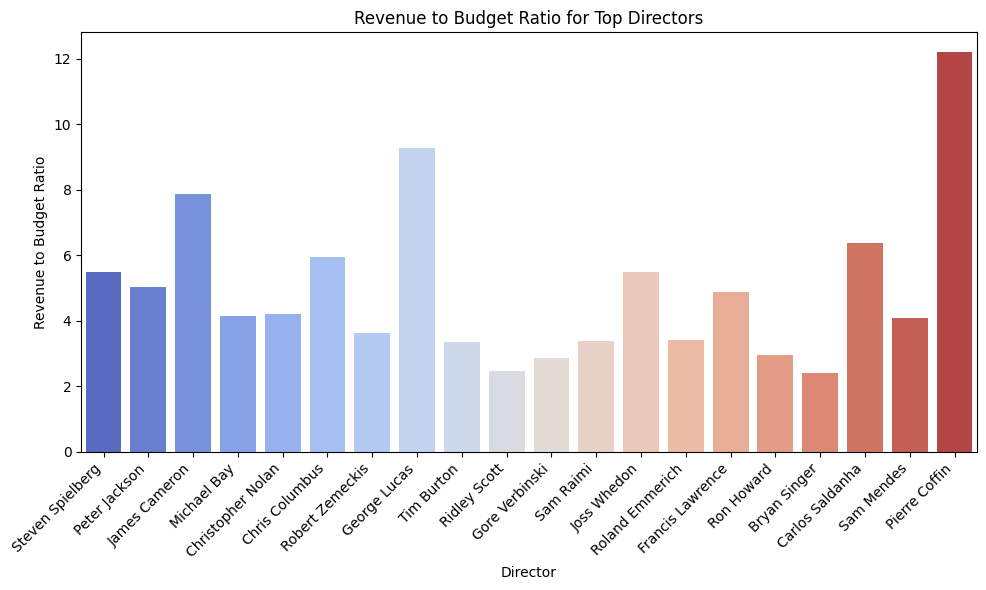

In [95]:
top_directors['revenue_to_budget_ratio'] = top_directors['avg_revenue'] / top_directors['avg_budget']

plt.figure(figsize=(10, 6))
sns.barplot(data=top_directors, x='director', y='revenue_to_budget_ratio', palette='coolwarm')
plt.title('Revenue to Budget Ratio for Top Directors')
plt.xlabel('Director')
plt.ylabel('Revenue to Budget Ratio')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you wi

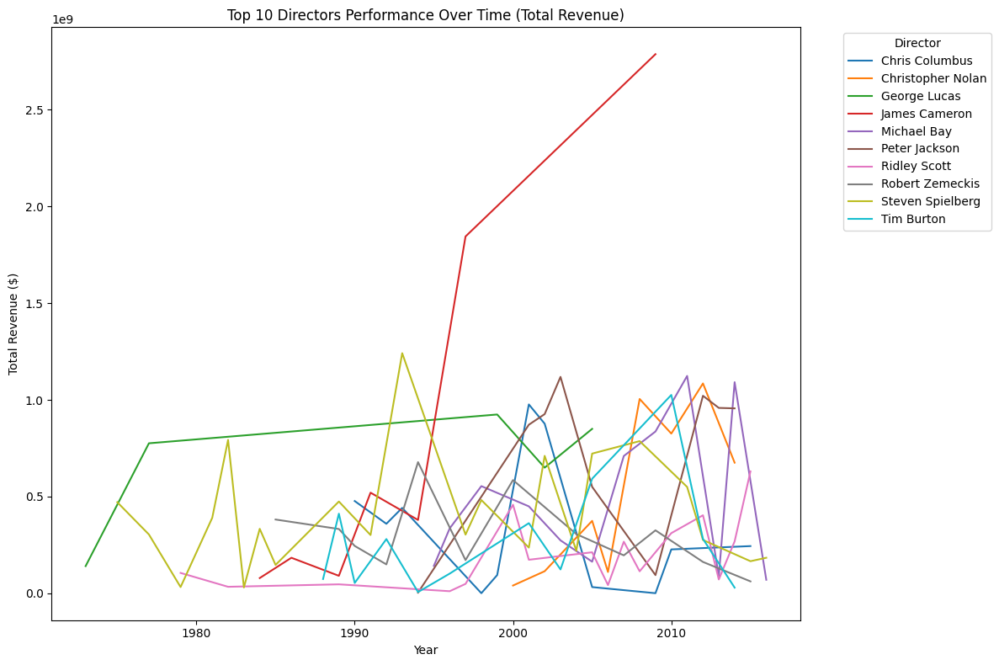

In [96]:
# Calculate total revenue for each director and year
director_performance = df.groupby(['director', 'release_year']).agg(
    total_revenue=('revenue', 'sum'),
    total_budget=('budget', 'sum'),
    average_revenue = ('revenue','mean')
).reset_index()
director_performance['revenue_to_budget'] = director_performance['total_revenue'] / director_performance['total_budget']
# Calculate total revenue for each director (not grouped by year)
total_revenue_by_director = director_performance.groupby('director')['total_revenue'].sum().reset_index()

# Sort directors by total revenue and get the top 10
top_10_directors = total_revenue_by_director.sort_values('total_revenue', ascending=False).head(10)['director']

# Filter the director_performance dataframe to include only top 10 directors
filtered_director_performance = director_performance[director_performance['director'].isin(top_10_directors)]

# Plot the performance over time for top 10 directors
plt.figure(figsize=(12, 8))
sns.lineplot(data=filtered_director_performance, x='release_year', y='total_revenue', hue='director', markers=True, dashes=False)
plt.title('Top 10 Directors Performance Over Time (Total Revenue)')
plt.xlabel('Year')
plt.ylabel('Total Revenue ($)')
plt.legend(title='Director', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [97]:
filtered_director_performance

,director,release_year,total_revenue,total_budget,average_revenue,revenue_to_budget
678,Chris Columbus,1990.0,476684675,18000000,4.766847e+08,26.482482
679,Chris Columbus,1992.0,358991681,18000000,3.589917e+08,19.943982
680,Chris Columbus,1993.0,441286195,25000000,4.412862e+08,17.651448
681,Chris Columbus,1998.0,0,0,0.000000e+00,NaN
682,Chris Columbus,1999.0,93700000,100000000,9.370000e+07,0.937000
...,...,...,...,...,...,...
4676,Tim Burton,2003.0,122919055,70000000,1.229191e+08,1.755986
4677,Tim Burton,2005.0,592163824,190000000,2.960819e+08,3.116652
4678,Tim Burton,2010.0,1025491110,200000000,1.025491e+09,5.127456
4679,Tim Burton,2012.0,280814937,189000000,1.404075e+08,1.485793


/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you wi

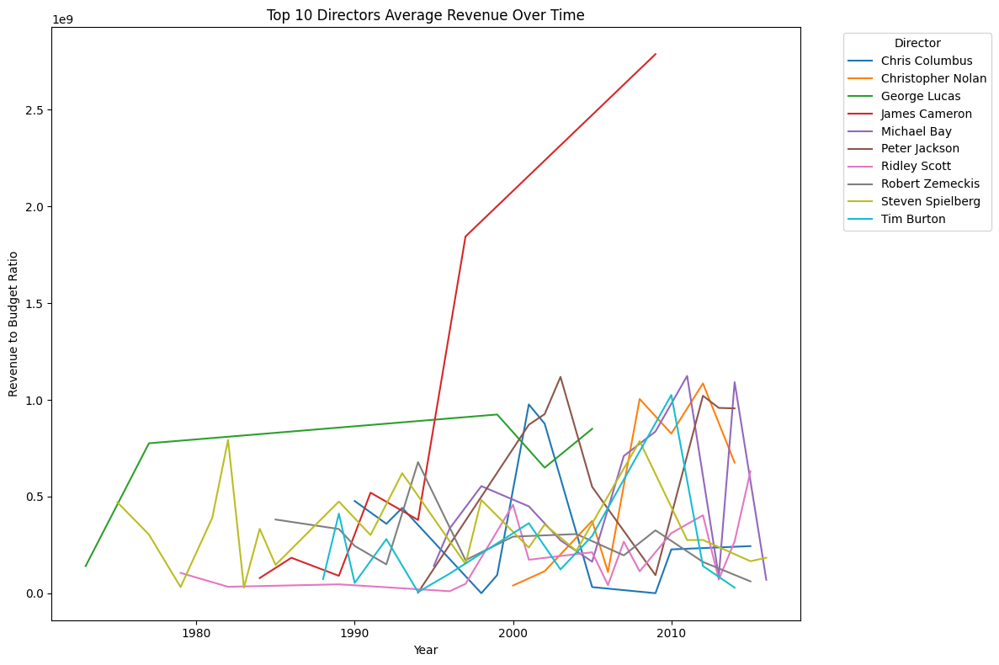

In [98]:
plt.figure(figsize=(12, 8))
sns.lineplot(data=filtered_director_performance, x='release_year', y='average_revenue', hue='director', markers=True, dashes=False)
plt.title('Top 10 Directors Average Revenue Over Time')
plt.xlabel('Year')
plt.ylabel('Revenue to Budget Ratio')
plt.legend(title='Director', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you wi

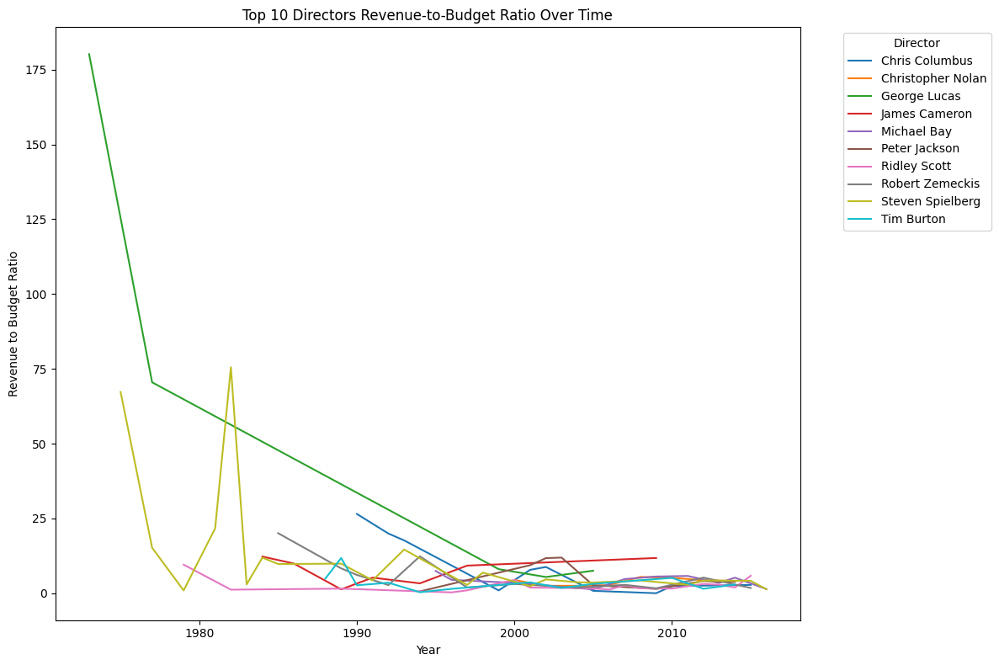

In [99]:
# Plot the performance over time for the ratio of total revenue to total budget
plt.figure(figsize=(12, 8))
sns.lineplot(data=filtered_director_performance, x='release_year', y='revenue_to_budget', hue='director', markers=True, dashes=False)
plt.title('Top 10 Directors Revenue-to-Budget Ratio Over Time')
plt.xlabel('Year')
plt.ylabel('Revenue to Budget Ratio')
plt.legend(title='Director', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


### Observations :- 
- In terms of Total revenue till now , Steven Spielberg , Peter Jackson and James Cameron are at top mostly due to more movies made.
- In terms of Average revenue , Joss Whedon , Pierre Coffin, James Cameron, Peter Jackson and George Lucas are at top.
- In terms of Average rating, Christopher Nolan , Joss Whedon, Peter Jackson and James Cameron are best in terms of movie making as people loved their movies the most.
- In terms of movies count, Steven Spielberg made the most number of movies according to the dataset like more than 25.
- In terms of Average Revenue / Average budget ratio - Pierre Coffin , George Lucas and James Cameron are best with ratio varying from 8 to 12.
- In terms of total revenue from 1970s to 2020s, James Cameron showed the greatest growth till now in his career and same with Christopher Nolan. Steven Spielberg peaked two times in 1982 and 1992 and Peter Jackson in 2003 , Chris Columbus in 2002 and Michael Bay in 2010.
- In terms of average revenue with time, James Cameron ,George Lucas, Tim Burton and Christopher Nolan showed consistency in growth
- In terms of Revenue-Budget ratio, all directors showed decline in the ratio due to coming inflation and more money to make movies nowdays like more budget as more advanced technologies, VFX and high salaries taking casting but James Cameron showed consistency in its ratio which is increasing gradually.

### So overall James Cameron , Christopher Nolan , Ridley Scott, Peter Jackson and George Lucas are top directors having consistently high box office success

## 4. How do user ratings compare between movies in the same genre but different production years? 


/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you wi

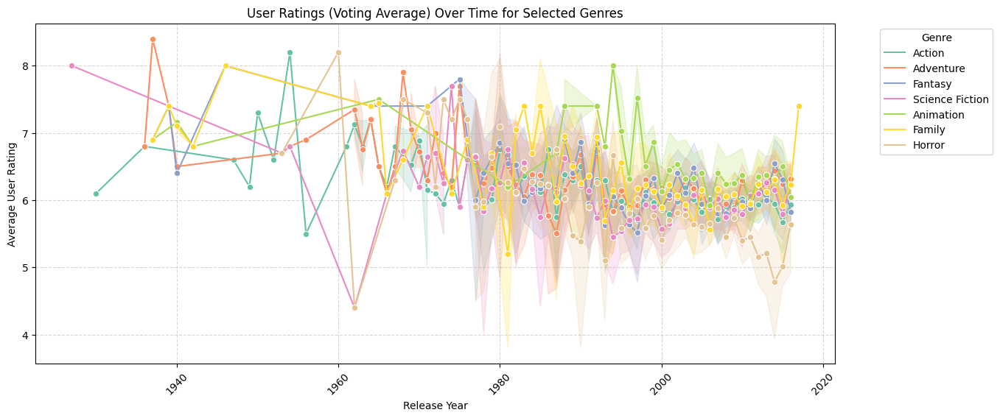

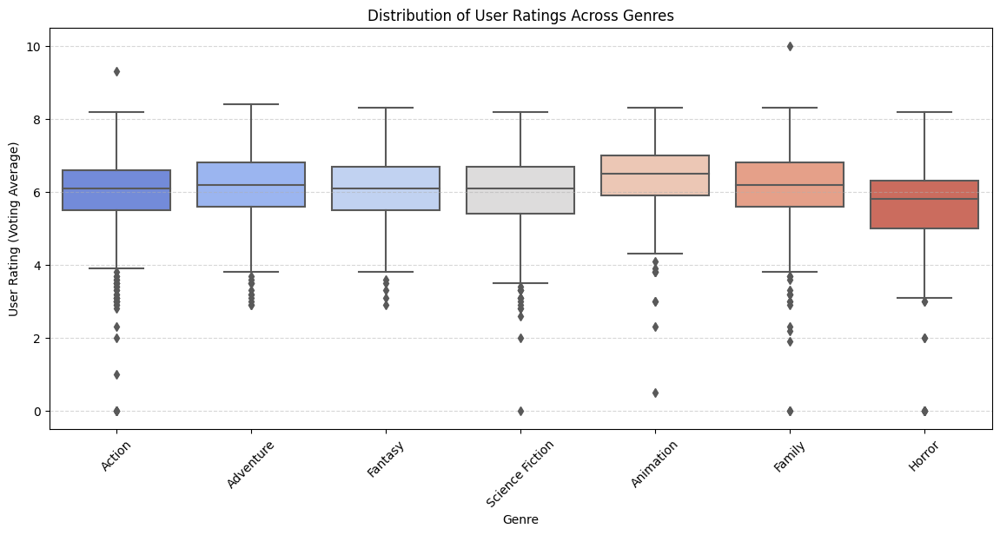

In [101]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Explode genre_list so each genre gets its own row
df_exploded = df.explode('genre_list')

selected_genres = ['Animation', 'Adventure', 'Fantasy', 'Family', 'Horror', 'Science Fiction', 'Action']

# Filter data for only selected genres
df_filtered = df_exploded[df_exploded['genre_list'].isin(selected_genres)]


# --- 1. Line Plot: Voting Average Over Release Years for Selected Genres ---
plt.figure(figsize=(14, 6))
sns.lineplot(data=df_filtered, x='release_year', y='vote_average', hue='genre_list', marker='o', palette='Set2')
plt.title("User Ratings (Voting Average) Over Time for Selected Genres")
plt.xlabel("Release Year")
plt.ylabel("Average User Rating")
plt.xticks(rotation=45)
plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

# --- 2. Boxplot: Distribution of Ratings Across Genres ---
plt.figure(figsize=(14, 6))
sns.boxplot(data=df_filtered, x='genre_list', y='vote_average', palette="coolwarm")
plt.title("Distribution of User Ratings Across Genres")
plt.xlabel("Genre")
plt.ylabel("User Rating (Voting Average)")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()


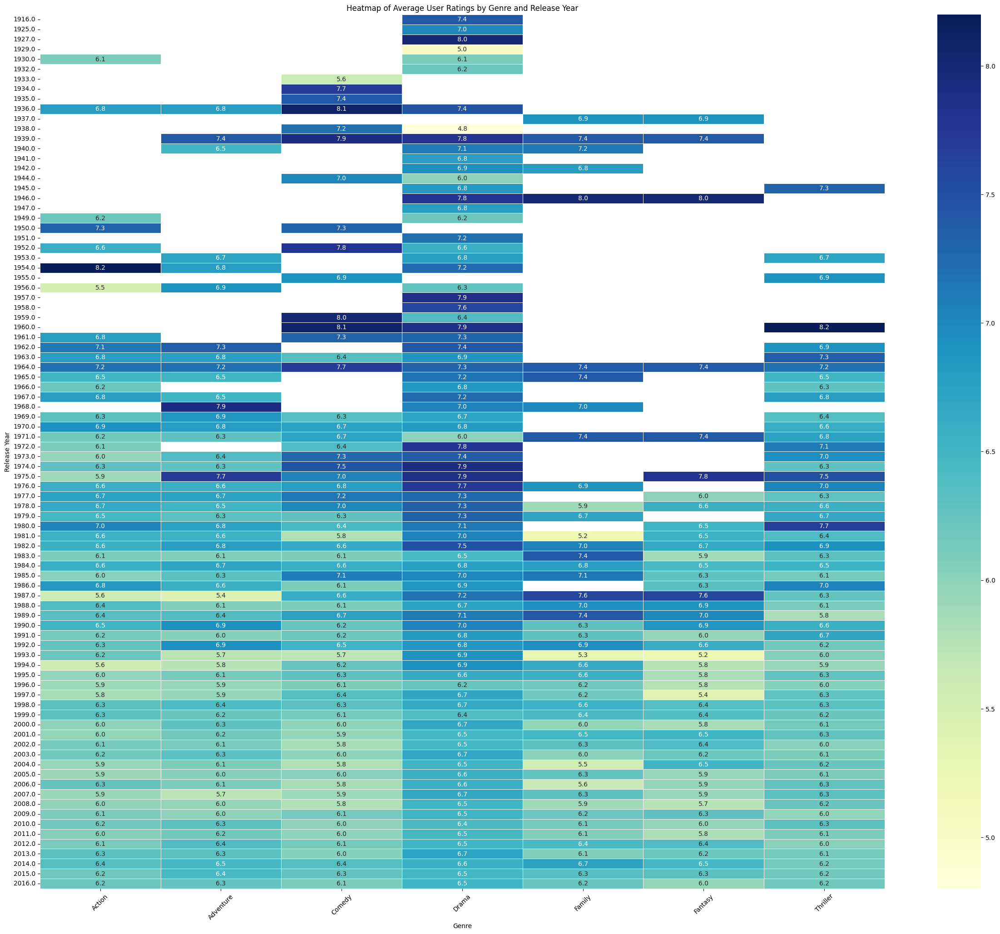

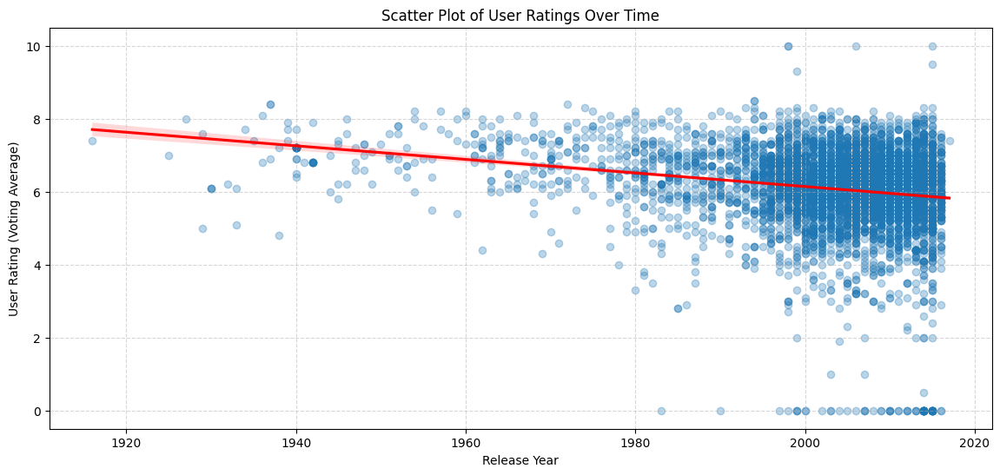

In [152]:
# --- 3. Heatmap: Average Rating by Genre and Release Year ---
df_pivot = df_filtered.pivot_table(index='release_year', columns='genre_list', values='vote_average', aggfunc='mean')

plt.figure(figsize=(30, 25))
sns.heatmap(df_pivot, cmap="YlGnBu", annot=True, fmt=".1f", linewidths=0.5)
plt.title("Heatmap of Average User Ratings by Genre and Release Year")
plt.xlabel("Genre")
plt.ylabel("Release Year")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

# --- 4. Scatter Plot: Rating vs. Release Year with Regression Line ---
plt.figure(figsize=(14, 6))
sns.regplot(data=df, x='release_year', y='vote_average', scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'})
plt.title("Scatter Plot of User Ratings Over Time")
plt.xlabel("Release Year")
plt.ylabel("User Rating (Voting Average)")
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

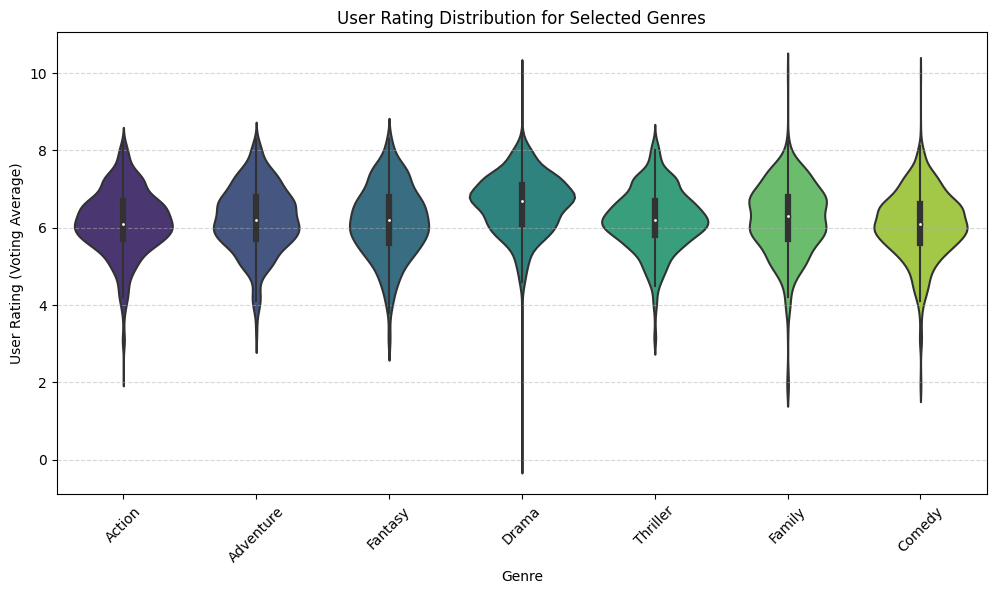

In [156]:
plt.figure(figsize=(12, 6))
sns.violinplot(data=df_filtered, x='genre_list', y='vote_average', palette="viridis")
plt.title("User Rating Distribution for Selected Genres")
plt.xlabel("Genre")
plt.ylabel("User Rating (Voting Average)")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()


/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values

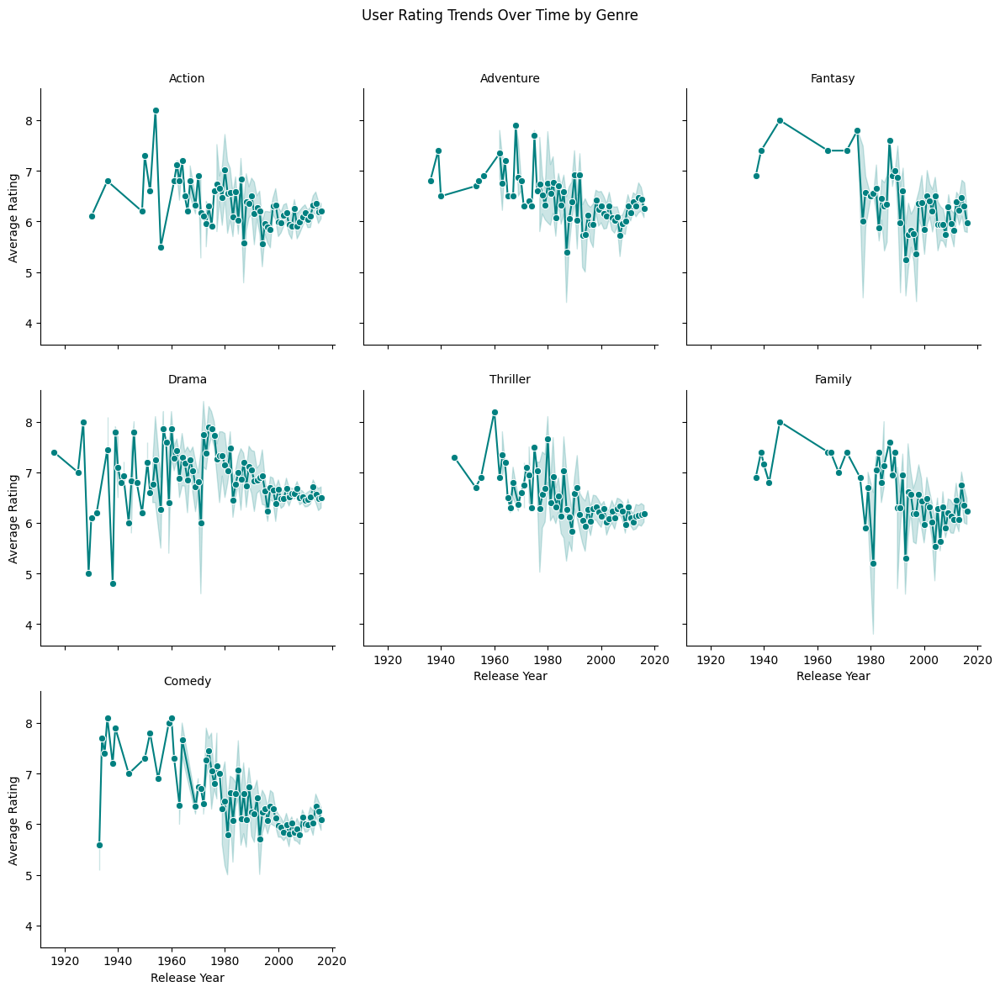

In [157]:
g = sns.FacetGrid(df_filtered, col="genre_list", col_wrap=3, height=4, sharey=True)
g.map_dataframe(sns.lineplot, x="release_year", y="vote_average", marker="o", color="teal")
g.set_axis_labels("Release Year", "Average Rating")
g.set_titles(col_template="{col_name}")
plt.subplots_adjust(top=0.9)
g.fig.suptitle("User Rating Trends Over Time by Genre")
plt.show()


/tmp/ipykernel_96076/3862755733.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['decade'] = (df_filtered['release_year'] // 10) * 10  # Group years into decades


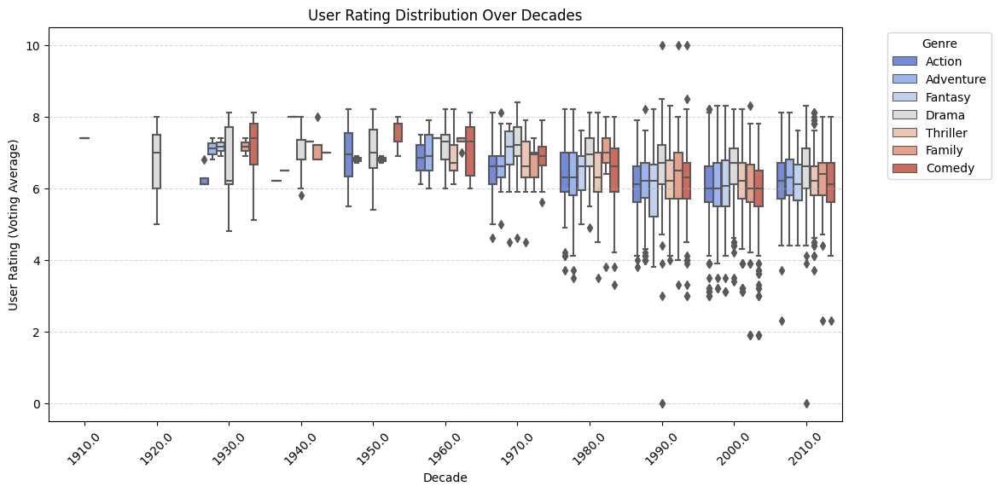

In [162]:
df_filtered['decade'] = (df_filtered['release_year'] // 10) * 10  # Group years into decades

plt.figure(figsize=(12, 6))
sns.boxplot(data=df_filtered, x='decade', y='vote_average', hue='genre_list', palette="coolwarm")
plt.title("User Rating Distribution Over Decades")
plt.xlabel("Decade")
plt.ylabel("User Rating (Voting Average)")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


### Based on the plots showing user ratings for movies across genres and time periods, here are key observations and insights:

- Overall rating decline trend: Scatter plot shows a clear downward trend (red line) in average user ratings from 1920 to 2020.
- Early cinema advantage: Films from the 1930s-1950s generally received higher average ratings (7-8) compared to modern films (mostly 5.5-6.5).
- Rating convergence: Since the 1980s, ratings across all genres have converged to a narrower range (roughly 5.5-6.5).
- Genre variability:

   - Animation has the highest median rating and least volatility 
   - Horror shows the lowest median rating and highest variability 


- Increased rating variance: Modern films (post-1980s) show significantly more spread in ratings, with more extreme lows and occasional perfect 10s
- Genre-specific trends :

   - Thriller shows the steepest decline over time
   - Drama has maintained the most consistent ratings
   - Fantasy experienced dramatic fluctuations, especially in the 1970s-1990s


- Rating floor: While older films rarely received ratings below 5, modern films frequently receive ratings as low as 2-3 .
- Rating distribution: Most genres show a similar bell-shaped distribution with median ratings around 6, but with different spreads.
- Rating stability: The 2000s-2020s show relatively stable average ratings by genre, though with greater variance than earlier periods.
- Perfect ratings: Perfect 10 ratings appear more frequently in recent decades (1990s-2010s) despite the overall downward trend .

## 5. How has the average movie budget changed over time?


/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


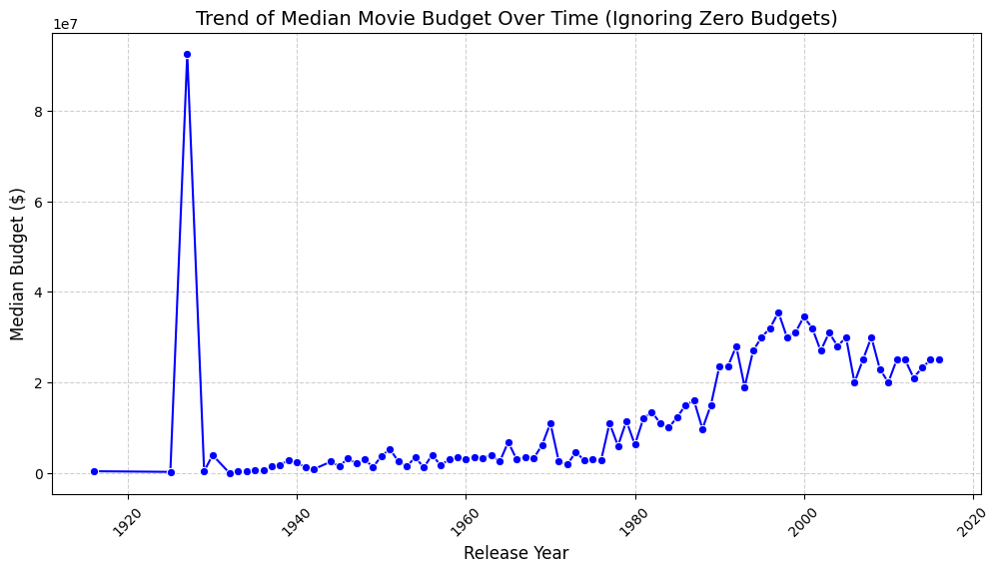

In [103]:
df_filtered = df[df['budget'] > 0]

# Group by release year and compute median budget to avoid skewness
yearly_budget = df_filtered.groupby('release_year')['budget'].median().reset_index()

# Plot the trend
plt.figure(figsize=(12, 6))
sns.lineplot(data=yearly_budget, x='release_year', y='budget', marker='o', color='b')

# Formatting
plt.title('Trend of Median Movie Budget Over Time (Ignoring Zero Budgets)', fontsize=14)
plt.xlabel('Release Year', fontsize=12)
plt.ylabel('Median Budget ($)', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.xticks(rotation=45)

# Show plot
plt.show()


/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you wi

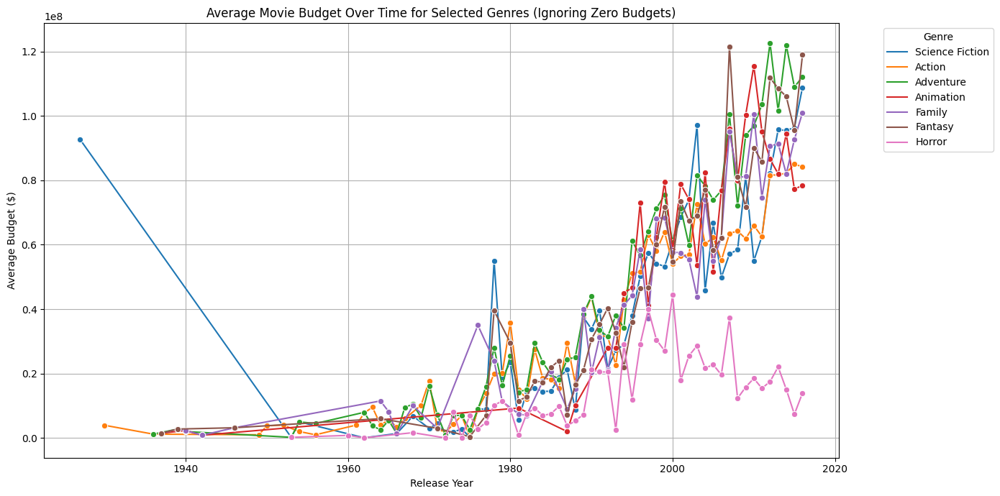

In [104]:
selected_genres = ['Animation', 'Adventure', 'Fantasy', 'Family', 'Horror', 'Science Fiction','Action']
df_exploded = df.explode('genre_list')
df_filtered = df_exploded[(df_exploded['genre_list'].isin(selected_genres)) & (df_exploded['budget'] > 0)]
genre_yearly_budget = df_filtered.groupby(['release_year', 'genre_list'])['budget'].mean().reset_index()

plt.figure(figsize=(14, 7))
sns.lineplot(data=genre_yearly_budget, x='release_year', y='budget', hue='genre_list', marker='o')
plt.xlabel('Release Year')
plt.ylabel('Average Budget ($)')
plt.title('Average Movie Budget Over Time for Selected Genres (Ignoring Zero Budgets)')
plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


## Observations:-
### Overall Budget Trend :

- There was a dramatic spike in median movie budgets around 1925, reaching nearly $90 million (adjusted for inflation). This could be due to the transition from silent films to "talkies" requiring significant technological investment.
- From 1930 to 1970, median budgets remained relatively stable and low, hovering around $5-10 million.
- Starting from 1980, there's been a steady upward trend in median budgets, rising from about $10 million to stabilizing around $20-30 million in the 2000s-2010s.

### Genre-Specific Trends :

- Science Fiction shows an interesting pattern - extremely high budgets in the 1930s (around $90 million) that declined sharply through the 1940s-50s, before rising again from the 1980s onward.
- Since 2000, several genres (Fantasy, Adventure, Animation, Science Fiction) have seen dramatic budget increases, frequently exceeding $100 million.
- Horror consistently maintains the lowest budgets among all genres shown, rarely exceeding $40 million even in recent years.
- Fantasy and Adventure films have become the most expensive to produce in recent years, with budgets often reaching $120 million.

### Reasons for the Budget Increases:

- Technological Advancement: The rise of CGI and digital effects has driven up production costs, particularly for sci-fi, fantasy, and adventure films.
- Competition: With the rise of streaming and multiple entertainment options, studios are investing more in spectacle and production value to attract audiences.
- Marketing Costs: Modern movie budgets often include substantial marketing expenditures to compete in a crowded marketplace.
- Globalization: Movies are increasingly made for a global audience, requiring higher production values and more expensive action sequences that translate well across cultures.
- Star Power: Rising actor and director salaries, especially for blockbuster films, have contributed to higher budgets.

The most dramatic change has been the steady increase since the 1980s and the genre differentiation, with certain categories (Fantasy, Adventure, Sci-Fi) commanding much higher budgets than others (Horror). This reflects both the technological capabilities available to filmmakers and changing audience expectations for different genres.

## 6. Which months are most popular for movie releases?

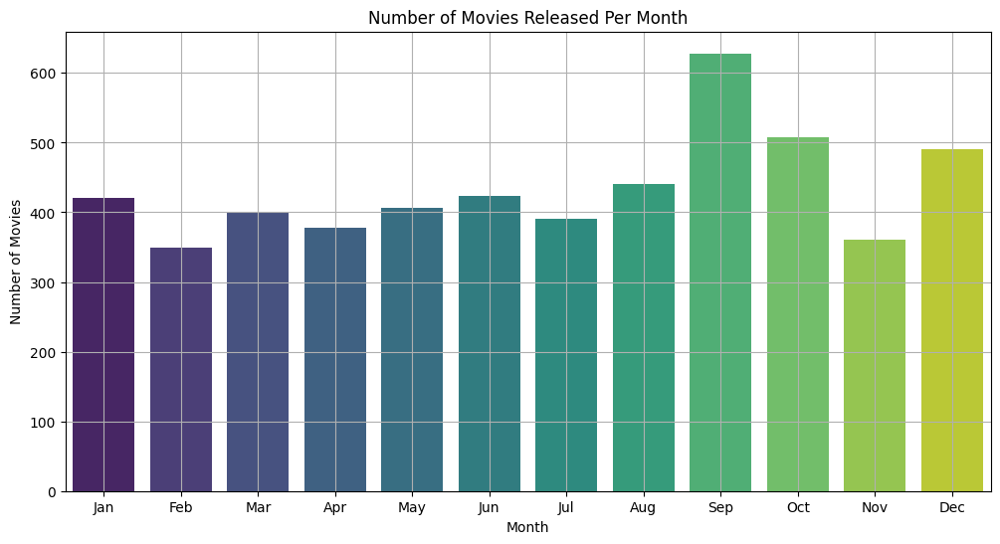

In [105]:
plt.figure(figsize=(12, 6))
sns.countplot(data=df, x='release_month', palette='viridis')
plt.title('Number of Movies Released Per Month')
plt.xlabel('Month')
plt.ylabel('Number of Movies')
plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid()
plt.show()


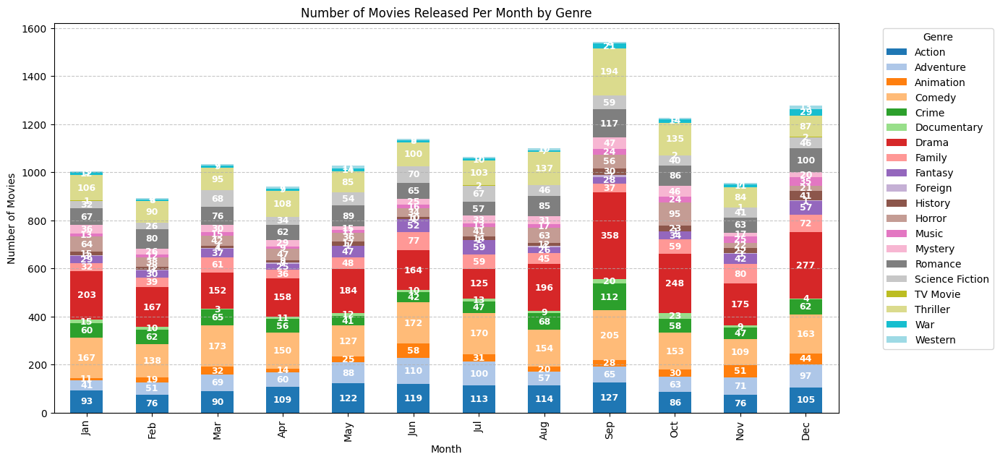

In [106]:
genre_monthly = df.explode('genre_list').groupby(['release_month', 'genre_list']).size().unstack()

ax = genre_monthly.plot(kind='bar', stacked=True, figsize=(14, 7), colormap='tab20')

plt.title('Number of Movies Released Per Month by Genre')
plt.xlabel('Month')
plt.ylabel('Number of Movies')

plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)

for p in ax.patches:
    height = p.get_height()
    if height > 0: 
        ax.annotate(f'{int(height)}', 
                    (p.get_x() + p.get_width() / 2, p.get_y() + height / 2), 
                    ha='center', va='center', fontsize=9, color='white', fontweight='bold')
plt.show()


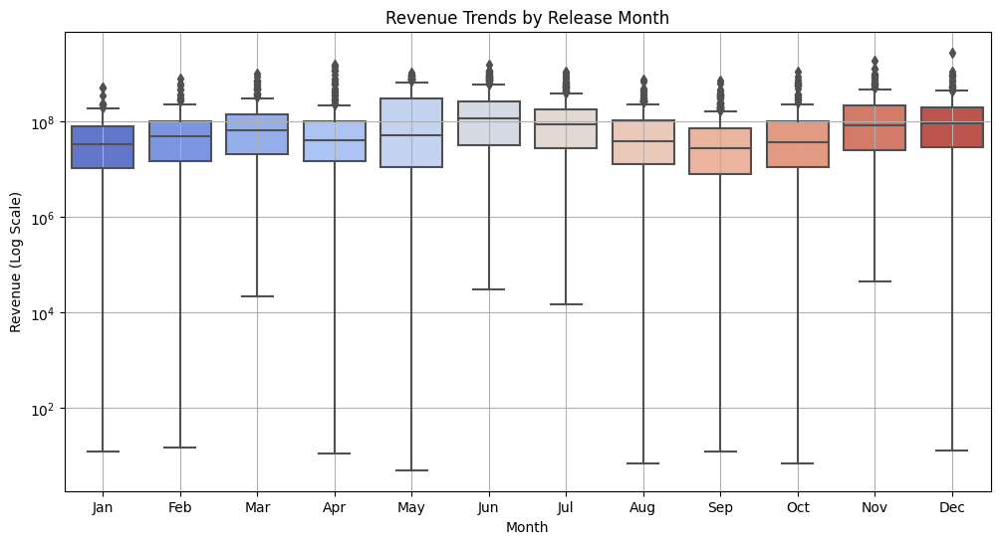

In [107]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df[df['revenue'] > 0], x='release_month', y='revenue', palette='coolwarm')
plt.yscale('log')  # Handle skewness
plt.title('Revenue Trends by Release Month')
plt.xlabel('Month')
plt.ylabel('Revenue (Log Scale)')
plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid()
plt.show()


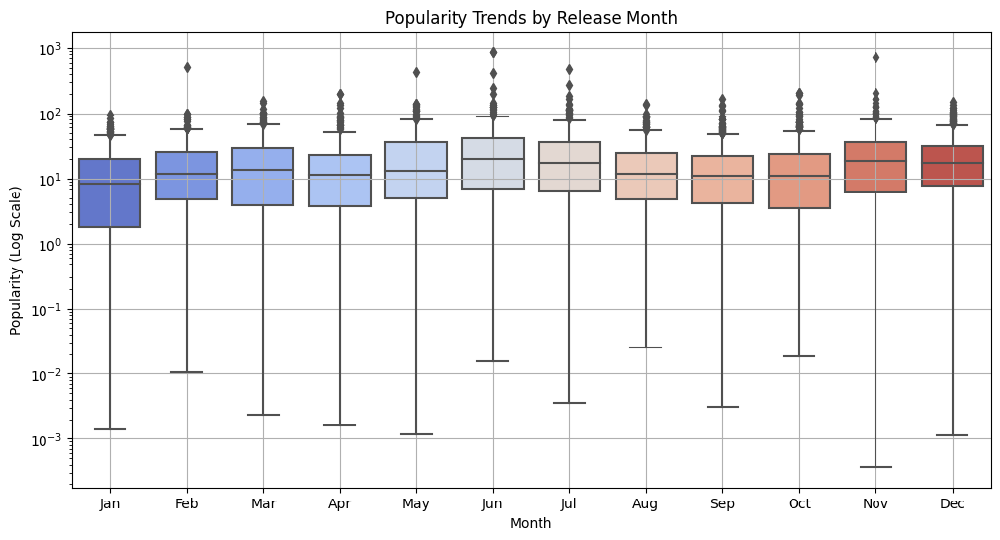

In [108]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df[df['popularity'] > 0], x='release_month', y='popularity', palette='coolwarm')
plt.yscale('log')  # Handle skewness
plt.title('Popularity Trends by Release Month')
plt.xlabel('Month')
plt.ylabel('Popularity (Log Scale)')
plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid()
plt.show()


/tmp/ipykernel_96076/2320823434.py:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=df, x='release_month', y='vote_average', estimator='mean', ci=None, marker='o', color='red')
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


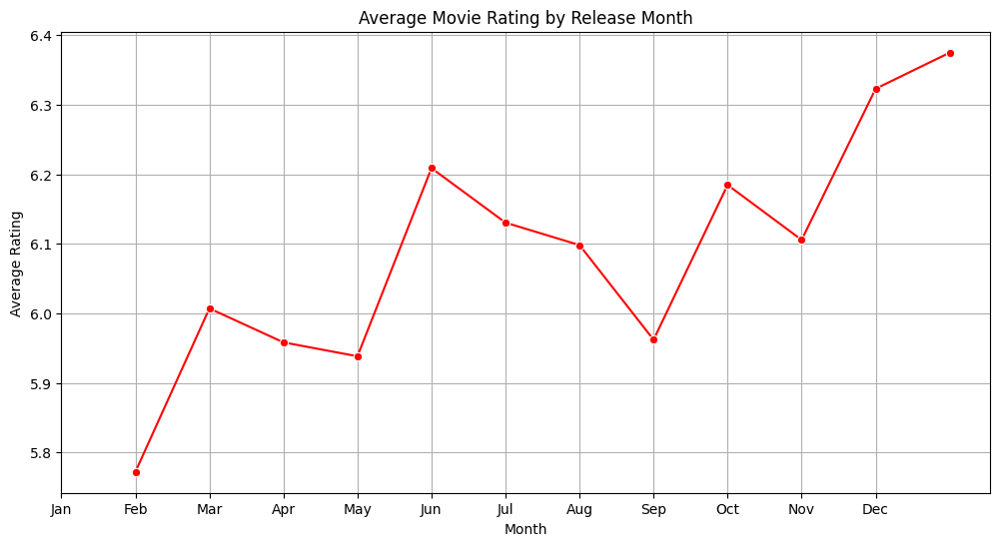

In [109]:
plt.figure(figsize=(12, 6))
sns.lineplot(data=df, x='release_month', y='vote_average', estimator='mean', ci=None, marker='o', color='red')
plt.title('Average Movie Rating by Release Month')
plt.xlabel('Month')
plt.ylabel('Average Rating')
plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid()
plt.show()


/tmp/ipykernel_96076/4159139585.py:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=df, x='release_month', y='popularity', estimator='mean', ci=None, marker='o', color='red')
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


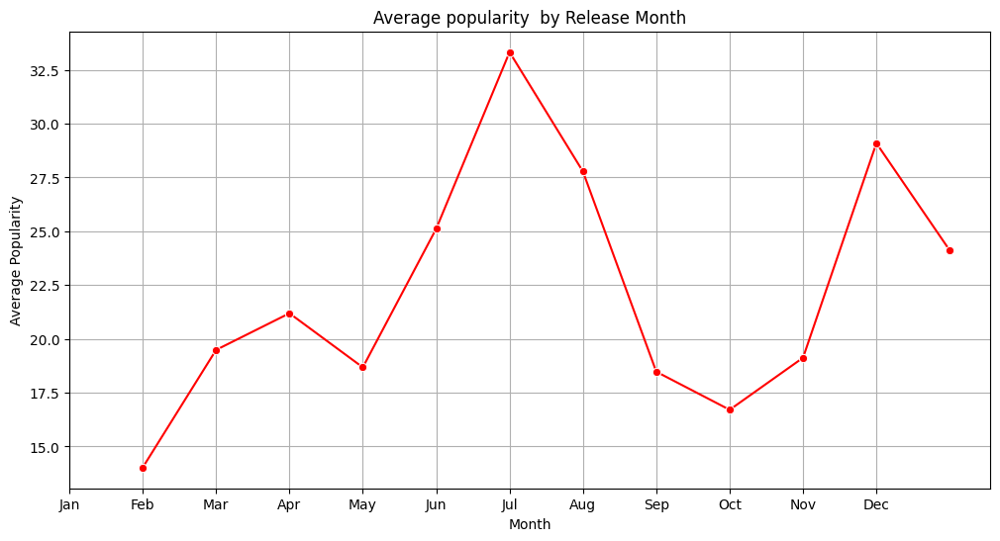

In [110]:
plt.figure(figsize=(12, 6))
sns.lineplot(data=df, x='release_month', y='popularity', estimator='mean', ci=None, marker='o', color='red')
plt.title('Average popularity  by Release Month')
plt.xlabel('Month')
plt.ylabel('Average Popularity')
plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid()
plt.show()


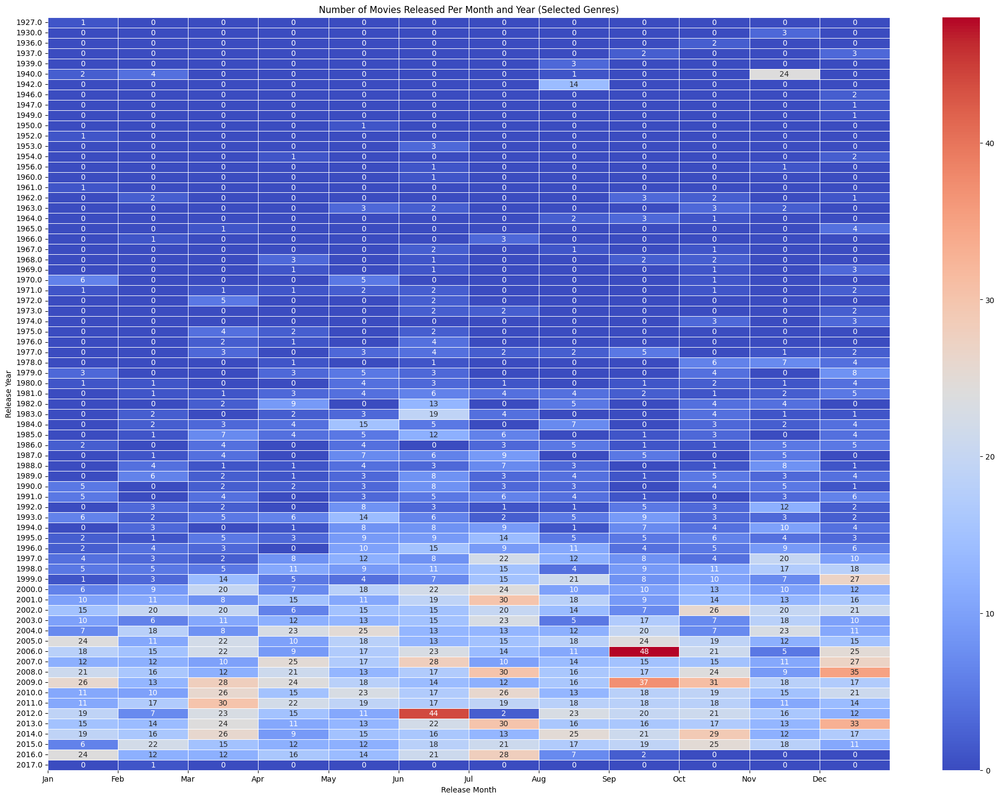

In [111]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Define selected genres
selected_genres = ['Animation', 'Adventure', 'Fantasy', 'Family', 'Horror', 'Science Fiction', 'Action']

# Explode the genre list and filter only selected genres
filtered_df = df.explode('genre_list')
filtered_df = filtered_df[filtered_df['genre_list'].isin(selected_genres)]

# Count movies released per year and month
heatmap_data = filtered_df.groupby(['release_year', 'release_month']).size().unstack(fill_value=0)

# Plot heatmap
plt.figure(figsize=(25, 18))
sns.heatmap(heatmap_data, cmap='coolwarm', annot=True, fmt='d', linewidths=0.5)

plt.title('Number of Movies Released Per Month and Year (Selected Genres)')
plt.xlabel('Release Month')
plt.ylabel('Release Year')

plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.yticks(rotation=0)

plt.show()


### Inferences :-
- Most Popular Release Months:

  - September has the highest number of releases, with approximately 1,500 movies. This coincides with the fall film festival season (Venice, Toronto, etc.) and the beginning of awards season.
  - December shows the second-highest number of releases (around 1,250 movies), which aligns with the holiday season and Oscar-qualifying releases.
  - June and July also show strong numbers (approximately 1,100-1,150 movies each), corresponding to the summer blockbuster season.

- Genre-Specific Patterns:

  - Drama films dominate releases across most months, but are especially prevalent in September (358 films) and December (277 films).
  - Action movies maintain relatively consistent numbers throughout the year (80-120 films per month), with slight increases during summer months.
  - Comedy films show higher numbers in summer months (June-August), likely targeting vacation audiences.
  - TV Movies and Thrillers show significant presence in the fall months.

- Historical Trends :

  - The number of monthly releases has increased substantially from the 1920s-1970s (0-5 movies per month) to the 2000s-2010s (15-40 movies per month).
  - The modern release calendar shows more strategic scheduling, with clear peak periods.

- Reasons for These Patterns:

   - September/Fall releases:

     - Film festival circuit
     - Start of awards season
     - Return of adult audiences after summer


  - December releases:

     - Holiday season viewing
     - Oscar qualification deadlines
     - Family gathering opportunities


  - Summer releases (June/July):

    - School holidays
    - Better weather for theater attendance
    - Traditional blockbuster season


  - Slower months (January/February):

    - Post-holiday lull
    - Winter weather in many markets
    - Competition with major sporting events



The data shows that movie releases are not randomly distributed but follow strategic patterns based on audience availability, award consideration timing, and traditional viewing habits. The industry has developed these patterns to maximize audience reach and commercial success for different types of films.

## 7. How does the number of spoken languages correlate with international revenue?

In [112]:
df['num_languages'].unique()

array([2, 1, 5, 3, 4, 6, 9, 7, 0, 8])

In [113]:
df['original_language'].unique()

array(['en', 'ja', 'fr', 'zh', 'es', 'de', 'hi', 'ru', 'ko', 'te', 'cn',
       'it', 'nl', 'ta', 'sv', 'th', 'da', 'xx', 'hu', 'cs', 'pt', 'is',
       'tr', 'nb', 'af', 'pl', 'he', 'ar', 'vi', 'ky', 'id', 'ro', 'fa',
       'no', 'sl', 'ps', 'el'], dtype=object)

🔍 Key Questions to Explore:

  - How does the number of spoken languages affect revenue?
        Do movies with more languages have higher international revenue?
  - Is there a difference in revenue based on the original language?
        Comparing English vs. non-English movies.
  - What is the distribution of movies based on spoken languages?
        Checking if most movies have only one language.

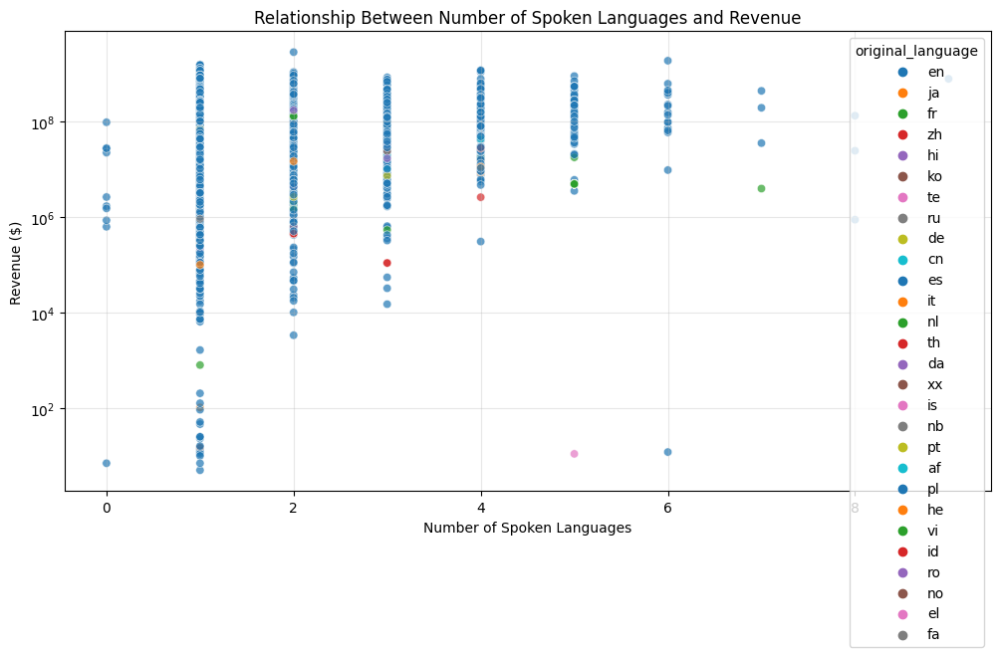

In [114]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
sns.scatterplot(data=df[df['revenue'] > 0], x='num_languages', y='revenue', hue='original_language', palette='tab10', alpha=0.7)

plt.title('Relationship Between Number of Spoken Languages and Revenue')
plt.xlabel('Number of Spoken Languages')
plt.ylabel('Revenue ($)')
plt.yscale('log')  # Use log scale to handle large revenue variations
plt.grid(alpha=0.3)

plt.show()


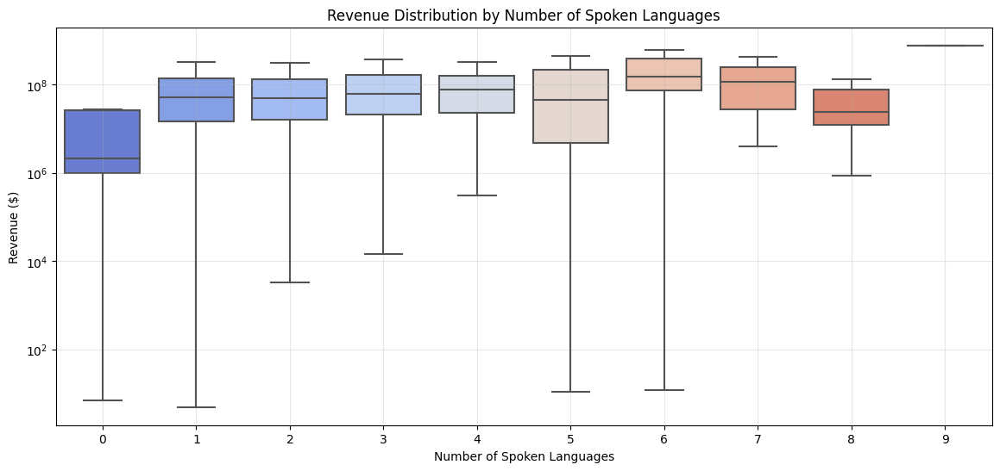

In [115]:
plt.figure(figsize=(14, 6))
sns.boxplot(data=df[df['revenue'] > 0], x='num_languages', y='revenue', showfliers=False, palette='coolwarm')

plt.title('Revenue Distribution by Number of Spoken Languages')
plt.xlabel('Number of Spoken Languages')
plt.ylabel('Revenue ($)')
plt.yscale('log')  # Log scale to handle large differences in revenue
plt.grid(alpha=0.3)

plt.show()


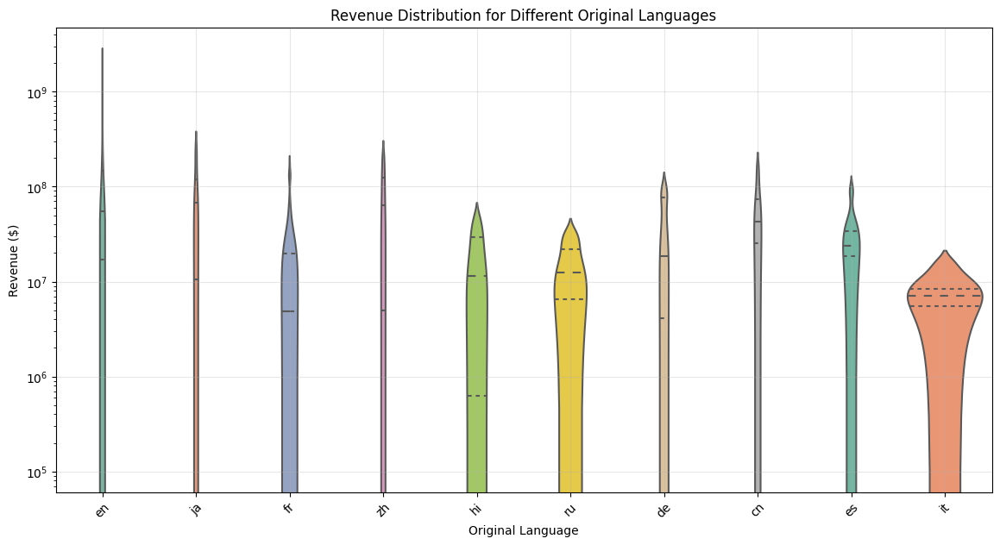

In [116]:
plt.figure(figsize=(14, 7))
top_languages = df['original_language'].value_counts().index[:10]  # Top 10 languages
filtered_df = df[df['original_language'].isin(top_languages) & (df['revenue'] > 0)]

sns.violinplot(data=filtered_df, x='original_language', y='revenue', palette='Set2', inner='quartile')

plt.title('Revenue Distribution for Different Original Languages')
plt.xlabel('Original Language')
plt.ylabel('Revenue ($)')
plt.yscale('log')
plt.xticks(rotation=45)
plt.grid(alpha=0.3)

plt.show()


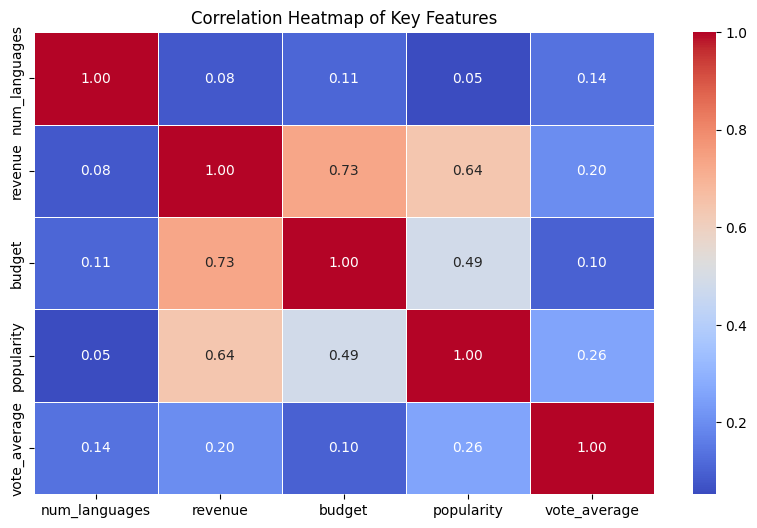

In [117]:
import numpy as np

plt.figure(figsize=(10, 6))
corr_matrix = df[['num_languages', 'revenue', 'budget', 'popularity', 'vote_average']].corr()

sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

plt.title('Correlation Heatmap of Key Features')
plt.show()


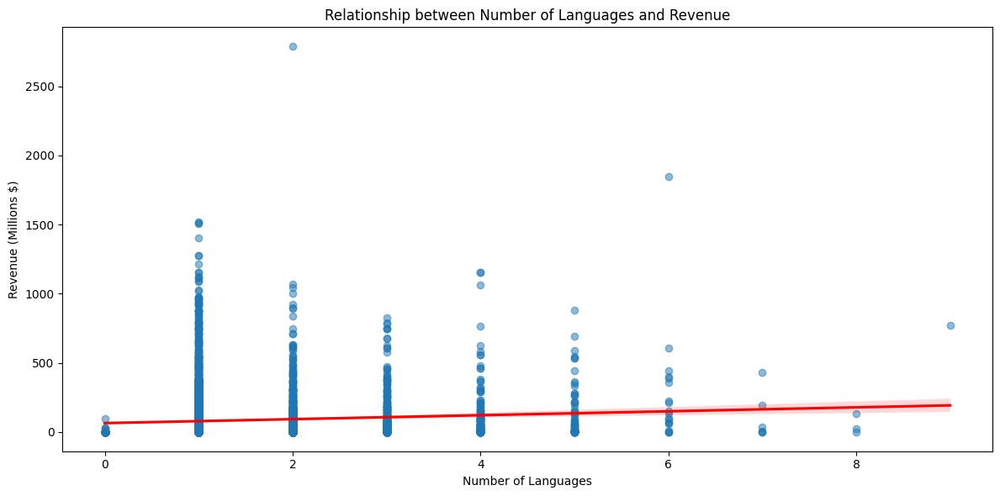

In [118]:
plt.figure(figsize=(12, 6))
        
# Create scatter plot with regression line
sns.regplot(data=df, x='num_languages', y='revenue_millions', 
                   scatter_kws={'alpha':0.5}, line_kws={'color': 'red'})
        
plt.title('Relationship between Number of Languages and Revenue')
plt.xlabel('Number of Languages')
plt.ylabel('Revenue (Millions $)')
plt.tight_layout()
plt.show()

In [119]:
stats_dict = {
            'avg_languages': df['num_languages'].mean(),
            'median_languages': df['num_languages'].median(),
            'max_languages': df['num_languages'].max(),
            'language_correlation': df['num_languages'].corr(df['revenue']),
            'english_movies_pct': (df['is_english'].mean() * 100)
        }
        
print("\n=== Basic Statistics ===")
print(f"Average number of languages per movie: {stats_dict['avg_languages']:.2f}")
print(f"Median number of languages per movie: {stats_dict['median_languages']:.0f}")
print(f"Maximum number of languages in a movie: {stats_dict['max_languages']:.0f}")
print(f"Correlation between number of languages and revenue: {stats_dict['language_correlation']:.3f}")
print(f"Percentage of English movies: {stats_dict['english_movies_pct']:.1f}%")


=== Basic Statistics ===
Average number of languages per movie: 1.45
Median number of languages per movie: 1
Maximum number of languages in a movie: 9
Correlation between number of languages and revenue: 0.081
Percentage of English movies: 93.3%


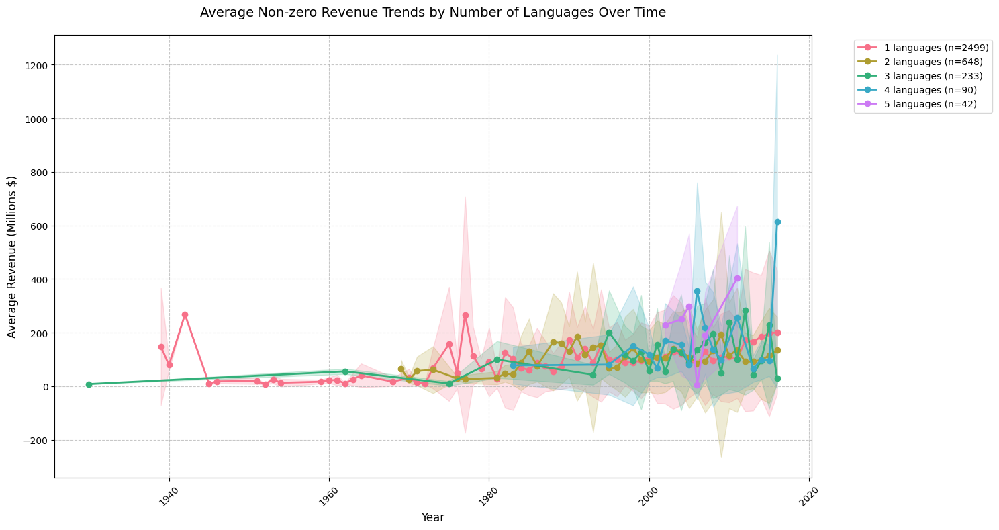


Summary Statistics for Non-zero Revenue by Language Count:
                 mean                count
                 mean     max    min   sum
num_languages                             
1               90.48  267.45   7.47  2499
2              101.94  191.75  23.32   648
3              112.56  282.25   8.00   233
4              166.78  615.15  65.27    90
5              228.76  402.81   5.55    42


In [120]:
def analyze_nonzero_revenue_trends(df):
    # Convert revenue to millions and create year column if not exists
    if 'revenue_millions' not in df.columns:
        df['revenue_millions'] = df['revenue'] / 1_000_000
    if 'release_year' not in df.columns:
        df['release_year'] = pd.to_datetime(df['release_date']).dt.year
    
    # Filter for non-zero revenue
    df_nonzero = df[df['revenue_millions'] > 0]
    
    # Calculate yearly averages by language count
    yearly_lang_revenue = df_nonzero.groupby(['release_year', 'num_languages'])['revenue_millions'].agg([
        'mean',
        'count',
        'std'
    ]).reset_index()
    
    # Filter for years with sufficient data (e.g., at least 3 movies)
    yearly_lang_revenue = yearly_lang_revenue[yearly_lang_revenue['count'] >= 3]
    
    # Create the plot
    plt.figure(figsize=(15, 8))
    
    # Color palette for different language counts
    palette = sns.color_palette("husl", n_colors=len(yearly_lang_revenue['num_languages'].unique()))
    
    # Plot each language count as a separate line
    for (num_lang, color) in zip(sorted(yearly_lang_revenue['num_languages'].unique()), palette):
        data = yearly_lang_revenue[yearly_lang_revenue['num_languages'] == num_lang]
        
        # Plot the mean line
        plt.plot(data['release_year'], data['mean'], 
                label=f'{num_lang} languages (n={data["count"].sum()})',
                color=color, marker='o', linewidth=2, markersize=6)
        
        # Add confidence interval
        plt.fill_between(data['release_year'],
                        data['mean'] - data['std'],
                        data['mean'] + data['std'],
                        color=color, alpha=0.2)

    # Customize the plot
    plt.title('Average Non-zero Revenue Trends by Number of Languages Over Time',
              fontsize=14, pad=20)
    plt.xlabel('Year', fontsize=12)
    plt.ylabel('Average Revenue (Millions $)', fontsize=12)
    
    # Customize legend
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
    
    # Customize grid
    plt.grid(True, linestyle='--', alpha=0.7)
    
    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45)
    
    # Adjust layout to prevent label cutoff
    plt.tight_layout()
    
    # Show the plot
    plt.show()
    
    # Return summary statistics
    summary_stats = yearly_lang_revenue.groupby('num_languages').agg({
        'mean': ['mean', 'max', 'min'],
        'count': 'sum'
    }).round(2)
    
    print("\nSummary Statistics for Non-zero Revenue by Language Count:")
    print(summary_stats)
    
    return yearly_lang_revenue, summary_stats

# Example usage:

# Assuming df is your DataFrame
trends, stats = analyze_nonzero_revenue_trends(df)


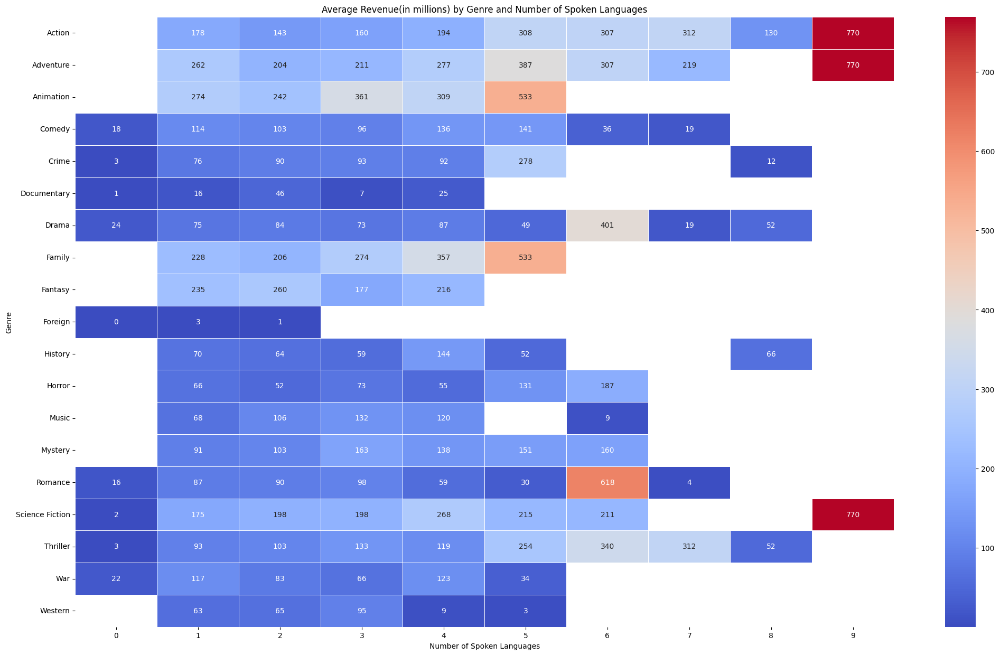

In [121]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Ensure 'genre_list' is a list before exploding
df['genre_list'] = df['genre_list'].apply(lambda x: x if isinstance(x, list) else [])

# Explode genres to create multiple rows for each genre
df_exploded = df.explode('genre_list')

# Drop NaNs in critical columns before proceeding
df_exploded = df_exploded.dropna(subset=['num_languages', 'genre_list', 'revenue'])

# Convert num_languages to integer (if needed)
df_exploded['num_languages'] = df_exploded['num_languages'].astype(int)

# Group by genre and number of languages, then calculate average revenue
heatmap_data = df_exploded[df_exploded['revenue_millions'] > 0].groupby(['genre_list', 'num_languages']).agg(avg_revenue=('revenue_millions', 'mean')).reset_index()

# Pivot the data for heatmap
heatmap_pivot = heatmap_data.pivot(index='genre_list', columns='num_languages', values='avg_revenue')

# Check if heatmap_pivot is empty
if heatmap_pivot.empty:
    print("No data available for heatmap after filtering. Check the dataset.")
else:
    # Plot heatmap
    plt.figure(figsize=(25, 15))
    sns.heatmap(heatmap_pivot, cmap='coolwarm', annot=True, fmt='.0f', linewidths=0.5)

    plt.title('Average Revenue(in millions) by Genre and Number of Spoken Languages')
    plt.xlabel('Number of Spoken Languages')
    plt.ylabel('Genre')
    plt.show()


/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you wi

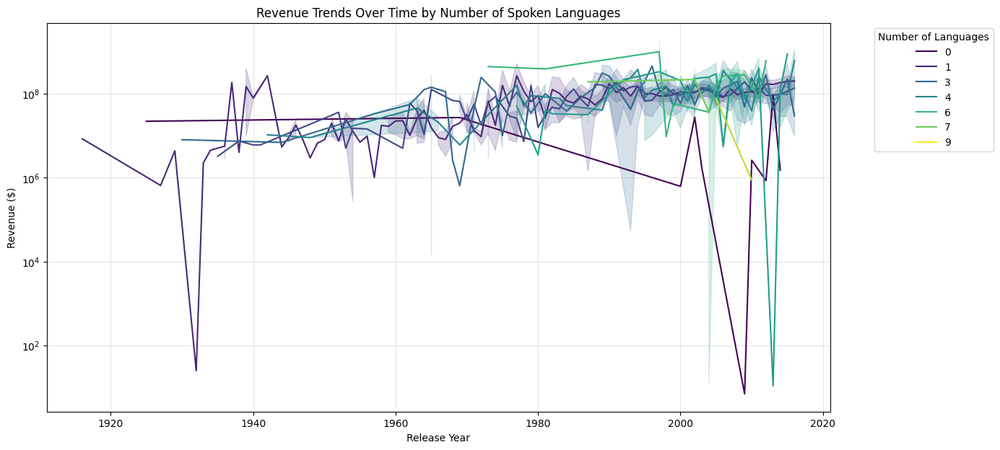

In [122]:
plt.figure(figsize=(14, 7))
sns.lineplot(data=df[df['revenue'] > 0], x='release_year', y='revenue', hue='num_languages', palette='viridis')

plt.title('Revenue Trends Over Time by Number of Spoken Languages')
plt.xlabel('Release Year')
plt.ylabel('Revenue ($)')
plt.yscale('log')  # Log scale to handle revenue differences
plt.legend(title='Number of Languages', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(alpha=0.3)

plt.show()


<Figure size 1400x700 with 0 Axes>

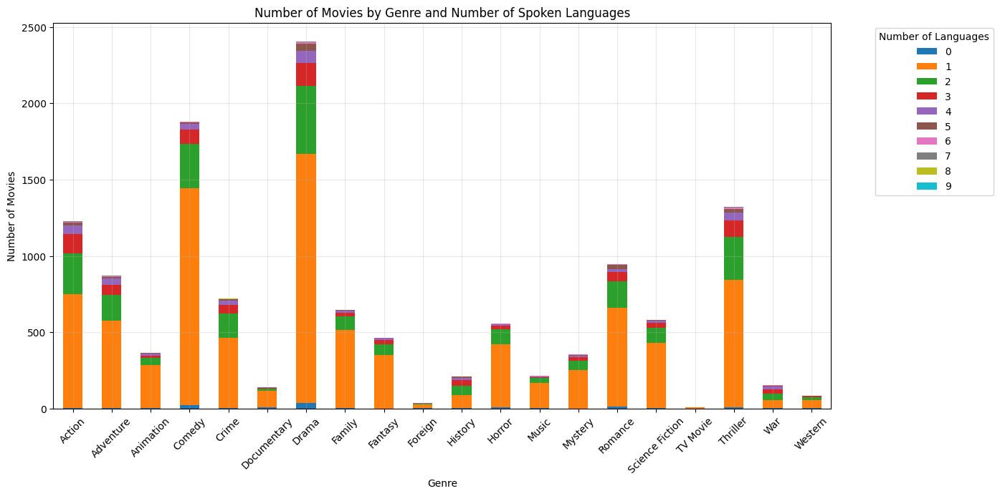

In [123]:
plt.figure(figsize=(14, 7))
genre_lang_count = df_exploded.groupby(['genre_list', 'num_languages']).size().unstack()

# Stacked bar chart
genre_lang_count.plot(kind='bar', stacked=True, colormap='tab10', figsize=(14, 7))

plt.title('Number of Movies by Genre and Number of Spoken Languages')
plt.xlabel('Genre')
plt.ylabel('Number of Movies')
plt.legend(title='Number of Languages', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.grid(alpha=0.3)

plt.show()


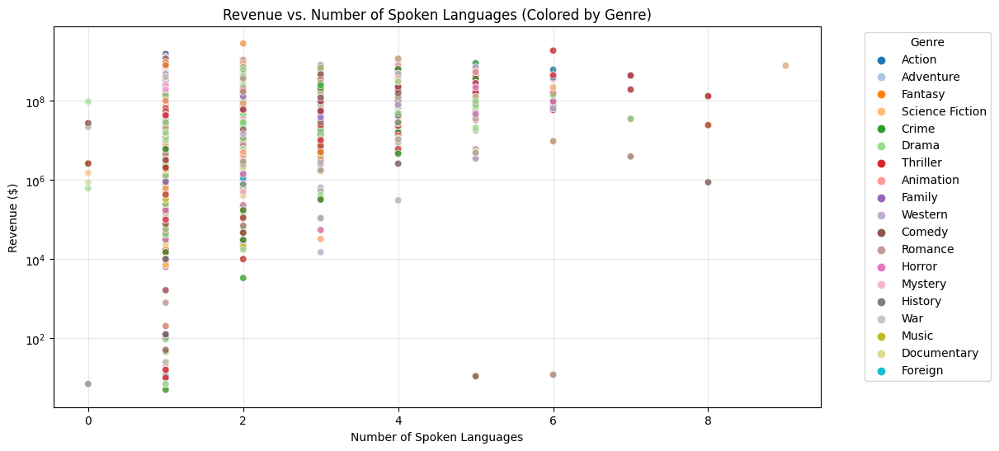

In [124]:
plt.figure(figsize=(12, 6))
sns.scatterplot(data=df_exploded[df_exploded['revenue'] > 0], x='num_languages', y='revenue', hue='genre_list', palette='tab20', alpha=0.7)

plt.title('Revenue vs. Number of Spoken Languages (Colored by Genre)')
plt.xlabel('Number of Spoken Languages')
plt.ylabel('Revenue ($)')
plt.yscale('log')
plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(alpha=0.3)

plt.show()




- Impact of Multiple Languages on Revenue:

    - General Revenue Trend:

      - Movies with 4-6 languages tend to have higher median revenues (around $100M-$200M)
      - The box plot shows a slight upward trend in median revenue as the number of languages increases up to 6 languages
      - However, movies with 7+ languages show more variance and slightly lower median revenues

     - Genre-Specific Patterns :

       - Action, Adventure, and Science Fiction films with 9 languages show the highest average revenue ($770M)
       - Animation and Family films peak at 5 languages ($533M)
       - Romance shows a significant spike at 6 languages ($618M)
       - Western and Foreign films generally have lower revenues regardless of language count

     - Original Language Impact:

       - English vs Non-English :

        - English (en) dominates as the original language across all revenue levels 
        - Japanese (ja), French (fr), and Chinese (zh) appear occasionally in higher revenue brackets
        - Non-English original language films generally show lower revenue distributions

    - Distribution of Movies by Language Count:

     - Movie Count Distribution :

       - The vast majority of movies are made in 1-2 languages
       - Drama, Comedy, and Action genres have the highest number of multilingual productions
       - Foreign films, despite being multilingual by nature, represent a small portion of the dataset

    - Historical Trends :

     - Evolution Over Time:

       - Since 1970, movies with 3-5 languages have shown increasingly stable revenue performance
       - Revenue volatility is higher for movies with more languages
       - The average revenue for multilingual films has generally increased since 1990

  - Key Insights:

    - Optimal Language Count:

      - 4-6 languages appear to be the "sweet spot" for maximizing revenue potential
      - This likely represents a balance between production complexity and international market access

    - Genre Considerations:

      - Big-budget genres (Action, Adventure, Sci-Fi) benefit most from multiple languages
      - Certain genres (Horror, Documentary) show limited revenue benefit from additional languages

    - Market Evolution:

     - The industry has become more sophisticated in handling multilingual productions
     - Revenue potential for multilingual films has increased over time
     - English remains the dominant original language for high-revenue films

    - Risk vs. Reward:

      - While adding languages can increase revenue potential, it also increases variability in returns
      - The highest-grossing films tend to be multilingual, but so do many lower-performing ones

These patterns suggest that while multiple languages can enhance a film's revenue potential, success depends heavily on genre, production quality, and market positioning rather than just language count alone. The trend toward multilingual productions reflects both globalization of the film industry and strategic targeting of international markets.


## 8. What's the distribution of movie runtimes by genre?

In [125]:
def analyze_runtime_distribution(df):
    plt.figure(figsize=(10, 6))
    sns.histplot(data=df, x='runtime', bins=30)
    plt.title('Distribution of Movie Runtimes')
    plt.xlabel('Runtime (minutes)')
    plt.ylabel('Count')
    plt.tight_layout()
    plt.show()

/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


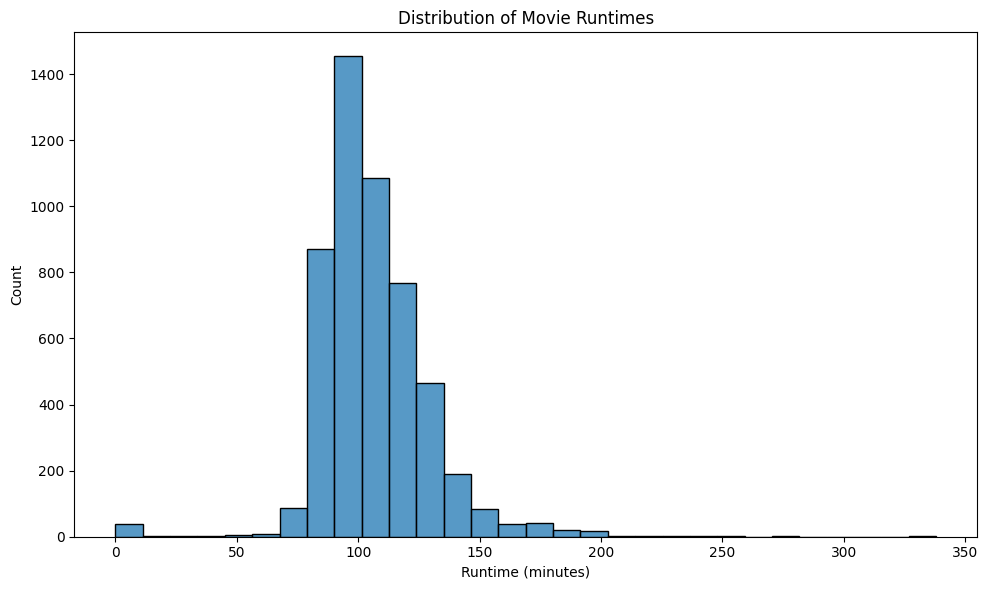

In [126]:
analyze_runtime_distribution(df)

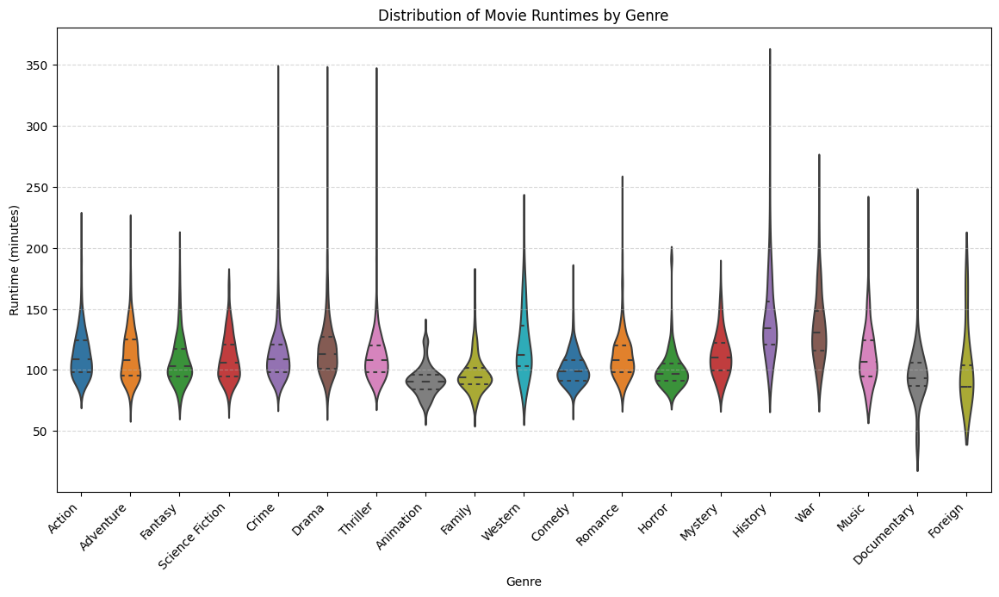

In [127]:
import seaborn as sns
import matplotlib.pyplot as plt

# Explode the dataframe to have separate rows for each genre
df_exploded = df.explode('genre_list')

# Convert revenue to millions for better readability
df_exploded['revenue_millions'] = df_exploded['revenue'] / 1_000_000

# Filter out movies with 0 runtime or revenue
df_filtered = df_exploded[(df_exploded['runtime'] > 0) & (df_exploded['revenue_millions'] > 0)]

# Plot violin plot
plt.figure(figsize=(14, 7))
sns.violinplot(data=df_filtered, x='genre_list', y='runtime', inner="quartile", palette='tab10')

plt.xticks(rotation=45, ha='right')
plt.xlabel("Genre")
plt.ylabel("Runtime (minutes)")
plt.title("Distribution of Movie Runtimes by Genre")
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()


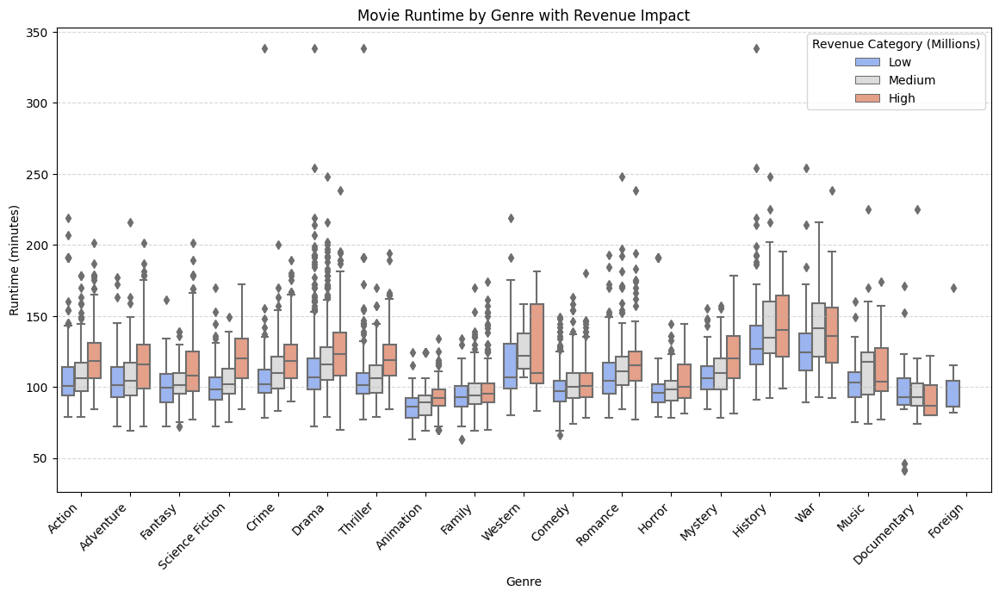

In [128]:
plt.figure(figsize=(14, 7))
sns.boxplot(data=df_filtered, x='genre_list', y='runtime', hue=pd.qcut(df_filtered['revenue_millions'], q=3, labels=['Low', 'Medium', 'High']), palette="coolwarm")

plt.xticks(rotation=45, ha='right')
plt.xlabel("Genre")
plt.ylabel("Runtime (minutes)")
plt.title("Movie Runtime by Genre with Revenue Impact")
plt.legend(title="Revenue Category (Millions)")
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()


/home/mayank/.local/lib/python3.10/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


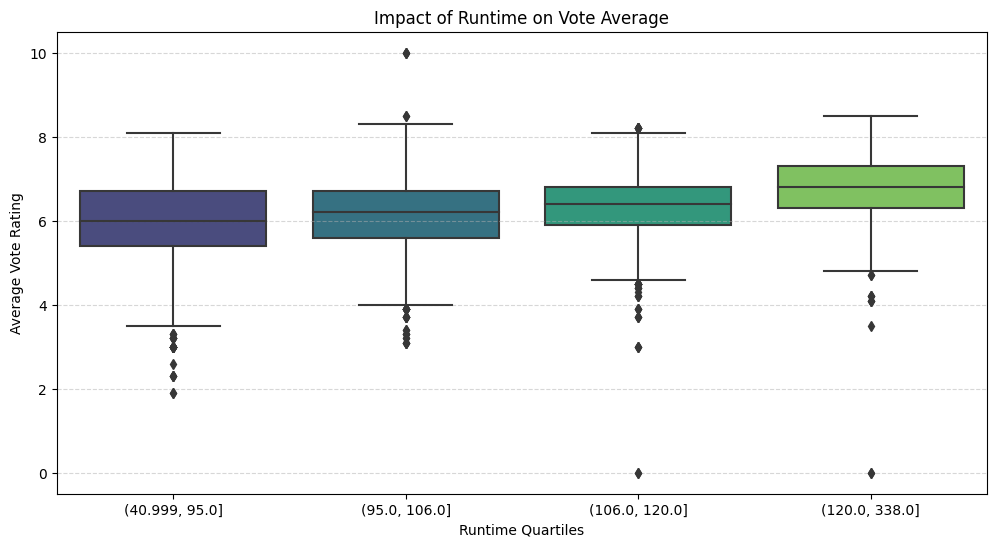

In [129]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_filtered, x=pd.qcut(df_filtered['runtime'], q=4), y='vote_average', palette="viridis")

plt.xlabel("Runtime Quartiles")
plt.ylabel("Average Vote Rating")
plt.title("Impact of Runtime on Vote Average")
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()


/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you wi

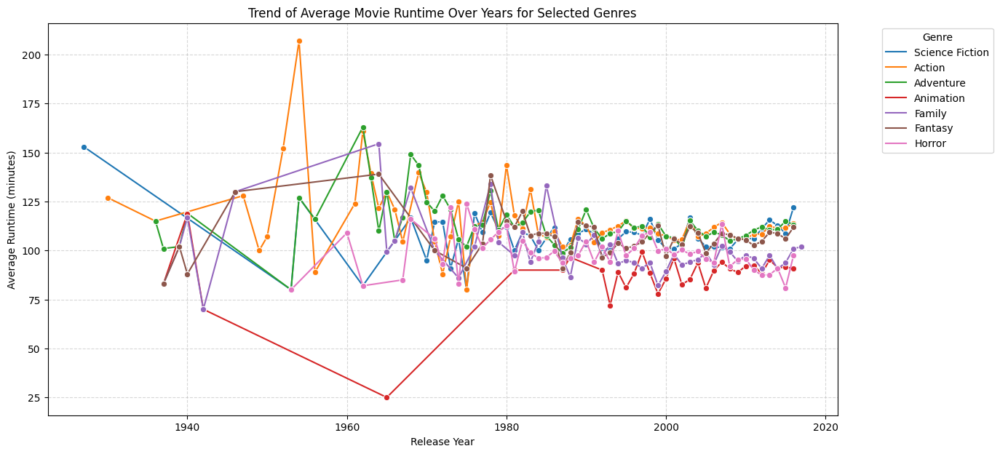

In [130]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Define selected genres
selected_genres = ['Animation', 'Adventure', 'Fantasy', 'Family', 'Horror', 'Science Fiction', 'Action']

# Explode genres to separate rows
df_exploded = df.explode('genre_list')

# Filter only selected genres
df_selected = df_exploded[df_exploded['genre_list'].isin(selected_genres)]

# Group by release_year and genre, then calculate average runtime
avg_runtime_per_year = df_selected.groupby(['release_year', 'genre_list'])['runtime'].mean().reset_index()

# Plot line chart
plt.figure(figsize=(14, 7))
sns.lineplot(data=avg_runtime_per_year, x='release_year', y='runtime', hue='genre_list', marker='o', palette='tab10')

# Formatting
plt.xlabel("Release Year")
plt.ylabel("Average Runtime (minutes)")
plt.title("Trend of Average Movie Runtime Over Years for Selected Genres")
plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()


- Overall Runtime Distribution :

  - Most movies cluster between 90-120 minutes, with the peak around 100 minutes
  - There's a strong right-skewed distribution with fewer films exceeding 150 minutes
  - Very few movies are shorter than 70 minutes or longer than 200 minutes


- Genre Runtime Variations :

  - Animation and Family films tend to be the shortest (medians around 90 minutes)
  - History, War, and Crime genres have the longest typical runtimes
  - History films show the widest spread in runtime, with some exceeding 350 minutes
  - Most genres have a median runtime between 95-110 minutes


- Revenue Impact by Genre :

  - Higher-revenue films (in red) tend to have longer runtimes across most genres
  - War and History films maintain longer runtimes regardless of revenue category
  - The revenue-runtime correlation is particularly strong in Action, Drama, and Sci-Fi
  - Animation and Family films stay relatively short even in high-revenue categories


- Runtime Impact on Ratings :

  - Longer films (120+ minutes) tend to receive higher average ratings
  - The highest-rated quartile is the longest runtime group (120-338 minutes)
  - Rating variability decreases as runtime increases
  - Even the longest films have some outliers with very low ratings


- Historical Trends :

  - Movie runtimes have generally decreased since the 1960s across genres
  - Early Science Fiction films (1930s) were significantly longer than modern ones
  - Animation shows the most dramatic change, with very short runtimes in the 1960s
  - Since the 1980s, runtimes have stabilized across genres between 90-110 minutes
  - There was high runtime volatility between 1950-1980 before standardization

## 9. Is there a trend in movie popularity over the years?

/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


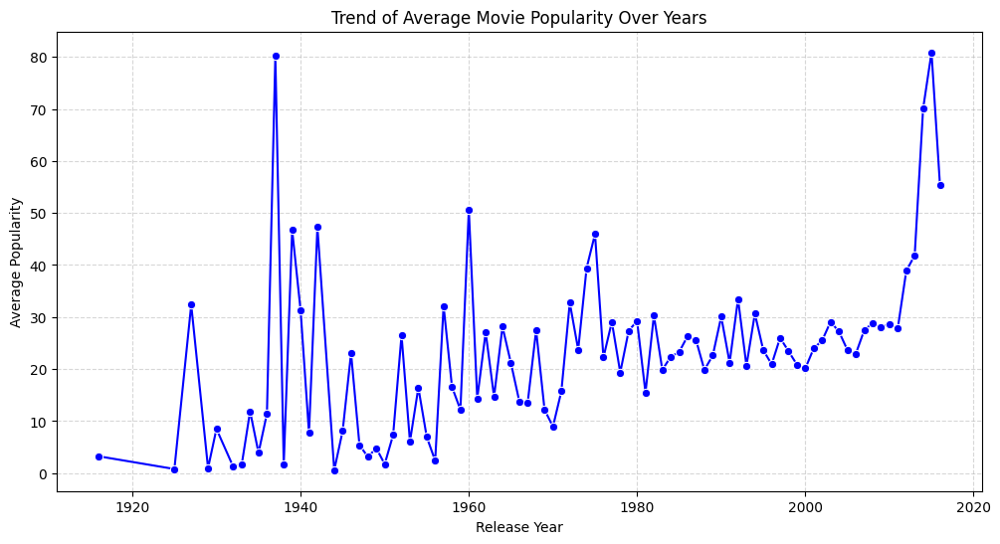

/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you wi

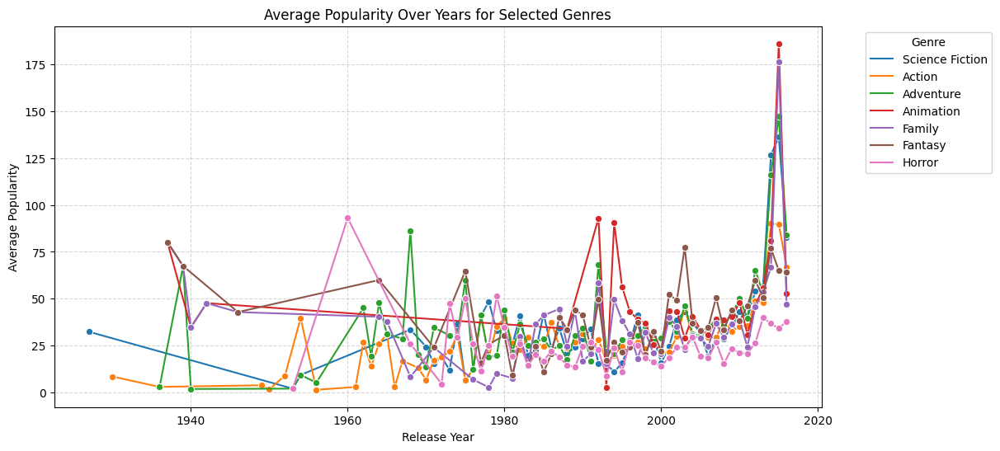

/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you wi

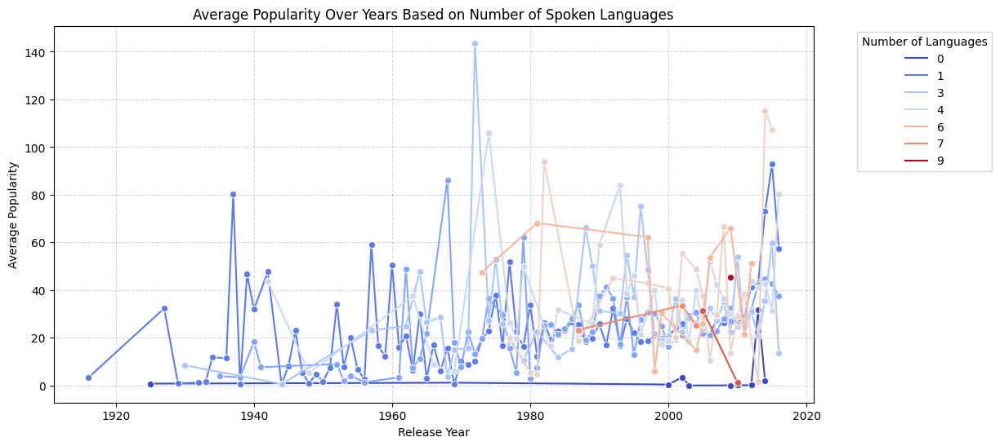

In [131]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Define selected genres
selected_genres = ['Animation', 'Adventure', 'Fantasy', 'Family', 'Horror', 'Science Fiction', 'Action']

# Explode genres for multiple rows per genre
df_exploded = df.explode('genre_list')

# Filter only movies with revenue > 0
df_filtered = df_exploded[df_exploded['revenue'] > 0]

# --- 1️⃣ Overall Trend: Average Popularity vs. Release Year ---
popularity_per_year = df_filtered.groupby('release_year')['popularity'].mean().reset_index()

plt.figure(figsize=(12, 6))
sns.lineplot(data=popularity_per_year, x='release_year', y='popularity', marker='o', color='b')
plt.title("Trend of Average Movie Popularity Over Years")
plt.xlabel("Release Year")
plt.ylabel("Average Popularity")
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

# --- 2️⃣ Trend for Selected Genres ---
popularity_by_genre = df_filtered[df_filtered['genre_list'].isin(selected_genres)]
popularity_by_genre = popularity_by_genre.groupby(['release_year', 'genre_list'])['popularity'].mean().reset_index()

plt.figure(figsize=(12, 6))
sns.lineplot(data=popularity_by_genre, x='release_year', y='popularity', hue='genre_list', marker='o', palette='tab10')
plt.title("Average Popularity Over Years for Selected Genres")
plt.xlabel("Release Year")
plt.ylabel("Average Popularity")
plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

# --- 3️⃣ Trend by Number of Languages ---
popularity_by_languages = df_filtered.groupby(['release_year', 'num_languages'])['popularity'].mean().reset_index()

plt.figure(figsize=(12, 6))
sns.lineplot(data=popularity_by_languages, x='release_year', y='popularity', hue='num_languages', marker='o', palette='coolwarm')
plt.title("Average Popularity Over Years Based on Number of Spoken Languages")
plt.xlabel("Release Year")
plt.ylabel("Average Popularity")
plt.legend(title="Number of Languages", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()


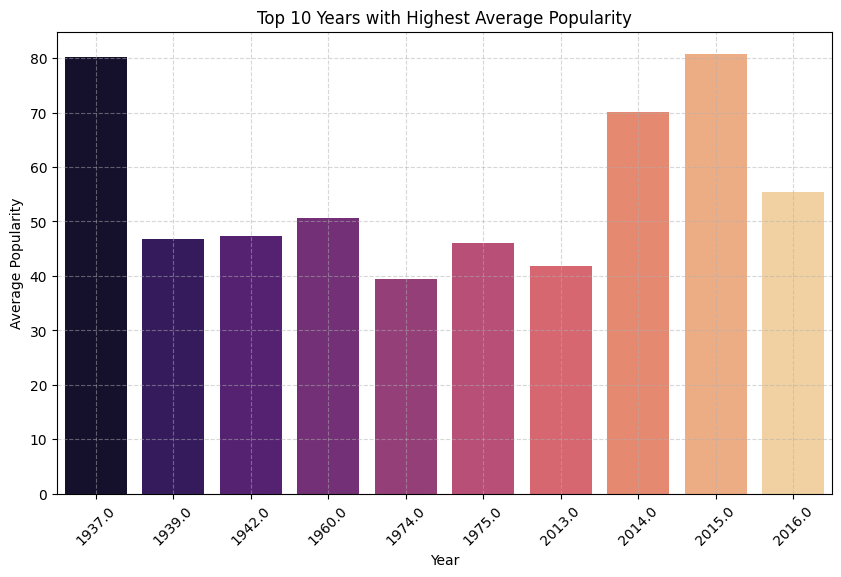

In [132]:
top_years = df_filtered.groupby('release_year')['popularity'].mean().nlargest(10)

plt.figure(figsize=(10, 6))
sns.barplot(x=top_years.index, y=top_years.values, palette='magma')
plt.title("Top 10 Years with Highest Average Popularity")
plt.xlabel("Year")
plt.ylabel("Average Popularity")
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()


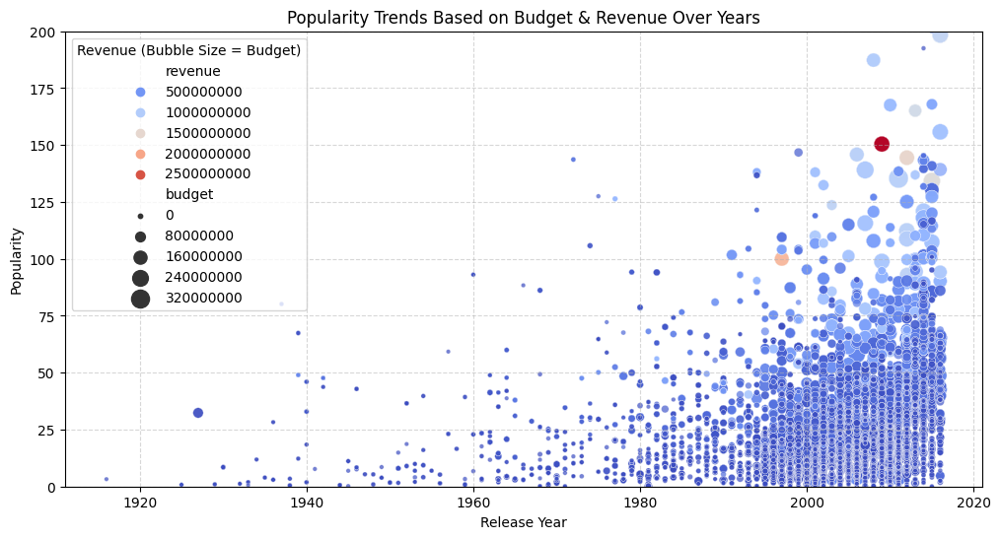

In [133]:
plt.figure(figsize=(12, 6))
sns.scatterplot(data=df_filtered, x='release_year', y='popularity', size='budget', hue='revenue', palette='coolwarm', sizes=(10, 200), alpha=0.7)
plt.title("Popularity Trends Based on Budget & Revenue Over Years")
plt.xlabel("Release Year")
plt.ylim(0,200)
plt.ylabel("Popularity")
plt.legend(title="Revenue (Bubble Size = Budget)")
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()


Looking at these plots about movie popularity trends, I can offer several key observations:
- From the first plot "Trend of Average Movie Popularity Over Years":

  - There are significant popularity spikes around 1940, 1960, and 2015-2018
  - The baseline popularity has gradually increased from 1920 to 2020
  - The 2010s show the most dramatic upward trend in average popularity
  - Two distinct highest peaks appear (around 1940 and 2018), both reaching around 80 on the popularity scale

- From the genre comparison plot:

  - All genres experienced a dramatic popularity spike around 2015-2018
  - Animation (red line) shows particularly strong peaks in the 1990s-2000s
  - Horror (pink line) had a notable surge around 1960
  - Science Fiction (blue line) started strong in the 1930s but declined before rising again
  - Genres tend to move somewhat together in recent decades, suggesting industry-wide trends

- From the languages plot:

  - Movies with more spoken languages (4-6 languages) generally achieved higher popularity, especially after 1980
  - The highest popularity spike (around 145) occurred for 4-language films in the 1970s
  - Silent films (0 languages) remained at very low popularity levels throughout
  - Multilingual films became more common and more successful in recent decades

- From the "Top 10 Years" bar chart:

  - 1937, 2014, and 2015 stand out as particularly strong years for movie popularity
  - Recent years (2014-2016) dominate the top popularity rankings
  - There's a surprising strong showing from 1937, which matches one of the major peaks in the first chart

- From the budget/revenue bubble chart:

  - A clear upward trend in both popularity and revenue starting around 1990
  - Larger budgets (bigger bubbles) correlate with higher popularity ratings, especially after 2000
  - The highest-revenue films (darkest blue) cluster in the most recent decades
  - Maximum popularity ratings have increased dramatically in the 2000s-2010s
  - Virtually no high-popularity films (>100) existed before 1960

- Overall insights:

  - Movie popularity has dramatically increased in the digital/streaming era (post-2000)
  - Higher budgets and multilingual productions correlate with increased popularity
  - All genres experienced a significant popularity boost in the mid-2010s
  - There were notable golden ages around 1940 and 2015
  - The overall trend shows popularity increasing with time, with the steepest rise in the last two decades

## 10. How do production countries affect global revenue?

In [134]:
def extract_countries(country_data):
    if isinstance(country_data, list):  # Ensure input is a list
        return [country['name'] for country in country_data if 'name' in country]
    return []  # Return an empty list if input is not a list

# Apply function and create a new column
df['country_name'] = df['production_countries'].apply(extract_countries)

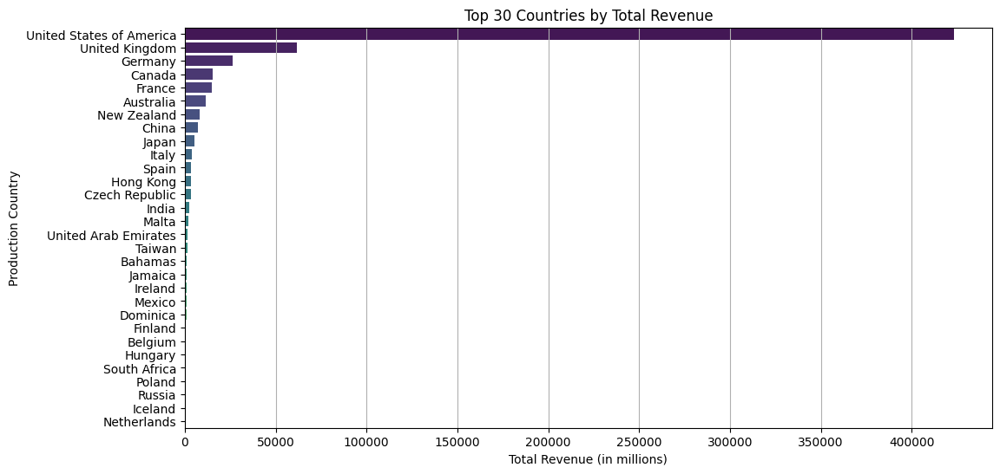

In [135]:
import matplotlib.pyplot as plt
import seaborn as sns

# Explode country_name to create multiple rows for each country
df_exploded = df.explode('country_name')

# Aggregate total revenue per country
country_revenue = df_exploded[df_exploded['revenue'] > 0].groupby('country_name')['revenue'].sum().sort_values(ascending=False).head(30)

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(x=country_revenue.values / 1e6, y=country_revenue.index, palette='viridis')
plt.xlabel('Total Revenue (in millions)')
plt.ylabel('Production Country')
plt.title('Top 30 Countries by Total Revenue')
plt.grid(axis='x')
plt.show()


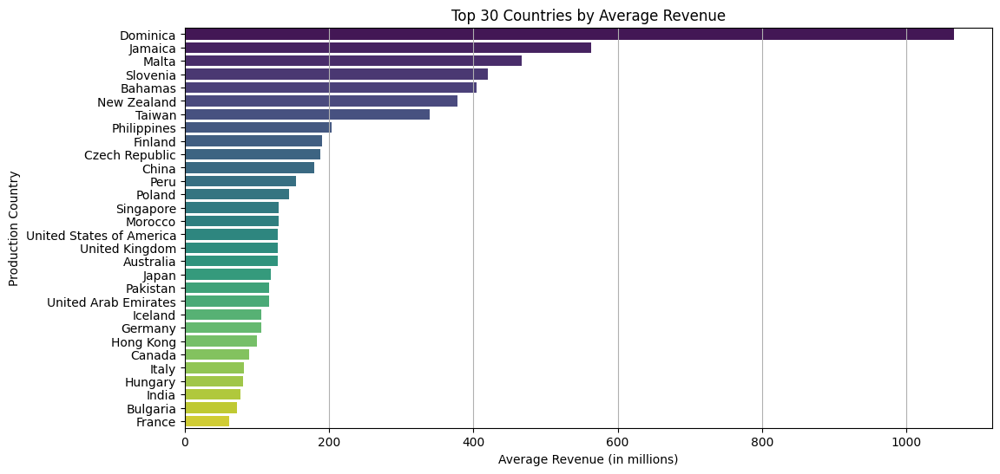

In [136]:
import matplotlib.pyplot as plt
import seaborn as sns

# Explode country_name to create multiple rows for each country
df_exploded = df.explode('country_name')

# Aggregate total revenue per country
country_revenue = df_exploded[df_exploded['revenue'] > 0].groupby('country_name')['revenue'].mean().sort_values(ascending=False).head(30)

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(x=country_revenue.values / 1e6, y=country_revenue.index, palette='viridis')
plt.xlabel('Average Revenue (in millions)')
plt.ylabel('Production Country')
plt.title('Top 30 Countries by Average Revenue')
plt.grid(axis='x')
plt.show()


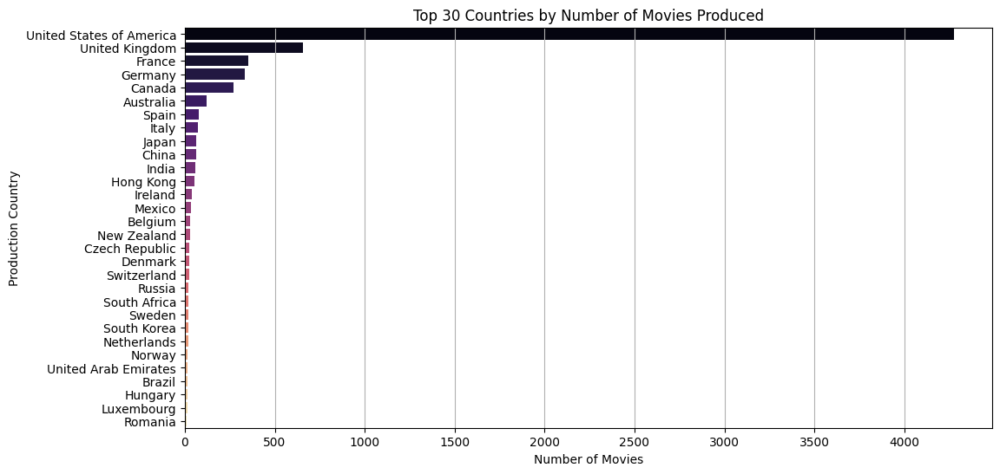

In [137]:
plt.figure(figsize=(12, 6))

# Count occurrences of each country
country_movie_count = df_exploded['country_name'].value_counts().head(30)

# Bar plot
sns.barplot(x=country_movie_count.values, y=country_movie_count.index, palette='magma')
plt.xlabel('Number of Movies')
plt.ylabel('Production Country')
plt.title('Top 30 Countries by Number of Movies Produced')
plt.grid(axis='x')
plt.show()


In [138]:
df.shape

(5195, 33)

/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you wi

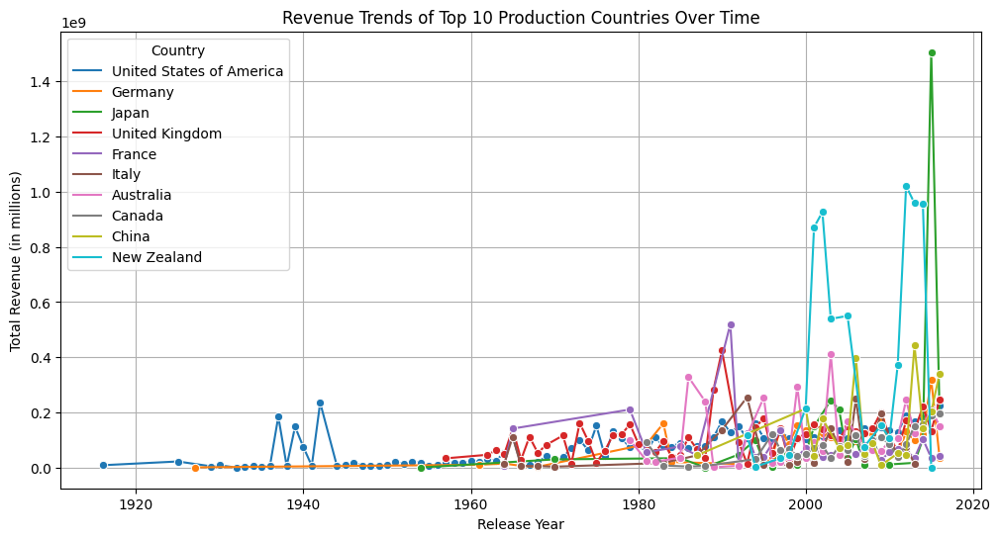

In [139]:
# Select top 5 revenue-generating countries
top_countries = df_exploded[df_exploded['revenue'] > 0].groupby('country_name')['revenue'].sum().nlargest(10).index

# Filter dataset
df_filtered = df_exploded[df_exploded['country_name'].isin(top_countries) & (df_exploded['revenue'] > 0)]

# Line plot of average revenue over years
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_filtered.groupby(['release_year', 'country_name'])['revenue'].mean().reset_index(),
             x='release_year', y='revenue', hue='country_name', palette='tab10', marker='o')

plt.xlabel('Release Year')
plt.ylabel('Total Revenue (in millions)')
plt.title('Revenue Trends of Top 10 Production Countries Over Time')
plt.grid()
plt.legend(title="Country")
plt.show()


/tmp/ipykernel_96076/4158330197.py:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=df_filtered, x='genre_list', y='revenue', hue='country_name', estimator=sum, ci=None, palette='Set2')


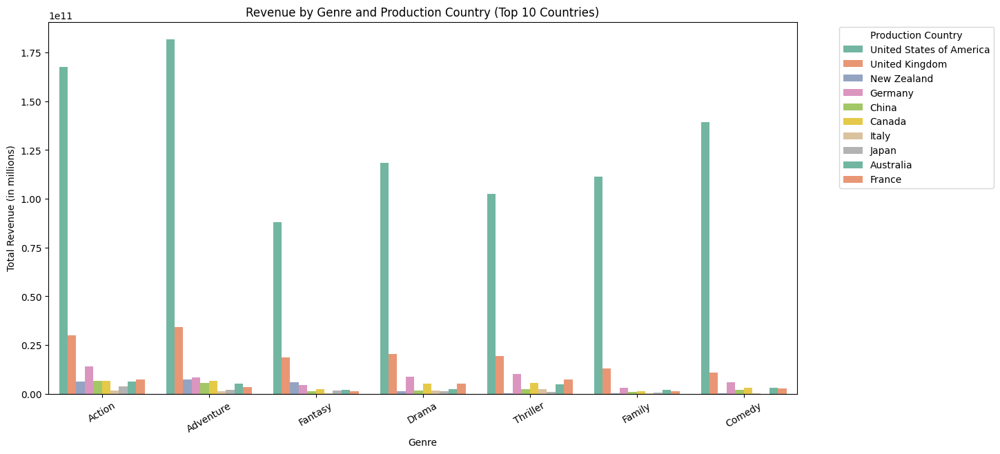

In [140]:
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure genre_list and country_name are exploded
df_exploded = df.explode('genre_list').explode('country_name')

# Select top 7 revenue-generating genres
top_genres = df_exploded[df_exploded['revenue'] > 0].groupby('genre_list')['revenue'].sum().nlargest(7).index

# Select top 10 revenue-generating countries
top_countries = df_exploded[df_exploded['revenue'] > 0].groupby('country_name')['revenue'].sum().nlargest(10).index

# Filter dataset for top genres and top countries with revenue > 0
df_filtered = df_exploded[
    df_exploded['genre_list'].isin(top_genres) & 
    df_exploded['country_name'].isin(top_countries) & 
    (df_exploded['revenue'] > 0)
]

# Bar plot for revenue by genre and country
plt.figure(figsize=(14, 7))
sns.barplot(data=df_filtered, x='genre_list', y='revenue', hue='country_name', estimator=sum, ci=None, palette='Set2')

plt.xlabel('Genre')
plt.ylabel('Total Revenue (in millions)')
plt.title('Revenue by Genre and Production Country (Top 10 Countries)')
plt.xticks(rotation=30)
plt.legend(title="Production Country", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


- Looking at these plots about movie production countries and revenue, I can offer several key observations:
  - From the "Top 30 Countries by Total Revenue" chart:
    - The United States dominates global movie revenue by an extraordinary margin, generating several times more revenue than any other country
    - The United Kingdom is in second place but with less than 25% of the US total
    - Germany, Canada, and France round out the top five, but with relatively modest revenue compared to the US
    - There's a steep dropoff after the top 5-6 countries

  - From the "Top 30 Countries by Average Revenue" chart:

    - Smaller countries like Dominica and Jamaica lead in average revenue per film but it is due to low movie count (outlier)
    - Many countries with lower total revenue actually have higher average revenue per film than major producers
    - The US and UK rank around the middle in terms of average revenue per film
    - This suggests smaller countries may be more selective about which films they produce

  - From the "Top 30 Countries by Number of Movies Produced" chart:

    - The US produces significantly more movies than any other country
    - The UK is second but produces less than half the number of US films
    - France, Germany, and Canada round out the top five production countries
    - The distribution mirrors the total revenue chart, suggesting a correlation between quantity of films and total revenue

  - From the "Revenue Trends of Top 10 Production Countries Over Time" chart:

    - All countries show dramatic revenue growth starting in the 1990s-2000s
    - Japan shows an exceptional revenue spike around 2015-2020
    - The US has consistently led in revenue throughout film history
    - New Zealand shows notable revenue spikes despite its small size, likely due to major film franchises
    - Revenue volatility has increased for all countries in recent decades

  - From the "Revenue by Genre and Production Country" chart:

    - The US dominates revenue across all genres
    - Adventure films generate the highest revenue for the US
    - The UK performs strongest in Adventure and Action genres
    - Germany has notable revenue in Action, Adventure, and Drama
    - Most countries show a similar pattern of which genres perform best, with Adventure, Action, Comedy, and Drama typically leading

  - Overall insights:

    - The US film industry thoroughly dominates global cinema revenue and production volume
    - Smaller countries can achieve higher average revenue per film by being more selective
    - Recent decades show dramatic revenue growth across all major production countries
    - Certain genres (Adventure, Action) consistently generate higher revenue across countries
    - Countries like New Zealand and Japan can achieve outsized revenue with specific successful projects
    - The UK maintains a strong second position across most metrics
    - Despite globalization, revenue concentration remains heavily skewed toward a few key countries
    - The pattern suggests that film industry infrastructure and investment correlate strongly with output and revenue

## 11. What's the ROI (Return on Investment) distribution across genres?

In [141]:
def extract_companies(company_data):
    if isinstance(company_data, list):  # Ensure input is a list
        return [company['name'] for company in company_data if 'name' in company]
    return []  # Return an empty list if input is not a list

# Apply function and create a new column
df['companies_name'] = df['production_companies'].apply(extract_companies)

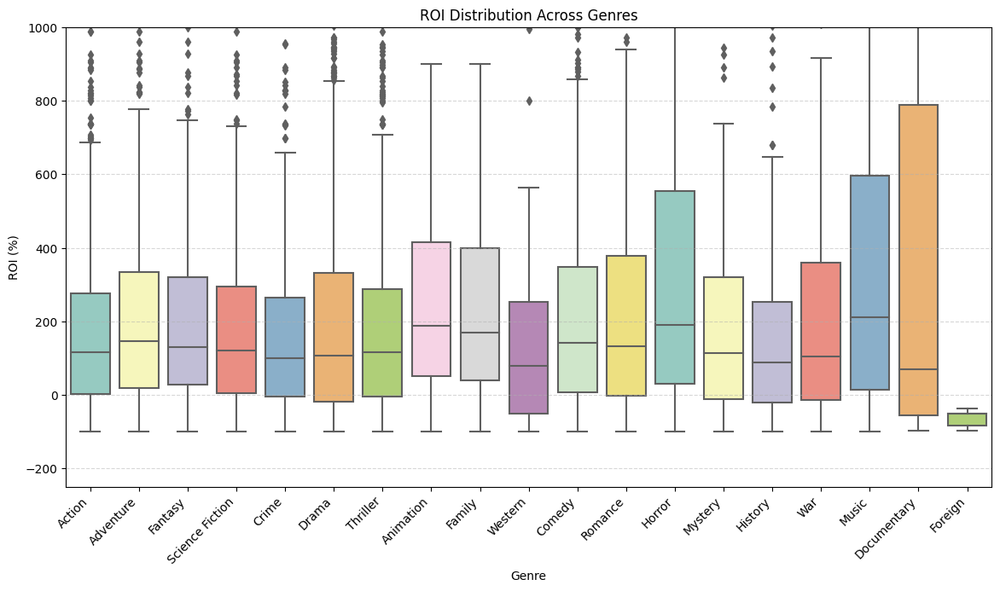

In [142]:
import seaborn as sns
import matplotlib.pyplot as plt

# Explode genres so each movie appears with each genre
df_genres = df.explode('genre_list')

# Filter movies with valid ROI (and revenue > 0 for safety)
df_genres = df_genres[(df_genres['revenue'] > 0) & (df_genres['roi'] != 0)]

plt.figure(figsize=(14, 7))
sns.boxplot(data=df_genres, x='genre_list', y='roi', palette='Set3')
plt.xticks(rotation=45, ha='right')
plt.title("ROI Distribution Across Genres")
plt.xlabel("Genre")
plt.ylim(-250,1000)
plt.ylabel("ROI (%)")
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()


/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


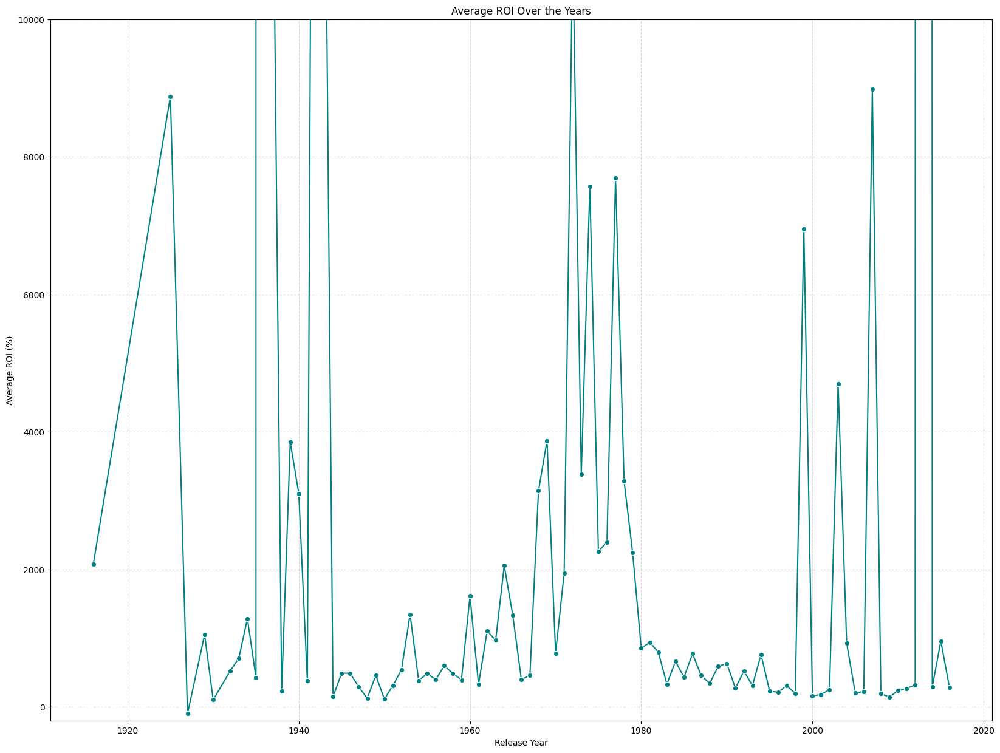

/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you wi

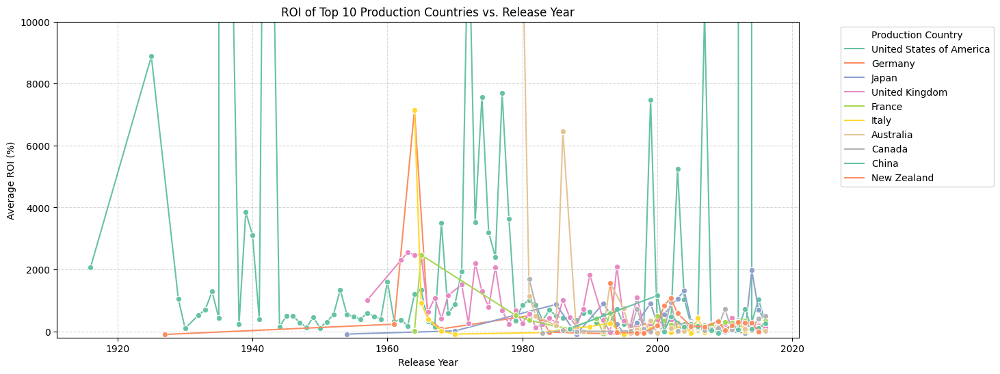

/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you wi

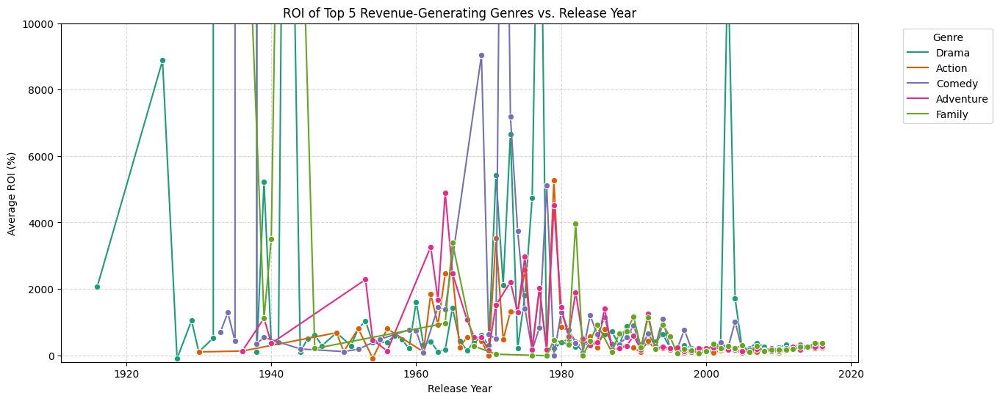

In [143]:
# Filter movies with valid ROI and revenue
df_valid = df[df['revenue'] > 0]

# --- Plot 1: Average ROI Over the Years ---
roi_year = df_valid.groupby('release_year')['roi'].mean().reset_index()

plt.figure(figsize=(20, 15))
sns.lineplot(data=roi_year, x='release_year', y='roi', marker='o', color='teal')
plt.title("Average ROI Over the Years")
plt.xlabel("Release Year")
plt.ylabel("Average ROI (%)")
plt.ylim(-200,10000)
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

# --- Plot 2: ROI of Top 10 Production Countries vs. Release Year ---
# Explode countries (if needed)
df_countries = df_valid.explode('country_name')

# Get top 10 production countries by total revenue
top_countries = df_countries.groupby('country_name')['revenue'].sum().nlargest(10).index
df_top_countries = df_countries[df_countries['country_name'].isin(top_countries)]

# Compute average ROI per country per year
roi_countries_year = df_top_countries.groupby(['release_year', 'country_name'])['roi'].mean().reset_index()

plt.figure(figsize=(14, 6))
sns.lineplot(data=roi_countries_year, x='release_year', y='roi', hue='country_name', marker='o', palette='Set2')
plt.title("ROI of Top 10 Production Countries vs. Release Year")
plt.xlabel("Release Year")
plt.ylim(-200,10000)
plt.ylabel("Average ROI (%)")
plt.legend(title="Production Country", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

# --- Plot 3: ROI of Top 5 Revenue-Generating Genres vs. Release Year ---
# Explode genres (if needed)
df_genres = df_valid.explode('genre_list')

# Get top 5 revenue-generating genres
top_genres = df_genres.groupby('genre_list')['revenue'].sum().nlargest(5).index
df_top_genres = df_genres[df_genres['genre_list'].isin(top_genres)]

# Compute average ROI per genre per year
roi_genres_year = df_top_genres.groupby(['release_year', 'genre_list'])['roi'].mean().reset_index()

plt.figure(figsize=(14, 6))
sns.lineplot(data=roi_genres_year, x='release_year', y='roi', hue='genre_list', marker='o', palette='Dark2')
plt.title("ROI of Top 5 Revenue-Generating Genres vs. Release Year")
plt.xlabel("Release Year")
plt.ylim(-200,10000)
plt.ylabel("Average ROI (%)")
plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()


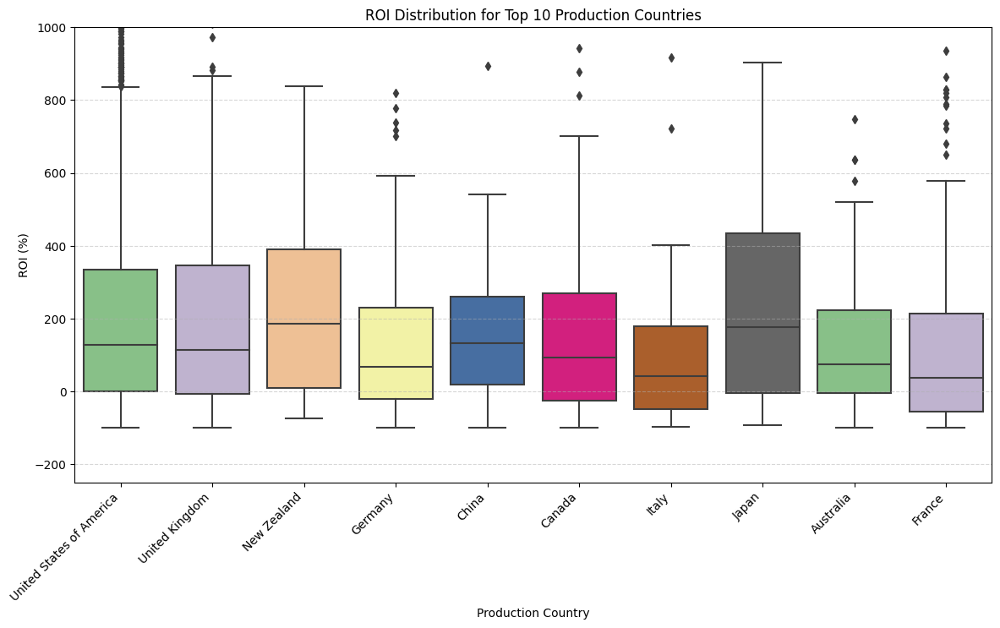

In [144]:
# Explode country_name if not done already (each movie may have multiple production countries)
df_countries = df.explode('country_name')

# Filter movies with revenue > 0
df_countries = df_countries[df_countries['revenue'] > 0]

# Get top 10 countries by total revenue
top_countries = df_countries.groupby('country_name')['revenue'].sum().nlargest(10).index
df_top_countries = df_countries[df_countries['country_name'].isin(top_countries)]

plt.figure(figsize=(14, 7))
sns.boxplot(data=df_top_countries, x='country_name', y='roi', palette='Accent')
plt.xticks(rotation=45, ha='right')
plt.ylim(-250,1000)
plt.title("ROI Distribution for Top 10 Production Countries")
plt.xlabel("Production Country")
plt.ylabel("ROI (%)")
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()


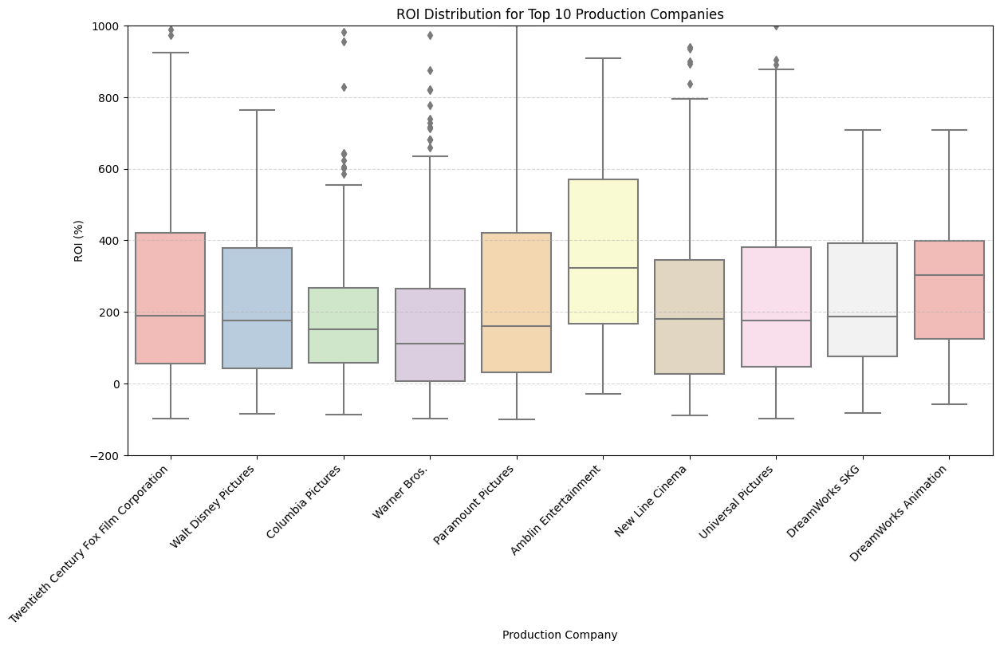

In [145]:
# Explode production_companies if needed
# Assuming df['production_companies'] is already preprocessed (or similar to production_countries)
# For demonstration, we'll assume df['production_companies'] is a list of company names.
df_companies = df.explode('companies_name')

# Filter movies with revenue > 0
df_companies = df_companies[df_companies['revenue'] > 0]

# Identify top 10 companies by total revenue
top_companies = df_companies.groupby('companies_name')['revenue'].sum().nlargest(10).index
df_top_companies = df_companies[df_companies['companies_name'].isin(top_companies)]

plt.figure(figsize=(14, 7))
sns.boxplot(data=df_top_companies, x='companies_name', y='roi', palette='Pastel1')
plt.xticks(rotation=45, ha='right')
plt.title("ROI Distribution for Top 10 Production Companies")
plt.xlabel("Production Company")
plt.ylabel("ROI (%)")
plt.ylim(-200,1000)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()


/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you wi

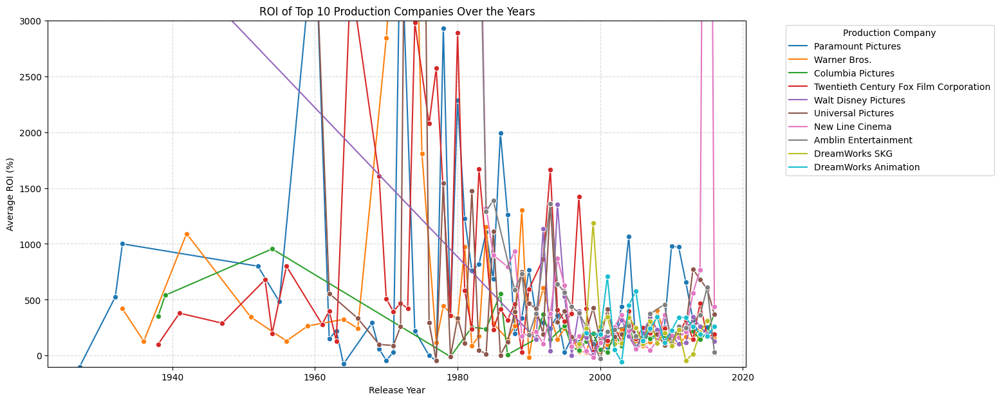

In [146]:
roi_companies_year = df_top_companies.groupby(['release_year', 'companies_name'])['roi'].mean().reset_index()

plt.figure(figsize=(14, 7))
sns.lineplot(data=roi_companies_year, x='release_year', y='roi', hue='companies_name', marker='o', palette='tab10')
plt.title("ROI of Top 10 Production Companies Over the Years")
plt.xlabel("Release Year")
plt.ylabel("Average ROI (%)")
plt.ylim(-100,3000)
plt.legend(title="Production Company", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

In [147]:
df_genres['roi']

0       1076.356577
0       1076.356577
0       1076.356577
0       1076.356577
1        220.333333
           ...     
4795    5968.000000
4795    5968.000000
4797     827.690909
4797     827.690909
4797     827.690909
Name: roi, Length: 9735, dtype: float64

- Based on the images , I'll analyze the ROI distribution across film genres and production factors. Here are my observations and insights:
  - From ROI Distribution Across Genres:

    - Documentary and Music genres show the highest median ROI, followed by Horror
    - Foreign films have the lowest and most consistent ROI distribution
    - Animation and Family genres show wide distributions with high outliers
    - Most genres have extreme outliers reaching close to 1000% ROI
    - Horror stands out with high median returns despite relatively lower budgets
    - Western genres show more negative returns compared to others

  - From Average ROI Over Years and By Country:

    - Extremely high ROI spikes appear periodically, with major peaks around 1940, 1970s, and early 2000s
    - The United States dominates high ROI productions historically
    - Italy had a significant ROI spike in the 1960s
    - Australia showed strong performance in the 1980s
    - Overall ROI volatility has decreased since the 1980s, with returns generally lower but more consistent
    - Recent years show fewer extreme outlier successes compared to earlier decades

  - From Top 5 Revenue-Generating Genres:

    - Drama has historically produced the highest ROI spikes
    - Comedy showed strong performance in the 1970s
    - All top genres have converged to more modest returns in recent decades
    - Adventure films maintained relatively stable returns compared to other genres

  - From Production Countries and Companies:

    - Japan has the highest median ROI among top production countries
    - New Zealand shows strong performance with higher median returns
    - Amblin Entertainment stands out with higher median ROI among production companies
    - Warner Bros. shows significant outlier successes despite a moderate median ROI
    - Most production companies operate with similar median ROI ranges (100-200%)

  - From ROI Over Time by Company:

    - Peak ROI periods occurred in the 1960s-1980s across multiple studios
    - A general downward trend in extreme ROI values over time for all companies
    - New Line Cinema had a notable spike around 2000s
    - Overall convergence toward lower, more stable returns in recent decades

The data suggests that while blockbuster returns were more common in earlier decades, the film industry has evolved toward more predictable but lower ROI productions, with certain genres (Documentary, Music, Horror) and companies (Amblin) maintaining better average performance.

## 12. Is there a correlation between movie tagline length and popularity?

/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/mayank/.local/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


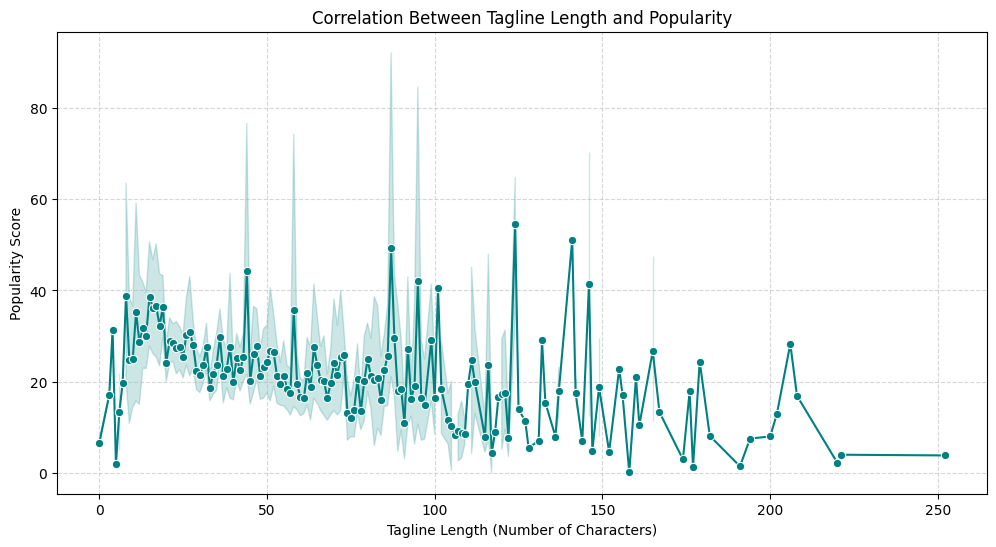

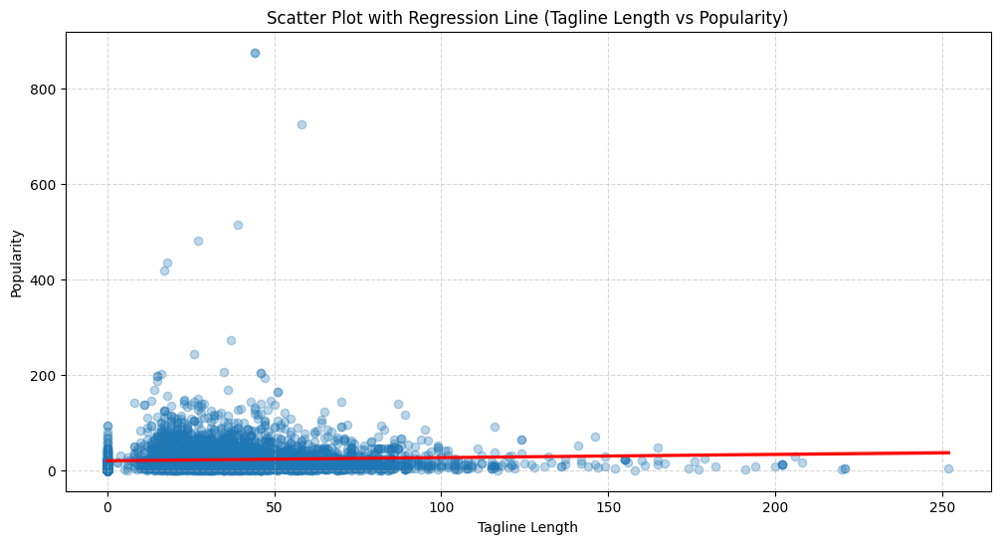

/home/mayank/.local/lib/python3.10/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


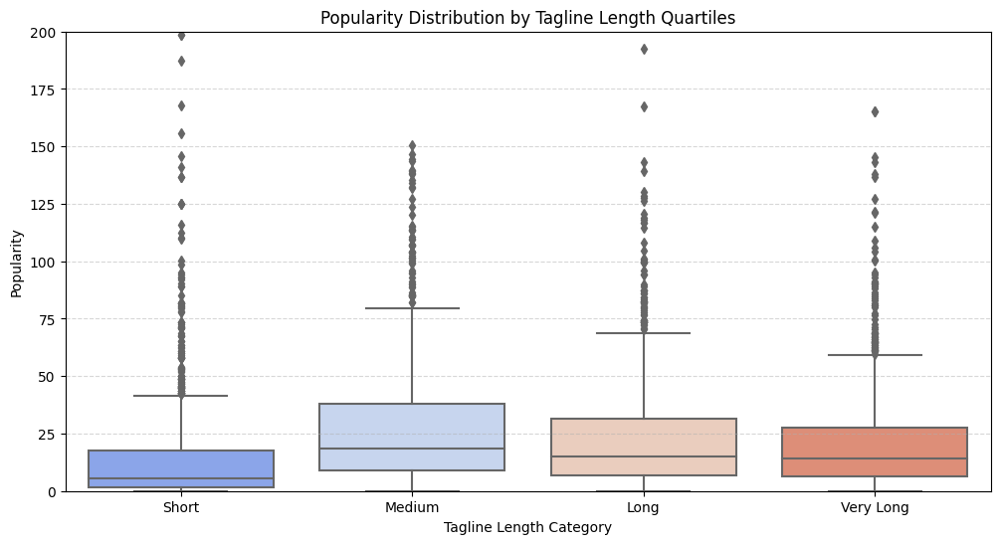

In [148]:

plt.figure(figsize=(12, 6))
sns.lineplot(data=df, x='tagline_length', y='popularity', marker='o', color='teal')
plt.title("Correlation Between Tagline Length and Popularity")
plt.xlabel("Tagline Length (Number of Characters)")
plt.ylabel("Popularity Score")
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

plt.figure(figsize=(12, 6))
sns.regplot(data=df, x='tagline_length', y='popularity', scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'})
plt.title("Scatter Plot with Regression Line (Tagline Length vs Popularity)")
plt.xlabel("Tagline Length")
plt.ylabel("Popularity")
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

df['tagline_length_quartile'] = pd.qcut(df['tagline_length'], q=4, labels=['Short', 'Medium', 'Long', 'Very Long'])

plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='tagline_length_quartile', y='popularity', palette="coolwarm")
plt.title("Popularity Distribution by Tagline Length Quartiles")
plt.xlabel("Tagline Length Category")
plt.ylabel("Popularity")
plt.ylim(0,200)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()



- From the three plots showing the relationship between movie tagline length and popularity, I can offer several observations and insights:
  - Correlation Between Tagline Length and Popularity:

    - There's a general downward trend in popularity as tagline length increases
    - The highest popularity scores tend to cluster in the 10-60 character range
    - Variability (shown by the shaded confidence interval) is greatest in the 20-40 character range
    - Popularity scores rarely exceed 60 for most tagline lengths
    - Very long taglines (>150 characters) consistently show low popularity scores

  - Scatter Plot with Regression Line:

    - The regression line (red) shows a slight negative correlation between tagline length and popularity
    - There are several high-performing outliers, particularly in the 30-50 character range
    - The vast majority of data points cluster at the lower end of the popularity scale (0-50)
    - The data is heavily skewed, with a few extremely popular films (popularity >400)
    - The density of points decreases significantly as tagline length exceeds 100 characters

  - Popularity Distribution by Tagline Length Quartiles :

    - Medium-length taglines show the highest median popularity
    - Short taglines have the lowest median popularity
    - All quartiles have similar outlier patterns, with extreme popularity values reaching 150-200
    - The interquartile range (box height) is largest for medium taglines, indicating greater variability
    - Long and very long taglines show similar popularity distributions
    - Extreme outliers appear across all length categories

  - Key insights:

    - There appears to be a "sweet spot" for tagline length in the medium range, which balances effectiveness with conciseness
    - While overall correlation is negative (longer = less popular), the relationship isn't strong or straightforward
    - Factors beyond tagline length clearly influence popularity, as shown by outliers across all categories
    - Extremely short taglines may underperform because they fail to convey enough information or intrigue
    - The data suggests that while tagline length matters, it's just one of many factors affecting a film's popularity

The optimal strategy appears to be aiming for medium-length taglines (likely 20-60 characters) that can effectively communicate the film's appeal without becoming overly wordy.